# Codigo base

In [ ]:
source("utils.r")

# Cargar datos

In [ ]:
# Example of how to call the function
url <- "https://github.com/mbarrena/tesis/raw/refs/heads/main/data/Data%20trimestral%201950%20a%202023%20PRUEBA.xlsx"
temp_file <- tempfile(fileext = ".xlsx")
GET(url, write_disk(temp_file, overwrite = TRUE))

# Read the `data` from the Excel file
df_trimestral_crudo <- read_excel(temp_file)

Response [https://raw.githubusercontent.com/mbarrena/tesis/refs/heads/main/data/Data%20trimestral%201950%20a%202023%20PRUEBA.xlsx]
  Date: 2025-08-27 16:13
  Status: 200
  Content-Type: application/octet-stream
  Size: 55.6 kB
<ON DISK>  /var/folders/59/6k0yx0n916gg1mdb04zs42rm0000gn/T//RtmpgtZuyR/file10d62ecede8.xlsxNULL

In [ ]:
# Select specific columns and rows from df_trimestral_crudo
df_Arg <- df_trimestral_crudo |> 
  dplyr::select(año, trimestre, ipc_ajust, E, Ebc, pbird, impp_usa, Psoja_USA, Pmaíz_USA, Ptrigo_USA, TOTfmi) |>  # nolint
  as.data.frame()  # Convert to data frame (if needed)

# Rename "ipc_ajust" to "ipc"
df_Arg <- renameColumnOfDataframe(df_Arg, "ipc_ajust", "ipc")

# Display first 6 rows
print(head(df_Arg))

# Display first 65 rows
print(head(df_Arg, 65))

   año trimestre          ipc            E          Ebc  pbird impp_usa
1 1950      1ºTr 3.153126e-12 9.020000e-13 9.020000e-13 141630       NA
2 1950      2ºTr 3.385298e-12 9.020000e-13 9.020000e-13 139320       NA
3 1950      3ºTr 3.553683e-12 1.082330e-12 1.082330e-12 144669       NA
4 1950      4ºTr 3.806171e-12 1.403200e-12 1.403200e-12 142804       NA
5 1951      1ºTr 3.893961e-12 1.405173e-12 1.405173e-12 146731       NA
6 1951      2ºTr 4.559823e-12 1.412013e-12 1.412013e-12 148515       NA
  Psoja_USA Pmaíz_USA Ptrigo_USA TOTfmi
1  2.160000  1.166667   1.943333     NA
2  2.663333  1.320000   2.060000     NA
3  2.536667  1.440000   1.966667     NA
4  2.423333  1.396667   1.953333     NA
5  3.026667  1.580000   2.140000     NA
6  3.076667  1.626667   2.110000     NA
    año trimestre          ipc            E          Ebc  pbird impp_usa
1  1950      1ºTr 3.153126e-12 9.020000e-13 9.020000e-13 141630       NA
2  1950      2ºTr 3.385298e-12 9.020000e-13 9.020000e-13 139320       

In [ ]:
# Copy df_Arg to df_ERPT_Arg1
df_ERPT_Arg1 <- df_Arg

# Display first rows
print(head(df_ERPT_Arg1))

# Apply logarithm to specific columns
df_ERPT_Arg1 <- makeLogColumns(c("ipc", "E", "Ebc", "pbird", "impp_usa", "Psoja_USA", "Pmaíz_USA", "Ptrigo_USA", "TOTfmi"), df_ERPT_Arg1) # nolint: line_length_linter.

# Display transformed dataframe
print(head(df_ERPT_Arg1))
print(tail(df_ERPT_Arg1))

   año trimestre          ipc            E          Ebc  pbird impp_usa
1 1950      1ºTr 3.153126e-12 9.020000e-13 9.020000e-13 141630       NA
2 1950      2ºTr 3.385298e-12 9.020000e-13 9.020000e-13 139320       NA
3 1950      3ºTr 3.553683e-12 1.082330e-12 1.082330e-12 144669       NA
4 1950      4ºTr 3.806171e-12 1.403200e-12 1.403200e-12 142804       NA
5 1951      1ºTr 3.893961e-12 1.405173e-12 1.405173e-12 146731       NA
6 1951      2ºTr 4.559823e-12 1.412013e-12 1.412013e-12 148515       NA
  Psoja_USA Pmaíz_USA Ptrigo_USA TOTfmi
1  2.160000  1.166667   1.943333     NA
2  2.663333  1.320000   2.060000     NA
3  2.536667  1.440000   1.966667     NA
4  2.423333  1.396667   1.953333     NA
5  3.026667  1.580000   2.140000     NA
6  3.076667  1.626667   2.110000     NA
   año trimestre       ipc         E       Ebc    pbird impp_usa Psoja_USA
1 1950      1ºTr -26.48263 -27.73416 -27.73416 11.86097       NA 0.7701082
2 1950      2ºTr -26.41158 -27.73416 -27.73416 11.84453       NA 0

In [ ]:
# Create df_ERPT_Arg as a copy of df_Arg
df_ERPT_Arg <- df_Arg

# Display first rows
print(head(df_ERPT_Arg))

# Apply logarithm transformation
df_ERPT_Arg <- makeLogColumns(c("ipc", "E", "Ebc", "pbird", "impp_usa", "Psoja_USA", "Pmaíz_USA", "Ptrigo_USA", "TOTfmi"), df_ERPT_Arg)

# Display transformed dataframe
print(head(df_ERPT_Arg))

# Apply differencing transformation
df_ERPT_Arg <- makeDiffColumns(c("ipc", "E", "Ebc", "pbird", "impp_usa", "Psoja_USA", "Pmaíz_USA", "Ptrigo_USA", "TOTfmi"), df_ERPT_Arg)

# Display first and last rows
print(head(df_ERPT_Arg))
print(tail(df_ERPT_Arg, 90))

   año trimestre          ipc            E          Ebc  pbird impp_usa
1 1950      1ºTr 3.153126e-12 9.020000e-13 9.020000e-13 141630       NA
2 1950      2ºTr 3.385298e-12 9.020000e-13 9.020000e-13 139320       NA
3 1950      3ºTr 3.553683e-12 1.082330e-12 1.082330e-12 144669       NA
4 1950      4ºTr 3.806171e-12 1.403200e-12 1.403200e-12 142804       NA
5 1951      1ºTr 3.893961e-12 1.405173e-12 1.405173e-12 146731       NA
6 1951      2ºTr 4.559823e-12 1.412013e-12 1.412013e-12 148515       NA
  Psoja_USA Pmaíz_USA Ptrigo_USA TOTfmi
1  2.160000  1.166667   1.943333     NA
2  2.663333  1.320000   2.060000     NA
3  2.536667  1.440000   1.966667     NA
4  2.423333  1.396667   1.953333     NA
5  3.026667  1.580000   2.140000     NA
6  3.076667  1.626667   2.110000     NA
   año trimestre       ipc         E       Ebc    pbird impp_usa Psoja_USA
1 1950      1ºTr -26.48263 -27.73416 -27.73416 11.86097       NA 0.7701082
2 1950      2ºTr -26.41158 -27.73416 -27.73416 11.84453       NA 0

# Regresiones

### Psoja_USA 1950 a 2023 - Todas endógenas - Selected orders: 2 y 3 

Selected orders (en notebook: "selected_orders.ipynb): 

In [1]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Psoja_USA", "E", "ipc", "pbird"), fixed_lags = 2, horizons=10, signif = 0.95)

ERROR: Error in run_lp_model(df_ERPT_Arg, endog = c("Psoja_USA", "E", "ipc", : could not find function "run_lp_model"


Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Psoja_USA, E, ipc, pbird",4


LocalProjection (without exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.000000000,0.000000000,0.00000000
79,ipc,E,2,-0.150055299,-0.349605289,0.04949469
80,ipc,E,3,0.279773135,0.104462737,0.45508353
81,ipc,E,4,0.288918120,0.007226593,0.57060965
82,ipc,E,5,0.424729672,0.251530639,0.59792870
83,ipc,E,6,-0.050897428,-0.187021620,0.08522676
84,ipc,E,7,0.183161438,0.043136759,0.32318612
85,ipc,E,8,0.104098576,-0.109011465,0.31720862
86,ipc,E,9,-0.025439788,-0.152272291,0.10139272


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.00000000,0.00000000,0.00000000
112,pbird,E,2,-0.77284335,-1.22376201,-0.32192469
113,pbird,E,3,-0.33178570,-0.72910018,0.06552878
114,pbird,E,4,-0.46237424,-0.95731717,0.03256869
115,pbird,E,5,-0.25287833,-0.74050340,0.23474674
116,pbird,E,6,0.74549109,0.32735889,1.16362329
117,pbird,E,7,-0.41423246,-0.89285147,0.06438656
118,pbird,E,8,-0.24132597,-0.62097270,0.13832075
119,pbird,E,9,0.43610370,-0.06646529,0.93867270


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Psoja_USA,E,1,-0.19460906,-0.194609064,-0.19460906
2,Psoja_USA,E,2,-0.21598398,-0.256143043,-0.17582491
3,Psoja_USA,E,3,-0.16192571,-0.282283145,-0.04156827
4,Psoja_USA,E,4,-0.04605450,-0.107563739,0.01545474
5,Psoja_USA,E,5,0.17826391,-0.012230465,0.36875828
6,Psoja_USA,E,6,0.04563201,-0.133120525,0.22438454
7,Psoja_USA,E,7,0.05667447,-0.082496046,0.19584499
8,Psoja_USA,E,8,0.20382811,0.103234059,0.30442217
9,Psoja_USA,E,9,0.23715337,0.100944138,0.37336259


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4669784,0.46697837,0.4669784
46,E,ipc,2,0.4744584,0.16221187,0.7867050
47,E,ipc,3,0.2152329,-0.06897914,0.4994449
48,E,ipc,4,0.3861141,0.14160596,0.6306223
49,E,ipc,5,0.2951385,0.08848235,0.5017947
50,E,ipc,6,0.2061932,0.04446803,0.3679183
51,E,ipc,7,0.1754274,0.03185002,0.3190047
52,E,ipc,8,0.2311403,0.05315583,0.4091247
53,E,ipc,9,0.1462743,0.01393659,0.2786120


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.00000000,0.0000000
123,pbird,ipc,2,0.09945274,-0.07170628,0.2706118
124,pbird,ipc,3,0.17209206,-0.01142243,0.3556065
125,pbird,ipc,4,-0.06324068,-0.37157975,0.2450984
126,pbird,ipc,5,-0.03938156,-0.38350911,0.3047460
127,pbird,ipc,6,0.17488522,-0.06968723,0.4194577
128,pbird,ipc,7,-0.02500260,-0.31843764,0.2684325
129,pbird,ipc,8,-0.15364254,-0.52475811,0.2174730
130,pbird,ipc,9,0.58919261,0.19293356,0.9854517


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Psoja_USA,ipc,1,-0.02838737,-0.028387373,-0.02838737
13,Psoja_USA,ipc,2,-0.03849186,-0.057060542,-0.01992317
14,Psoja_USA,ipc,3,-0.13132262,-0.164909891,-0.09773535
15,Psoja_USA,ipc,4,-0.06411011,-0.101111638,-0.02710857
16,Psoja_USA,ipc,5,0.13046651,0.007563825,0.25336919
17,Psoja_USA,ipc,6,0.07151094,-0.062017135,0.20503901
18,Psoja_USA,ipc,7,0.17461691,0.076845979,0.27238783
19,Psoja_USA,ipc,8,0.13210218,0.012001321,0.25220303
20,Psoja_USA,ipc,9,0.04819095,-0.041420103,0.13780201


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.0335687884,-0.0335687884,-0.033568788
57,E,pbird,2,-0.0175283775,-0.0445189147,0.009462160
58,E,pbird,3,0.0034659638,-0.0168838490,0.023815777
59,E,pbird,4,-0.0248708550,-0.0481173794,-0.001624331
60,E,pbird,5,-0.0079613807,-0.0238835025,0.007960741
61,E,pbird,6,0.0200373895,0.0009871205,0.039087658
62,E,pbird,7,-0.0001708096,-0.0135750829,0.013233464
63,E,pbird,8,-0.0061017228,-0.0237817525,0.011578307
64,E,pbird,9,0.0114065928,0.0003366855,0.022476500


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.052383476,-0.0523834757,-0.052383476
90,ipc,pbird,2,0.024898921,0.0002540609,0.049543782
91,ipc,pbird,3,-0.011356498,-0.0266911246,0.003978128
92,ipc,pbird,4,0.013270219,-0.0037003157,0.030240753
93,ipc,pbird,5,-0.012706204,-0.0233722459,-0.002040161
94,ipc,pbird,6,-0.002757808,-0.0153963802,0.009880765
95,ipc,pbird,7,-0.004804223,-0.0156582062,0.006049760
96,ipc,pbird,8,-0.001533956,-0.0167893771,0.013721466
97,ipc,pbird,9,-0.013284163,-0.0212924195,-0.005275906


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Psoja_USA,pbird,1,0.017369438,0.0173694378,0.0173694378
24,Psoja_USA,pbird,2,0.020220999,0.0092871652,0.0311548333
25,Psoja_USA,pbird,3,0.010605562,-0.0063813449,0.0275924688
26,Psoja_USA,pbird,4,0.022403507,0.0083631985,0.0364438151
27,Psoja_USA,pbird,5,0.012185804,-0.0009251941,0.0252968027
28,Psoja_USA,pbird,6,-0.021051157,-0.0328711405,-0.0092311740
29,Psoja_USA,pbird,7,-0.037818611,-0.0505520887,-0.0250851341
30,Psoja_USA,pbird,8,-0.011048179,-0.0227011089,0.0006047513
31,Psoja_USA,pbird,9,0.006913192,-0.0069094328,0.0207358178


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Psoja_USA,1,0.0000000000,0.00000000,0.00000000
35,E,Psoja_USA,2,-0.0173439166,-0.09821077,0.06352294
36,E,Psoja_USA,3,-0.0320737614,-0.09738577,0.03323824
37,E,Psoja_USA,4,-0.0563042175,-0.13950883,0.02690039
38,E,Psoja_USA,5,0.0291763498,-0.04455371,0.10290641
39,E,Psoja_USA,6,0.0107682186,-0.05649006,0.07802650
40,E,Psoja_USA,7,0.0012861702,-0.05919088,0.06176322
41,E,Psoja_USA,8,0.0238230942,-0.04247215,0.09011834
42,E,Psoja_USA,9,-0.0158056339,-0.08717359,0.05556232


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Psoja_USA,1,0.000000000,0.000000000,0.00000000
68,ipc,Psoja_USA,2,0.028427811,-0.038003734,0.09485936
69,ipc,Psoja_USA,3,0.026792317,-0.018168662,0.07175330
70,ipc,Psoja_USA,4,0.069480351,0.013378561,0.12558214
71,ipc,Psoja_USA,5,0.016295208,-0.055013409,0.08760383
72,ipc,Psoja_USA,6,-0.135596172,-0.194711509,-0.07648083
73,ipc,Psoja_USA,7,-0.095248606,-0.140382810,-0.05011440
74,ipc,Psoja_USA,8,-0.024388809,-0.074945489,0.02616787
75,ipc,Psoja_USA,9,0.003837617,-0.054639076,0.06231431


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Psoja_USA,1,0.000000000,0.00000000,0.00000000
101,pbird,Psoja_USA,2,0.224456018,0.07389702,0.37501502
102,pbird,Psoja_USA,3,0.120909464,-0.06746297,0.30928190
103,pbird,Psoja_USA,4,-0.129280719,-0.33296150,0.07440006
104,pbird,Psoja_USA,5,0.049368518,-0.23976519,0.33850222
105,pbird,Psoja_USA,6,0.009582397,-0.16787006,0.18703485
106,pbird,Psoja_USA,7,0.012444437,-0.25408821,0.27897708
107,pbird,Psoja_USA,8,-0.336559102,-0.52162967,-0.15148854
108,pbird,Psoja_USA,9,-0.230766811,-0.53023739,0.06870376


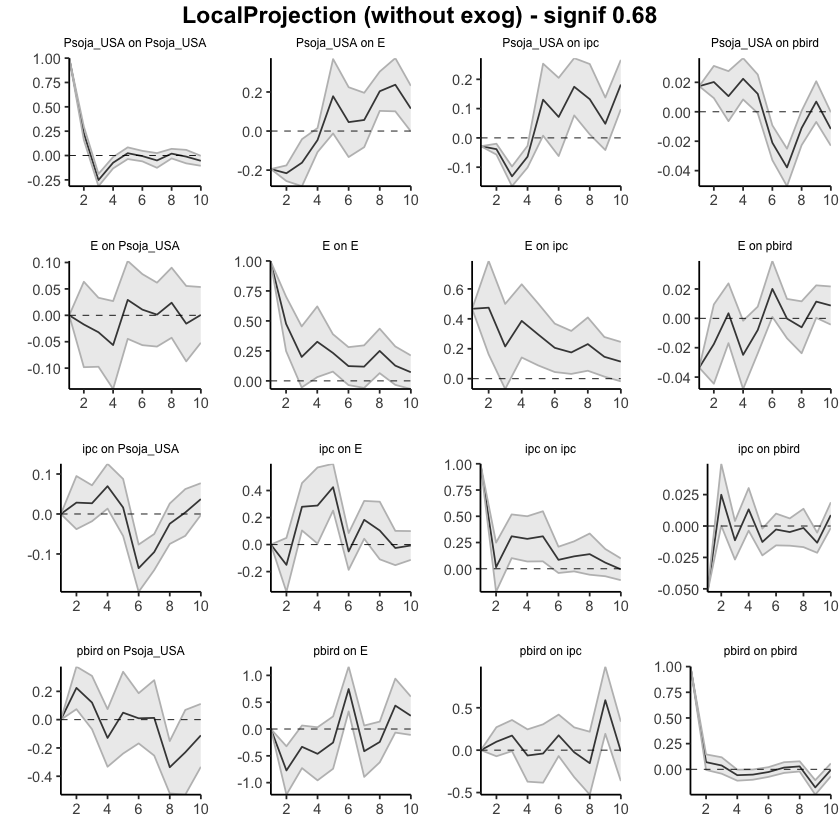

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Psoja_USA", "E", "ipc", "pbird"), fixed_lags = 2, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,NA,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Psoja_USA, E, ipc, pbird",4


LocalProjection (without exog) - Cumulative - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.0000000,0.0000000,0.0000000
79,ipc,E,2,-0.1500553,-0.5411733,0.2410627
80,ipc,E,3,0.1297178,-0.6050085,0.8644442
81,ipc,E,4,0.4186360,-0.8682058,1.7054777
82,ipc,E,5,0.8433656,-0.7829462,2.4696775
83,ipc,E,6,0.7924682,-1.1006471,2.6855835
84,ipc,E,7,0.9756296,-1.1919340,3.1431933
85,ipc,E,8,1.0797282,-1.5055311,3.6649875
86,ipc,E,9,1.0542884,-1.7795626,3.8881395


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.0000000,0.000000,0.0000000
112,pbird,E,2,-0.7728434,-1.656644,0.1109572
113,pbird,E,3,-1.1046290,-2.767166,0.5579079
114,pbird,E,4,-1.5670033,-4.199628,1.0656218
115,pbird,E,5,-1.8198816,-5.408252,1.7684886
116,pbird,E,6,-1.0743905,-5.482300,3.3335188
117,pbird,E,7,-1.4886230,-6.834626,3.8573796
118,pbird,E,8,-1.7299490,-7.820059,4.3601612
119,pbird,E,9,-1.2938453,-8.368991,5.7813002


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Psoja_USA,E,1,-0.1946091,-0.1946091,-0.1946091
2,Psoja_USA,E,2,-0.4105930,-0.4893048,-0.3318813
3,Psoja_USA,E,3,-0.5725187,-0.8871311,-0.2579064
4,Psoja_USA,E,4,-0.6185732,-1.0537437,-0.1834028
5,Psoja_USA,E,5,-0.4403093,-1.2488488,0.3682301
6,Psoja_USA,E,6,-0.3946773,-1.5535717,0.7642171
7,Psoja_USA,E,7,-0.3380029,-1.7696715,1.0936657
8,Psoja_USA,E,8,-0.1341747,-1.7630077,1.4946582
9,Psoja_USA,E,9,0.1029786,-1.7928244,1.9987817


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4669784,0.46697837,0.4669784
46,E,ipc,2,0.9414368,0.32943353,1.5534401
47,E,ipc,3,1.1566697,-0.01238916,2.3257286
48,E,ipc,4,1.5427838,-0.10551103,3.1910787
49,E,ipc,5,1.8379223,-0.21541860,3.8912633
50,E,ipc,6,2.0441155,-0.32620672,4.4144378
51,E,ipc,7,2.2195429,-0.43219093,4.8712767
52,E,ipc,8,2.4506832,-0.54990017,5.4512665
53,E,ipc,9,2.5969575,-0.66300780,5.8569227


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.0000000,0.0000000
123,pbird,ipc,2,0.09945274,-0.2360190,0.4349244
124,pbird,ipc,3,0.27154480,-0.4236153,0.9667049
125,pbird,ipc,4,0.20830412,-1.0912005,1.5078088
126,pbird,ipc,5,0.16892256,-1.8050721,2.1429172
127,pbird,ipc,6,0.34380778,-2.1095489,2.7971644
128,pbird,ipc,7,0.31880518,-2.7096842,3.3472945
129,pbird,ipc,8,0.16516265,-3.5907132,3.9210385
130,pbird,ipc,9,0.75435525,-3.7781883,5.2868988


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Psoja_USA,ipc,1,-0.02838737,-0.02838737,-0.02838737
13,Psoja_USA,ipc,2,-0.06687923,-0.10327385,-0.03048461
14,Psoja_USA,ipc,3,-0.19820185,-0.30042752,-0.09597618
15,Psoja_USA,ipc,4,-0.26231196,-0.43706063,-0.08756328
16,Psoja_USA,ipc,5,-0.13184545,-0.54748338,0.28379249
17,Psoja_USA,ipc,6,-0.06033451,-0.73768747,0.61701845
18,Psoja_USA,ipc,7,0.11428240,-0.75470158,0.98326638
19,Psoja_USA,ipc,8,0.24638457,-0.85799708,1.35076623
20,Psoja_USA,ipc,9,0.29457553,-0.98544380,1.57459485


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.03356879,-0.03356879,-0.033568788
57,E,pbird,2,-0.05109717,-0.10399862,0.001804287
58,E,pbird,3,-0.04763120,-0.14041829,0.045155884
59,E,pbird,4,-0.07250206,-0.21085233,0.065848217
60,E,pbird,5,-0.08046344,-0.25002107,0.089094195
61,E,pbird,6,-0.06042605,-0.26732221,0.146470112
62,E,pbird,7,-0.06059686,-0.29376539,0.172571678
63,E,pbird,8,-0.06669858,-0.33451997,0.201122813
64,E,pbird,9,-0.05529199,-0.34481040,0.234226425


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.05238348,-0.05238348,-0.05238348
90,ipc,pbird,2,-0.02748455,-0.07578848,0.02081937
91,ipc,pbird,3,-0.03884105,-0.11720085,0.03951874
92,ipc,pbird,4,-0.02557083,-0.13719288,0.08605121
93,ipc,pbird,5,-0.03827704,-0.17080452,0.09425045
94,ipc,pbird,6,-0.04103485,-0.19833393,0.11626424
95,ipc,pbird,7,-0.04583907,-0.22441196,0.13273383
96,ipc,pbird,8,-0.04737302,-0.25584654,0.16110050
97,ipc,pbird,9,-0.06065719,-0.28482689,0.16351252


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Psoja_USA,pbird,1,0.017369438,0.017369438,0.01736944
24,Psoja_USA,pbird,2,0.037590437,0.016160122,0.05902075
25,Psoja_USA,pbird,3,0.048195999,-0.006528653,0.10292065
26,Psoja_USA,pbird,4,0.070599506,-0.011644151,0.15284316
27,Psoja_USA,pbird,5,0.082785310,-0.025155903,0.19072652
28,Psoja_USA,pbird,6,0.061734153,-0.069374228,0.19284253
29,Psoja_USA,pbird,7,0.023915541,-0.132150455,0.17998154
30,Psoja_USA,pbird,8,0.012867363,-0.166038376,0.19177310
31,Psoja_USA,pbird,9,0.019780555,-0.186217529,0.22577864


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Psoja_USA,1,0.00000000,0.0000000,0.0000000
35,E,Psoja_USA,2,-0.01734392,-0.1758430,0.1411551
36,E,Psoja_USA,3,-0.04941768,-0.3359282,0.2370929
37,E,Psoja_USA,4,-0.10572190,-0.5553135,0.3438697
38,E,Psoja_USA,5,-0.07654555,-0.6706481,0.5175570
39,E,Psoja_USA,6,-0.06577733,-0.7917061,0.6601514
40,E,Psoja_USA,7,-0.06449116,-0.9089549,0.7799726
41,E,Psoja_USA,8,-0.04066806,-1.0150705,0.9337344
42,E,Psoja_USA,9,-0.05647370,-1.1707573,1.0578099


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Psoja_USA,1,0.000000000,0.0000000,0.0000000
68,ipc,Psoja_USA,2,0.028427811,-0.1017780,0.1586336
69,ipc,Psoja_USA,3,0.055220128,-0.1631092,0.2735495
70,ipc,Psoja_USA,4,0.124700480,-0.2035884,0.4529893
71,ipc,Psoja_USA,5,0.140995688,-0.3270581,0.6090494
72,ipc,Psoja_USA,6,0.005399516,-0.5785203,0.5893193
73,ipc,Psoja_USA,7,-0.089849090,-0.7622319,0.5825338
74,ipc,Psoja_USA,8,-0.114237900,-0.8857118,0.6572360
75,ipc,Psoja_USA,9,-0.110400283,-0.9964885,0.7756880


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Psoja_USA,1,0.00000000,0.00000000,0.0000000
101,pbird,Psoja_USA,2,0.22445602,-0.07063962,0.5195517
102,pbird,Psoja_USA,3,0.34536548,-0.31894013,1.0096711
103,pbird,Psoja_USA,4,0.21608476,-0.84743518,1.2796047
104,pbird,Psoja_USA,5,0.26545328,-1.36476872,1.8956753
105,pbird,Psoja_USA,6,0.27503568,-1.70299314,2.2530645
106,pbird,Psoja_USA,7,0.28748012,-2.21295269,2.7879129
107,pbird,Psoja_USA,8,-0.04907899,-2.91225009,2.8140921
108,pbird,Psoja_USA,9,-0.27984580,-3.72997923,3.1702876


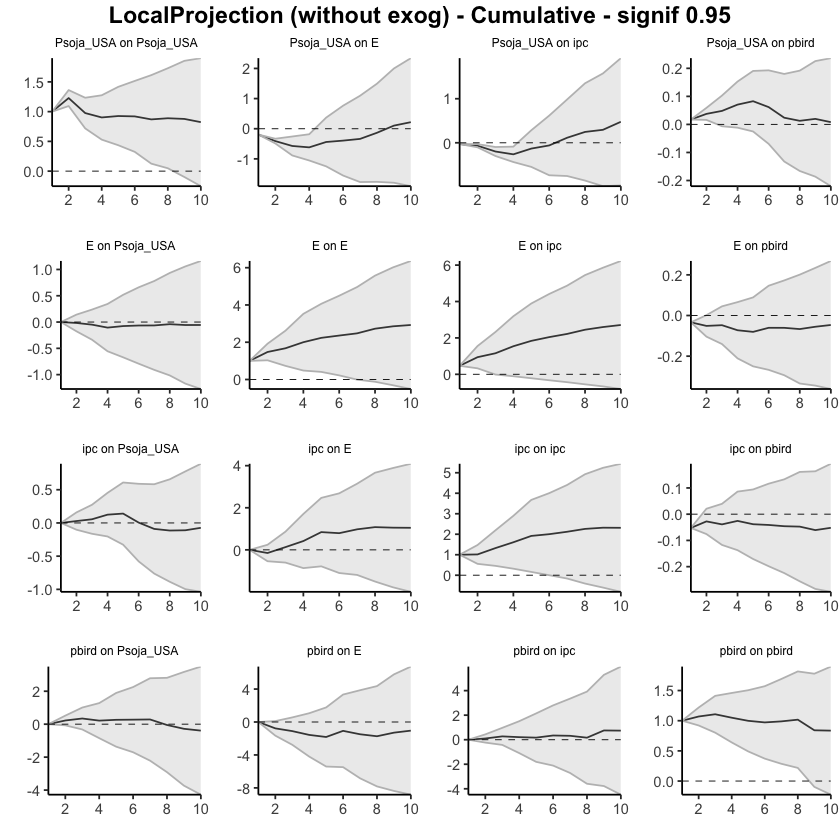

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Psoja_USA", "E", "ipc", "pbird"), fixed_lags = 2, horizons=10, signif = 0.95, cumulative=TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Psoja_USA, E, ipc, pbird",4


LocalProjection (without exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.0000000,0.00000000,0.00000000
79,ipc,E,2,-0.1500553,-0.34960529,0.04949469
80,ipc,E,3,0.1297178,-0.24514255,0.50457822
81,ipc,E,4,0.4186360,-0.23791596,1.07518787
82,ipc,E,5,0.8433656,0.01361468,1.67311658
83,ipc,E,6,0.7924682,-0.17340694,1.75834334
84,ipc,E,7,0.9756296,-0.13027018,2.08152946
85,ipc,E,8,1.0797282,-0.23928165,2.39873808
86,ipc,E,9,1.0542884,-0.39155394,2.50013079


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.0000000,0.000000,0.00000000
112,pbird,E,2,-0.7728434,-1.223762,-0.32192469
113,pbird,E,3,-1.1046290,-1.952862,-0.25639591
114,pbird,E,4,-1.5670033,-2.910179,-0.22382722
115,pbird,E,5,-1.8198816,-3.650683,0.01091952
116,pbird,E,6,-1.0743905,-3.323324,1.17454281
117,pbird,E,7,-1.4886230,-4.216175,1.23892937
118,pbird,E,8,-1.7299490,-4.837148,1.37725012
119,pbird,E,9,-1.2938453,-4.903613,2.31592282


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Psoja_USA,E,1,-0.1946091,-0.1946091,-0.19460906
2,Psoja_USA,E,2,-0.4105930,-0.4507521,-0.37043398
3,Psoja_USA,E,3,-0.5725187,-0.7330353,-0.41200224
4,Psoja_USA,E,4,-0.6185732,-0.8405990,-0.39654750
5,Psoja_USA,E,5,-0.4403093,-0.8528295,-0.02778922
6,Psoja_USA,E,6,-0.3946773,-0.9859500,0.19659532
7,Psoja_USA,E,7,-0.3380029,-1.0684460,0.39244031
8,Psoja_USA,E,8,-0.1341747,-0.9652120,0.69686247
9,Psoja_USA,E,9,0.1029786,-0.8642678,1.07022507


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4669784,0.4669784,0.4669784
46,E,ipc,2,0.9414368,0.6291902,1.2536834
47,E,ipc,3,1.1566697,0.5602111,1.7531283
48,E,ipc,4,1.5427838,0.7018171,2.3837506
49,E,ipc,5,1.8379223,0.7902994,2.8855453
50,E,ipc,6,2.0441155,0.8347674,3.2534636
51,E,ipc,7,2.2195429,0.8666175,3.5724683
52,E,ipc,8,2.4506832,0.9197733,3.9815930
53,E,ipc,9,2.5969575,0.9337099,4.2602051


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.00000000,0.0000000
123,pbird,ipc,2,0.09945274,-0.07170628,0.2706118
124,pbird,ipc,3,0.27154480,-0.08312871,0.6262183
125,pbird,ipc,4,0.20830412,-0.45470846,0.8713167
126,pbird,ipc,5,0.16892256,-0.83821757,1.1760627
127,pbird,ipc,6,0.34380778,-0.90790479,1.5955203
128,pbird,ipc,7,0.31880518,-1.22634244,1.8639528
129,pbird,ipc,8,0.16516265,-1.75110054,2.0814258
130,pbird,ipc,9,0.75435525,-1.55816699,3.0668775


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Psoja_USA,ipc,1,-0.02838737,-0.02838737,-0.02838737
13,Psoja_USA,ipc,2,-0.06687923,-0.08544792,-0.04831054
14,Psoja_USA,ipc,3,-0.19820185,-0.25035781,-0.14604589
15,Psoja_USA,ipc,4,-0.26231196,-0.35146944,-0.17315447
16,Psoja_USA,ipc,5,-0.13184545,-0.34390562,0.08021472
17,Psoja_USA,ipc,6,-0.06033451,-0.40592275,0.28525374
18,Psoja_USA,ipc,7,0.11428240,-0.32907678,0.55764157
19,Psoja_USA,ipc,8,0.24638457,-0.31707545,0.80984460
20,Psoja_USA,ipc,9,0.29457553,-0.35849556,0.94764661


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.03356879,-0.03356879,-0.0335687884
57,E,pbird,2,-0.05109717,-0.07808770,-0.0241066286
58,E,pbird,3,-0.04763120,-0.09497155,-0.0002908519
59,E,pbird,4,-0.07250206,-0.14308893,-0.0019151825
60,E,pbird,5,-0.08046344,-0.16697243,0.0060455586
61,E,pbird,6,-0.06042605,-0.16598531,0.0451332170
62,E,pbird,7,-0.06059686,-0.17956040,0.0583666808
63,E,pbird,8,-0.06669858,-0.20334215,0.0699449877
64,E,pbird,9,-0.05529199,-0.20300546,0.0924214879


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.05238348,-0.05238348,-0.052383476
90,ipc,pbird,2,-0.02748455,-0.05212941,-0.002839694
91,ipc,pbird,3,-0.03884105,-0.07882054,0.001138435
92,ipc,pbird,4,-0.02557083,-0.08252086,0.031379188
93,ipc,pbird,5,-0.03827704,-0.10589310,0.029339026
94,ipc,pbird,6,-0.04103485,-0.12128948,0.039219791
95,ipc,pbird,7,-0.04583907,-0.13694769,0.045269551
96,ipc,pbird,8,-0.04737302,-0.15373706,0.058991017
97,ipc,pbird,9,-0.06065719,-0.17502948,0.053715111


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Psoja_USA,pbird,1,0.017369438,0.017369438,0.01736944
24,Psoja_USA,pbird,2,0.037590437,0.026656603,0.04852427
25,Psoja_USA,pbird,3,0.048195999,0.020275258,0.07611674
26,Psoja_USA,pbird,4,0.070599506,0.028638457,0.11256055
27,Psoja_USA,pbird,5,0.082785310,0.027713262,0.13785736
28,Psoja_USA,pbird,6,0.061734153,-0.005157878,0.12862618
29,Psoja_USA,pbird,7,0.023915541,-0.055709967,0.10354105
30,Psoja_USA,pbird,8,0.012867363,-0.078411076,0.10414580
31,Psoja_USA,pbird,9,0.019780555,-0.085320508,0.12488162


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Psoja_USA,1,0.00000000,0.00000000,0.00000000
35,E,Psoja_USA,2,-0.01734392,-0.09821077,0.06352294
36,E,Psoja_USA,3,-0.04941768,-0.19559654,0.09676118
37,E,Psoja_USA,4,-0.10572190,-0.33510537,0.12366158
38,E,Psoja_USA,5,-0.07654555,-0.37965908,0.22656799
39,E,Psoja_USA,6,-0.06577733,-0.43614914,0.30459449
40,E,Psoja_USA,7,-0.06449116,-0.49534002,0.36635771
41,E,Psoja_USA,8,-0.04066806,-0.53781217,0.45647605
42,E,Psoja_USA,9,-0.05647370,-0.62498576,0.51203837


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Psoja_USA,1,0.000000000,0.00000000,0.00000000
68,ipc,Psoja_USA,2,0.028427811,-0.03800373,0.09485936
69,ipc,Psoja_USA,3,0.055220128,-0.05617240,0.16661265
70,ipc,Psoja_USA,4,0.124700480,-0.04279383,0.29219479
71,ipc,Psoja_USA,5,0.140995688,-0.09780724,0.37979862
72,ipc,Psoja_USA,6,0.005399516,-0.29251875,0.30331778
73,ipc,Psoja_USA,7,-0.089849090,-0.43290156,0.25320338
74,ipc,Psoja_USA,8,-0.114237900,-0.50784705,0.27937125
75,ipc,Psoja_USA,9,-0.110400283,-0.56248613,0.34168556


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Psoja_USA,1,0.00000000,0.000000000,0.0000000
101,pbird,Psoja_USA,2,0.22445602,0.073897018,0.3750150
102,pbird,Psoja_USA,3,0.34536548,0.006434047,0.6842969
103,pbird,Psoja_USA,4,0.21608476,-0.326527454,0.7586970
104,pbird,Psoja_USA,5,0.26545328,-0.566292640,1.0971992
105,pbird,Psoja_USA,6,0.27503568,-0.734162700,1.2842341
106,pbird,Psoja_USA,7,0.28748012,-0.988250907,1.5632111
107,pbird,Psoja_USA,8,-0.04907899,-1.509880572,1.4117226
108,pbird,Psoja_USA,9,-0.27984580,-2.040117959,1.4804264


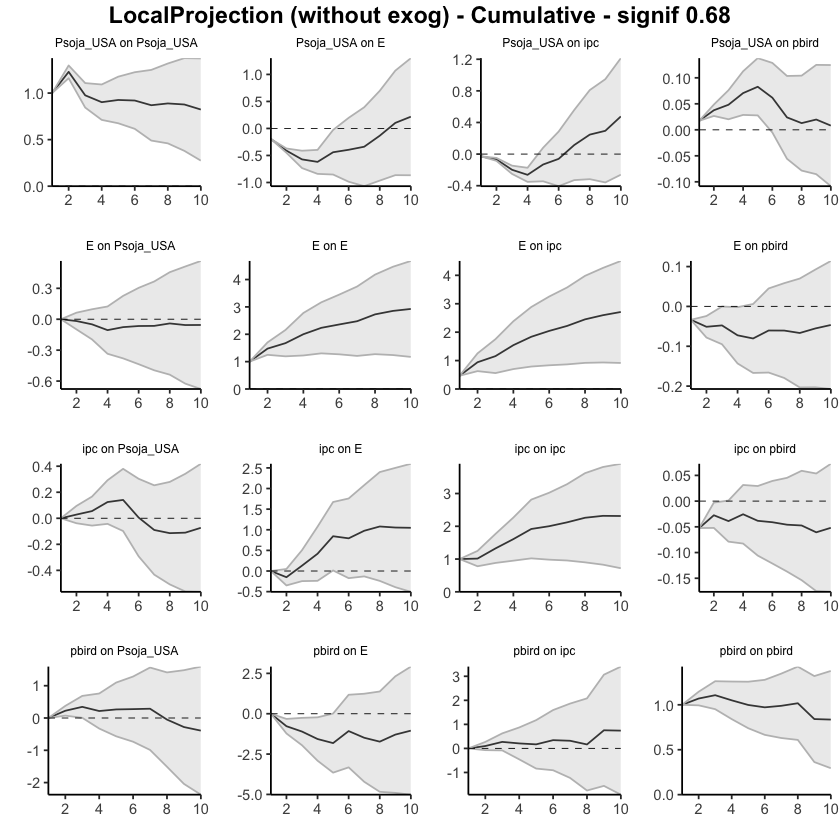

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Psoja_USA", "E", "ipc", "pbird"), fixed_lags = 2, horizons=10, signif = 0.68, cumulative=TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
3,NA,NaN,NA,NA,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Psoja_USA, E, ipc, pbird",4


LocalProjection (without exog) - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.000000000,0.00000000,0.0000000
79,ipc,E,2,-0.199067580,-0.60691055,0.2087754
80,ipc,E,3,0.250823406,0.02357548,0.4780713
81,ipc,E,4,0.392916321,0.02504494,0.7607877
82,ipc,E,5,0.420795761,0.01190825,0.8296833
83,ipc,E,6,-0.066906664,-0.35146251,0.2176492
84,ipc,E,7,0.218558345,-0.03220519,0.4693219
85,ipc,E,8,0.122528064,-0.25182822,0.4968843
86,ipc,E,9,-0.065459437,-0.31006967,0.1791508


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.00000000,0.00000000,0.00000000
112,pbird,E,2,-0.81205532,-1.68071247,0.05660182
113,pbird,E,3,-0.32623055,-1.14675320,0.49429210
114,pbird,E,4,-0.41706105,-1.31600246,0.48188035
115,pbird,E,5,-0.25196426,-1.19192977,0.68800125
116,pbird,E,6,0.73913963,-0.08268376,1.56096301
117,pbird,E,7,-0.41249787,-1.33544821,0.51045247
118,pbird,E,8,-0.23466531,-0.96123803,0.49190741
119,pbird,E,9,0.42516004,-0.54590157,1.39622165


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Psoja_USA,E,1,-0.20316193,-0.20316193,-0.20316193
2,Psoja_USA,E,2,-0.19265804,-0.30888324,-0.07643285
3,Psoja_USA,E,3,-0.08955802,-0.28539027,0.10627423
4,Psoja_USA,E,4,-0.04115075,-0.23307720,0.15077570
5,Psoja_USA,E,5,0.25022986,-0.19430349,0.69476321
6,Psoja_USA,E,6,0.14137091,-0.23871407,0.52145588
7,Psoja_USA,E,7,0.14360435,-0.16004348,0.44725217
8,Psoja_USA,E,8,0.25704815,0.03244141,0.48165490
9,Psoja_USA,E,9,0.28657181,-0.02160125,0.59474487


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4573026,0.45730259,0.4573026
46,E,ipc,2,0.4554413,-0.13146584,1.0423484
47,E,ipc,3,0.2097584,-0.19781920,0.6173361
48,E,ipc,4,0.4081280,0.05496183,0.7612941
49,E,ipc,5,0.2963356,-0.09682918,0.6895005
50,E,ipc,6,0.1988666,-0.07310348,0.4708367
51,E,ipc,7,0.1799839,-0.07262349,0.4325913
52,E,ipc,8,0.2451745,-0.04108085,0.5314299
53,E,ipc,9,0.1378375,-0.12070869,0.3963837


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.0000000,0.0000000
123,pbird,ipc,2,0.07612314,-0.2496754,0.4019216
124,pbird,ipc,3,0.16865527,-0.1789835,0.5162941
125,pbird,ipc,4,-0.04631296,-0.5885114,0.4958854
126,pbird,ipc,5,-0.05426120,-0.7079062,0.5993837
127,pbird,ipc,6,0.16428604,-0.3109142,0.6394863
128,pbird,ipc,7,-0.05068588,-0.6833727,0.5820009
129,pbird,ipc,8,-0.15950248,-0.7938454,0.4748404
130,pbird,ipc,9,0.59998271,-0.1990111,1.3989765


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Psoja_USA,ipc,1,-0.02370532,-0.023705316,-0.023705316
13,Psoja_USA,ipc,2,-0.01257494,-0.037804264,0.012654393
14,Psoja_USA,ipc,3,-0.06253334,-0.123956960,-0.001109712
15,Psoja_USA,ipc,4,-0.02223099,-0.093575478,0.049113497
16,Psoja_USA,ipc,5,0.23162568,-0.053345034,0.516596397
17,Psoja_USA,ipc,6,0.14167313,-0.166598429,0.449944688
18,Psoja_USA,ipc,7,0.22340820,-0.018259497,0.465075905
19,Psoja_USA,ipc,8,0.21421313,-0.046920003,0.475346264
20,Psoja_USA,ipc,9,0.06481114,-0.148806496,0.278428777


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-3.428340e-02,-0.03428340,-0.03428340
57,E,pbird,2,-1.984203e-02,-0.06635258,0.02666852
58,E,pbird,3,1.140464e-03,-0.03317443,0.03545536
59,E,pbird,4,-2.812951e-02,-0.08047811,0.02421909
60,E,pbird,5,-9.278562e-03,-0.04302920,0.02447208
61,E,pbird,6,2.059541e-02,-0.01916662,0.06035744
62,E,pbird,7,4.499270e-06,-0.02316453,0.02317353
63,E,pbird,8,-8.117544e-03,-0.04372287,0.02748778
64,E,pbird,9,1.442050e-02,-0.01037900,0.03922000


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.052850285,-0.05285028,-0.052850285
90,ipc,pbird,2,0.016448181,-0.02633964,0.059236007
91,ipc,pbird,3,-0.015050455,-0.03512111,0.005020200
92,ipc,pbird,4,0.007083027,-0.03748618,0.051652237
93,ipc,pbird,5,-0.020284251,-0.04599244,0.005423934
94,ipc,pbird,6,-0.002172902,-0.03158998,0.027244176
95,ipc,pbird,7,0.003583027,-0.01555651,0.022722567
96,ipc,pbird,8,-0.012474106,-0.04450732,0.019559104
97,ipc,pbird,9,-0.007075764,-0.02979916,0.015647629


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Psoja_USA,pbird,1,0.011749502,0.011749502,0.0117495015
24,Psoja_USA,pbird,2,0.026553083,0.006700430,0.0464057363
25,Psoja_USA,pbird,3,0.012912064,-0.020934926,0.0467590542
26,Psoja_USA,pbird,4,0.019284410,-0.008167841,0.0467366614
27,Psoja_USA,pbird,5,0.001668599,-0.025981651,0.0293188490
28,Psoja_USA,pbird,6,-0.025244105,-0.050074852,-0.0004133588
29,Psoja_USA,pbird,7,-0.038056451,-0.063525771,-0.0125871313
30,Psoja_USA,pbird,8,-0.015728424,-0.038947524,0.0074906748
31,Psoja_USA,pbird,9,0.013656865,-0.012150977,0.0394647081


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Psoja_USA,1,0.000000000,0.0000000,0.0000000
35,E,Psoja_USA,2,-0.024997365,-0.1903079,0.1403132
36,E,Psoja_USA,3,-0.032895861,-0.1680716,0.1022799
37,E,Psoja_USA,4,-0.041354425,-0.1906809,0.1079720
38,E,Psoja_USA,5,0.036296782,-0.1119525,0.1845460
39,E,Psoja_USA,6,0.008991670,-0.1545382,0.1725215
40,E,Psoja_USA,7,-0.001705514,-0.1245634,0.1211524
41,E,Psoja_USA,8,0.023612587,-0.1146274,0.1618525
42,E,Psoja_USA,9,-0.025752307,-0.1884262,0.1369216


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Psoja_USA,1,0.000000000,0.00000000,0.00000000
68,ipc,Psoja_USA,2,0.007418441,-0.15947003,0.17430692
69,ipc,Psoja_USA,3,0.049024720,-0.05788545,0.15593489
70,ipc,Psoja_USA,4,0.128549158,0.02025696,0.23684135
71,ipc,Psoja_USA,5,0.034512667,-0.11649563,0.18552096
72,ipc,Psoja_USA,6,-0.134013166,-0.30107941,0.03305308
73,ipc,Psoja_USA,7,-0.105176122,-0.19854704,-0.01180520
74,ipc,Psoja_USA,8,-0.020791111,-0.13174638,0.09016415
75,ipc,Psoja_USA,9,-0.031500559,-0.19060812,0.12760701


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Psoja_USA,1,0.000000000,0.00000000,0.00000000
101,pbird,Psoja_USA,2,0.220172038,-0.06143929,0.50178337
102,pbird,Psoja_USA,3,0.097062953,-0.25422546,0.44835136
103,pbird,Psoja_USA,4,-0.113126772,-0.50266429,0.27641075
104,pbird,Psoja_USA,5,0.070634109,-0.49065863,0.63192685
105,pbird,Psoja_USA,6,0.009030952,-0.33700849,0.35507039
106,pbird,Psoja_USA,7,0.020114960,-0.51350072,0.55373064
107,pbird,Psoja_USA,8,-0.331970176,-0.69571200,0.03177165
108,pbird,Psoja_USA,9,-0.235762453,-0.83646786,0.36494295


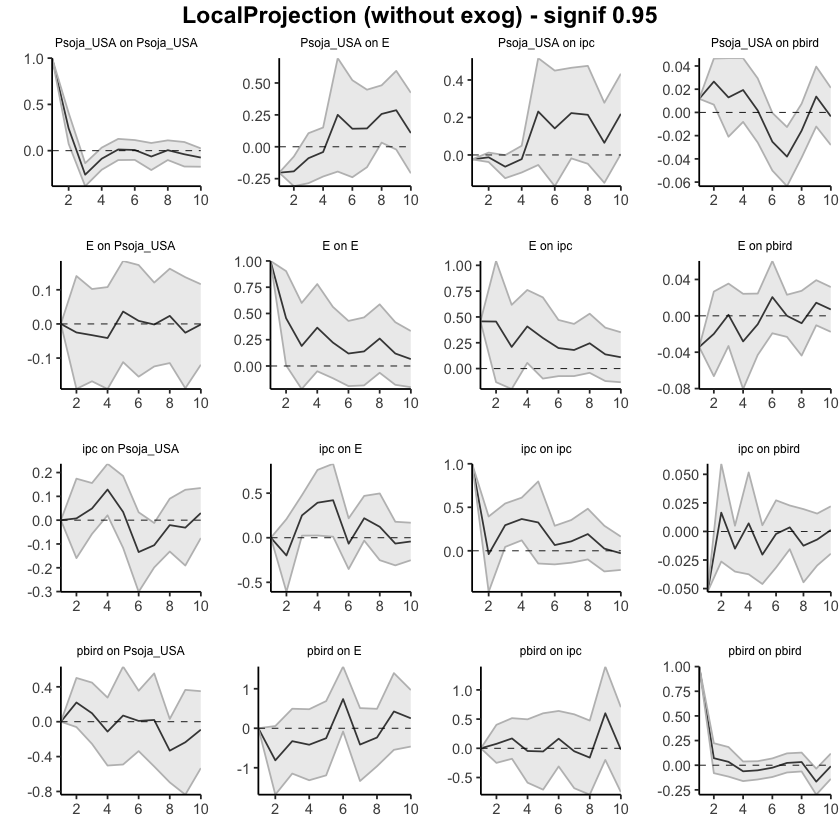

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Psoja_USA", "E", "ipc", "pbird"), fixed_lags = 3, horizons=10, signif = 0.95)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
3,NA,NaN,NA,NA,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Psoja_USA, E, ipc, pbird",4


LocalProjection (without exog) - Cumulative - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.00000000,0.0000000,0.0000000
79,ipc,E,2,-0.19906758,-0.6069105,0.2087754
80,ipc,E,3,0.05175583,-0.5833351,0.6868467
81,ipc,E,4,0.44467215,-0.5582901,1.4476344
82,ipc,E,5,0.86546791,-0.5463819,2.2773177
83,ipc,E,6,0.79856124,-0.8978444,2.4949669
84,ipc,E,7,1.01711959,-0.9300496,2.9642888
85,ipc,E,8,1.13964765,-1.1818778,3.4611731
86,ipc,E,9,1.07418821,-1.4919475,3.6403239


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.0000000,0.000000,0.00000000
112,pbird,E,2,-0.8120553,-1.680712,0.05660182
113,pbird,E,3,-1.1382859,-2.827466,0.55089393
114,pbird,E,4,-1.5553469,-4.143468,1.03277428
115,pbird,E,5,-1.8073112,-5.335398,1.72077553
116,pbird,E,6,-1.0681716,-5.418082,3.28173855
117,pbird,E,7,-1.4806694,-6.753530,3.79219102
118,pbird,E,8,-1.7153347,-7.714768,4.28409843
119,pbird,E,9,-1.2901747,-8.260669,5.68032008


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Psoja_USA,E,1,-0.203161932,-0.2031619,-0.20316193
2,Psoja_USA,E,2,-0.395819976,-0.5120452,-0.27959478
3,Psoja_USA,E,3,-0.485377997,-0.7974354,-0.17332055
4,Psoja_USA,E,4,-0.526528750,-1.0305126,-0.02254485
5,Psoja_USA,E,5,-0.276298889,-1.2248161,0.67221836
6,Psoja_USA,E,6,-0.134927980,-1.4635302,1.19367424
7,Psoja_USA,E,7,0.008676365,-1.6235737,1.64092641
8,Psoja_USA,E,8,0.265724516,-1.5911323,2.12258130
9,Psoja_USA,E,9,0.552296322,-1.6127335,2.71732617


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4573026,0.45730259,0.4573026
46,E,ipc,2,0.9127439,0.32583675,1.4996510
47,E,ipc,3,1.1225023,0.12801755,2.1169871
48,E,ipc,4,1.5306303,0.18297938,2.8782812
49,E,ipc,5,1.8269660,0.08615020,3.5677817
50,E,ipc,6,2.0258326,0.01304672,4.0386184
51,E,ipc,7,2.2058165,-0.05957677,4.4712098
52,E,ipc,8,2.4509910,-0.10065762,5.0026396
53,E,ipc,9,2.5888285,-0.22136631,5.3990233


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.0000000,0.0000000
123,pbird,ipc,2,0.07612314,-0.2496754,0.4019216
124,pbird,ipc,3,0.24477840,-0.4286589,0.9182157
125,pbird,ipc,4,0.19846544,-1.0171702,1.4141011
126,pbird,ipc,5,0.14420424,-1.7250764,2.0134849
127,pbird,ipc,6,0.30849028,-2.0359906,2.6529712
128,pbird,ipc,7,0.25780440,-2.7193633,3.2349721
129,pbird,ipc,8,0.09830192,-3.5132086,3.7098125
130,pbird,ipc,9,0.69828463,-3.7122198,5.1087890


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Psoja_USA,ipc,1,-0.02370532,-0.02370532,-0.02370532
13,Psoja_USA,ipc,2,-0.03628025,-0.06150958,-0.01105092
14,Psoja_USA,ipc,3,-0.09881359,-0.18546654,-0.01216064
15,Psoja_USA,ipc,4,-0.12104458,-0.27904202,0.03695286
16,Psoja_USA,ipc,5,0.11058110,-0.33238705,0.55354926
17,Psoja_USA,ipc,6,0.25225423,-0.49898548,1.00349395
18,Psoja_USA,ipc,7,0.47566244,-0.51724498,1.46856985
19,Psoja_USA,ipc,8,0.68987557,-0.56416498,1.94391612
20,Psoja_USA,ipc,9,0.75468671,-0.71297148,2.22234489


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.03428340,-0.0342834,-0.034283400
57,E,pbird,2,-0.05412543,-0.1006360,-0.007614878
58,E,pbird,3,-0.05298496,-0.1338104,0.027840481
59,E,pbird,4,-0.08111447,-0.2142885,0.052059571
60,E,pbird,5,-0.09039304,-0.2573177,0.076531650
61,E,pbird,6,-0.06979762,-0.2764843,0.136889093
62,E,pbird,7,-0.06979313,-0.2996489,0.160062619
63,E,pbird,8,-0.07791067,-0.3433717,0.187550397
64,E,pbird,9,-0.06349017,-0.3537507,0.226770398


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.05285028,-0.05285028,-0.052850285
90,ipc,pbird,2,-0.03640210,-0.07918993,0.006385722
91,ipc,pbird,3,-0.05145256,-0.11431104,0.011405922
92,ipc,pbird,4,-0.04436953,-0.15179722,0.063058159
93,ipc,pbird,5,-0.06465378,-0.19778966,0.068482092
94,ipc,pbird,6,-0.06682668,-0.22937964,0.095726268
95,ipc,pbird,7,-0.06324366,-0.24493615,0.118448835
96,ipc,pbird,8,-0.07571776,-0.28944347,0.138007939
97,ipc,pbird,9,-0.08279353,-0.31924262,0.153655568


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Psoja_USA,pbird,1,0.011749502,0.011749502,0.01174950
24,Psoja_USA,pbird,2,0.038302585,0.018449931,0.05815524
25,Psoja_USA,pbird,3,0.051214649,-0.002484994,0.10491429
26,Psoja_USA,pbird,4,0.070499059,-0.010652835,0.15165095
27,Psoja_USA,pbird,5,0.072167658,-0.036634487,0.18096980
28,Psoja_USA,pbird,6,0.046923553,-0.086709338,0.18055644
29,Psoja_USA,pbird,7,0.008867101,-0.150235109,0.16796931
30,Psoja_USA,pbird,8,-0.006861323,-0.189182633,0.17545999
31,Psoja_USA,pbird,9,0.006795542,-0.201333611,0.21492470


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Psoja_USA,1,0.00000000,0.0000000,0.0000000
35,E,Psoja_USA,2,-0.02499737,-0.1903079,0.1403132
36,E,Psoja_USA,3,-0.05789323,-0.3583795,0.2425931
37,E,Psoja_USA,4,-0.09924765,-0.5490604,0.3505651
38,E,Psoja_USA,5,-0.06295087,-0.6610129,0.5351112
39,E,Psoja_USA,6,-0.05395920,-0.8155511,0.7076327
40,E,Psoja_USA,7,-0.05566471,-0.9401145,0.8287851
41,E,Psoja_USA,8,-0.03205213,-1.0547419,0.9906376
42,E,Psoja_USA,9,-0.05780443,-1.2431681,1.1275592


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Psoja_USA,1,0.000000000,0.0000000,0.0000000
68,ipc,Psoja_USA,2,0.007418441,-0.1594700,0.1743069
69,ipc,Psoja_USA,3,0.056443161,-0.2173555,0.3302418
70,ipc,Psoja_USA,4,0.184992319,-0.1970985,0.5670832
71,ipc,Psoja_USA,5,0.219504986,-0.3135941,0.7526041
72,ipc,Psoja_USA,6,0.085491820,-0.6146736,0.7856572
73,ipc,Psoja_USA,7,-0.019684302,-0.8132206,0.7738520
74,ipc,Psoja_USA,8,-0.040475414,-0.9449670,0.8640161
75,ipc,Psoja_USA,9,-0.071975972,-1.1355751,0.9916232


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Psoja_USA,1,0.00000000,0.00000000,0.0000000
101,pbird,Psoja_USA,2,0.22017204,-0.06143929,0.5017834
102,pbird,Psoja_USA,3,0.31723499,-0.31566475,0.9501347
103,pbird,Psoja_USA,4,0.20410822,-0.81832904,1.2265455
104,pbird,Psoja_USA,5,0.27474233,-1.30898767,1.8584723
105,pbird,Psoja_USA,6,0.28377328,-1.64599615,2.2135427
106,pbird,Psoja_USA,7,0.30388824,-2.15949687,2.7672734
107,pbird,Psoja_USA,8,-0.02808194,-2.85520887,2.7990450
108,pbird,Psoja_USA,9,-0.26384439,-3.69167673,3.1639880


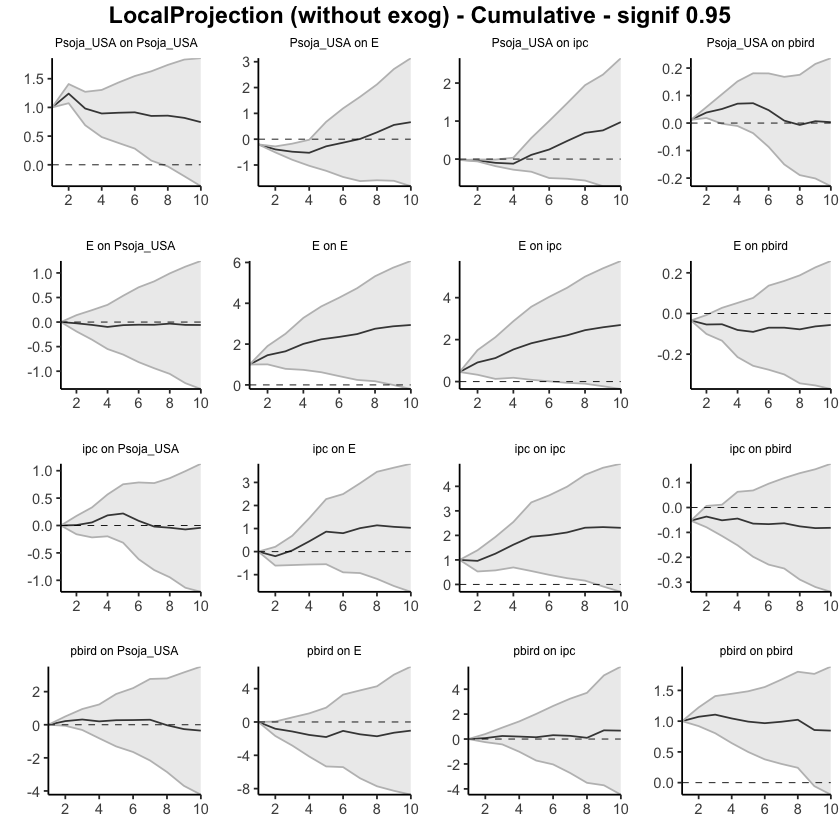

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Psoja_USA", "E", "ipc", "pbird"), fixed_lags = 3, horizons=10, signif = 0.95, cumulative=TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
3,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Psoja_USA, E, ipc, pbird",4


LocalProjection (without exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.000000000,0.00000000,0.000000000
79,ipc,E,2,-0.199067580,-0.40715073,0.009015566
80,ipc,E,3,0.250823406,0.13488059,0.366766226
81,ipc,E,4,0.392916321,0.20522684,0.580605801
82,ipc,E,5,0.420795761,0.21217968,0.629411840
83,ipc,E,6,-0.066906664,-0.21208822,0.078274892
84,ipc,E,7,0.218558345,0.09061777,0.346498923
85,ipc,E,8,0.122528064,-0.06847004,0.313526167
86,ipc,E,9,-0.065459437,-0.19026058,0.059341703


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.00000000,0.00000000,0.00000000
112,pbird,E,2,-0.81205532,-1.25524775,-0.36886290
113,pbird,E,3,-0.32623055,-0.74486456,0.09240346
114,pbird,E,4,-0.41706105,-0.87570463,0.04158252
115,pbird,E,5,-0.25196426,-0.73153850,0.22760998
116,pbird,E,6,0.73913963,0.31984198,1.15843727
117,pbird,E,7,-0.41249787,-0.88339090,0.05839516
118,pbird,E,8,-0.23466531,-0.60536568,0.13603505
119,pbird,E,9,0.42516004,-0.07027956,0.92059964


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Psoja_USA,E,1,-0.20316193,-0.20316193,-0.20316193
2,Psoja_USA,E,2,-0.19265804,-0.25195661,-0.13335948
3,Psoja_USA,E,3,-0.08955802,-0.18947244,0.01035639
4,Psoja_USA,E,4,-0.04115075,-0.13907241,0.05677090
5,Psoja_USA,E,5,0.25022986,0.02342713,0.47703259
6,Psoja_USA,E,6,0.14137091,-0.05255000,0.33529181
7,Psoja_USA,E,7,0.14360435,-0.01131801,0.29852670
8,Psoja_USA,E,8,0.25704815,0.14245287,0.37164343
9,Psoja_USA,E,9,0.28657181,0.12934065,0.44380296


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4573026,0.457302590,0.4573026
46,E,ipc,2,0.4554413,0.155998880,0.7548837
47,E,ipc,3,0.2097584,0.001810666,0.4177062
48,E,ipc,4,0.4081280,0.227941166,0.5883148
49,E,ipc,5,0.2963356,0.095741347,0.4969299
50,E,ipc,6,0.1988666,0.060106368,0.3376269
51,E,ipc,7,0.1799839,0.051102587,0.3088652
52,E,ipc,8,0.2451745,0.099125855,0.3912231
53,E,ipc,9,0.1378375,0.005926177,0.2697488


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.00000000,0.0000000
123,pbird,ipc,2,0.07612314,-0.09010058,0.2423469
124,pbird,ipc,3,0.16865527,-0.00871147,0.3460220
125,pbird,ipc,4,-0.04631296,-0.32294480,0.2303189
126,pbird,ipc,5,-0.05426120,-0.38775352,0.2792311
127,pbird,ipc,6,0.16428604,-0.07816306,0.4067352
128,pbird,ipc,7,-0.05068588,-0.37348527,0.2721135
129,pbird,ipc,8,-0.15950248,-0.48314681,0.1641418
130,pbird,ipc,9,0.59998271,0.19233280,1.0076326


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Psoja_USA,ipc,1,-0.02370532,-0.023705316,-0.0237053165
13,Psoja_USA,ipc,2,-0.01257494,-0.025447042,0.0002971706
14,Psoja_USA,ipc,3,-0.06253334,-0.093871920,-0.0311947521
15,Psoja_USA,ipc,4,-0.02223099,-0.058631239,0.0141692584
16,Psoja_USA,ipc,5,0.23162568,0.086232459,0.3770189038
17,Psoja_USA,ipc,6,0.14167313,-0.015608278,0.2989545371
18,Psoja_USA,ipc,7,0.22340820,0.100108357,0.3467080515
19,Psoja_USA,ipc,8,0.21421313,0.080981940,0.3474443208
20,Psoja_USA,ipc,9,0.06481114,-0.044177449,0.1737997308


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-3.428340e-02,-0.0342834000,-0.034283400
57,E,pbird,2,-1.984203e-02,-0.0435718983,0.003887845
58,E,pbird,3,1.140464e-03,-0.0163671357,0.018648063
59,E,pbird,4,-2.812951e-02,-0.0548379813,-0.001421041
60,E,pbird,5,-9.278562e-03,-0.0264982773,0.007941152
61,E,pbird,6,2.059541e-02,0.0003086606,0.040882162
62,E,pbird,7,4.499270e-06,-0.0118164329,0.011825431
63,E,pbird,8,-8.117544e-03,-0.0262835245,0.010048436
64,E,pbird,9,1.442050e-02,0.0017676914,0.027073306


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.052850285,-0.052850285,-0.052850285
90,ipc,pbird,2,0.016448181,-0.005382342,0.038278705
91,ipc,pbird,3,-0.015050455,-0.025290585,-0.004810325
92,ipc,pbird,4,0.007083027,-0.015656366,0.029822420
93,ipc,pbird,5,-0.020284251,-0.033400672,-0.007167830
94,ipc,pbird,6,-0.002172902,-0.017181616,0.012835811
95,ipc,pbird,7,0.003583027,-0.006182045,0.013348098
96,ipc,pbird,8,-0.012474106,-0.028817580,0.003869369
97,ipc,pbird,9,-0.007075764,-0.018669332,0.004517804


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Psoja_USA,pbird,1,0.011749502,0.0117495015,0.011749502
24,Psoja_USA,pbird,2,0.026553083,0.0164241784,0.036681988
25,Psoja_USA,pbird,3,0.012912064,-0.0043568084,0.030180937
26,Psoja_USA,pbird,4,0.019284410,0.0052781596,0.033290661
27,Psoja_USA,pbird,5,0.001668599,-0.0124386715,0.015775869
28,Psoja_USA,pbird,6,-0.025244105,-0.0379128534,-0.012575357
29,Psoja_USA,pbird,7,-0.038056451,-0.0510510023,-0.025061900
30,Psoja_USA,pbird,8,-0.015728424,-0.0275749037,-0.003881945
31,Psoja_USA,pbird,9,0.013656865,0.0004895987,0.026824132


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Psoja_USA,1,0.000000000,0.00000000,0.00000000
35,E,Psoja_USA,2,-0.024997365,-0.10933947,0.05934474
36,E,Psoja_USA,3,-0.032895861,-0.10186310,0.03607138
37,E,Psoja_USA,4,-0.041354425,-0.11754139,0.03483254
38,E,Psoja_USA,5,0.036296782,-0.03934059,0.11193416
39,E,Psoja_USA,6,0.008991670,-0.07444191,0.09242525
40,E,Psoja_USA,7,-0.001705514,-0.06438813,0.06097710
41,E,Psoja_USA,8,0.023612587,-0.04691801,0.09414318
42,E,Psoja_USA,9,-0.025752307,-0.10874920,0.05724458


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Psoja_USA,1,0.000000000,0.000000000,0.00000000
68,ipc,Psoja_USA,2,0.007418441,-0.077728741,0.09256562
69,ipc,Psoja_USA,3,0.049024720,-0.005521284,0.10357072
70,ipc,Psoja_USA,4,0.128549158,0.073298038,0.18380028
71,ipc,Psoja_USA,5,0.034512667,-0.042532380,0.11155771
72,ipc,Psoja_USA,6,-0.134013166,-0.219251046,-0.04877529
73,ipc,Psoja_USA,7,-0.105176122,-0.152814348,-0.05753790
74,ipc,Psoja_USA,8,-0.020791111,-0.077400941,0.03581872
75,ipc,Psoja_USA,9,-0.031500559,-0.112677887,0.04967677


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Psoja_USA,1,0.000000000,0.00000000,0.00000000
101,pbird,Psoja_USA,2,0.220172038,0.07649279,0.36385129
102,pbird,Psoja_USA,3,0.097062953,-0.08216583,0.27629173
103,pbird,Psoja_USA,4,-0.113126772,-0.31187040,0.08561686
104,pbird,Psoja_USA,5,0.070634109,-0.21573974,0.35700795
105,pbird,Psoja_USA,6,0.009030952,-0.16751978,0.18558168
106,pbird,Psoja_USA,7,0.020114960,-0.25213794,0.29236786
107,pbird,Psoja_USA,8,-0.331970176,-0.51755274,-0.14638761
108,pbird,Psoja_USA,9,-0.235762453,-0.54224480,0.07071990


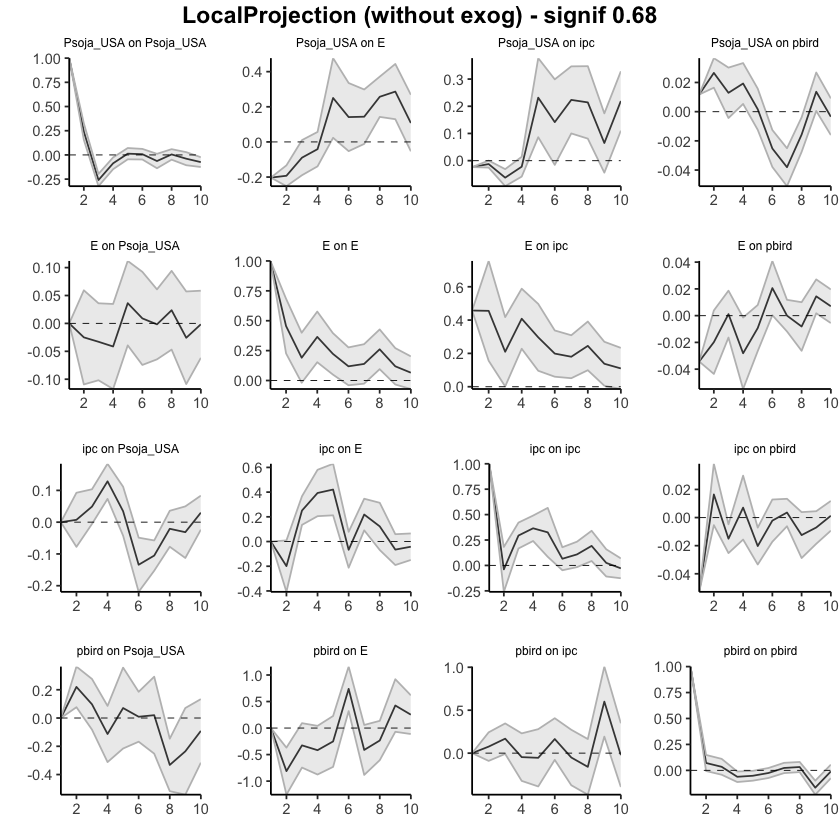

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Psoja_USA", "E", "ipc", "pbird"), fixed_lags = 3, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
3,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Psoja_USA, E, ipc, pbird",4


LocalProjection (without exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.00000000,0.00000000,0.000000000
79,ipc,E,2,-0.19906758,-0.40715073,0.009015566
80,ipc,E,3,0.05175583,-0.27227014,0.375781792
81,ipc,E,4,0.44467215,-0.06704330,0.956387592
82,ipc,E,5,0.86546791,0.14513638,1.585799432
83,ipc,E,6,0.79856124,-0.06695184,1.664074325
84,ipc,E,7,1.01711959,0.02366593,2.010573248
85,ipc,E,8,1.13964765,-0.04480411,2.324099414
86,ipc,E,9,1.07418821,-0.23506469,2.383441117


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.0000000,0.000000,0.000000000
112,pbird,E,2,-0.8120553,-1.255248,-0.368862902
113,pbird,E,3,-1.1382859,-2.000112,-0.276459444
114,pbird,E,4,-1.5553469,-2.875817,-0.234876924
115,pbird,E,5,-1.8073112,-3.607355,-0.007266941
116,pbird,E,6,-1.0681716,-3.287513,1.151170332
117,pbird,E,7,-1.4806694,-4.170904,1.209565496
118,pbird,E,8,-1.7153347,-4.776270,1.345600550
119,pbird,E,9,-1.2901747,-4.846550,2.266200186


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Psoja_USA,E,1,-0.203161932,-0.2031619,-0.2031619
2,Psoja_USA,E,2,-0.395819976,-0.4551185,-0.3365214
3,Psoja_USA,E,3,-0.485377997,-0.6445910,-0.3261650
4,Psoja_USA,E,4,-0.526528750,-0.7836634,-0.2693941
5,Psoja_USA,E,5,-0.276298889,-0.7602363,0.2076385
6,Psoja_USA,E,6,-0.134927980,-0.8127863,0.5429303
7,Psoja_USA,E,7,0.008676365,-0.8241043,0.8414570
8,Psoja_USA,E,8,0.265724516,-0.6816514,1.2131004
9,Psoja_USA,E,9,0.552296322,-0.5523107,1.6569034


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4573026,0.4573026,0.4573026
46,E,ipc,2,0.9127439,0.6133015,1.2121863
47,E,ipc,3,1.1225023,0.6151121,1.6298925
48,E,ipc,4,1.5306303,0.8430533,2.2182073
49,E,ipc,5,1.8269660,0.9387946,2.7151373
50,E,ipc,6,2.0258326,0.9989010,3.0527641
51,E,ipc,7,2.2058165,1.0500036,3.3616294
52,E,ipc,8,2.4509910,1.1491295,3.7528525
53,E,ipc,9,2.5888285,1.1550556,4.0226013


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.00000000,0.0000000
123,pbird,ipc,2,0.07612314,-0.09010058,0.2423469
124,pbird,ipc,3,0.24477840,-0.09881205,0.5883689
125,pbird,ipc,4,0.19846544,-0.42175685,0.8186877
126,pbird,ipc,5,0.14420424,-0.80951037,1.0979188
127,pbird,ipc,6,0.30849028,-0.88767343,1.5046540
128,pbird,ipc,7,0.25780440,-1.26115870,1.7767675
129,pbird,ipc,8,0.09830192,-1.74430551,1.9409093
130,pbird,ipc,9,0.69828463,-1.55197271,2.9485420


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Psoja_USA,ipc,1,-0.02370532,-0.023705316,-0.02370532
13,Psoja_USA,ipc,2,-0.03628025,-0.049152359,-0.02340815
14,Psoja_USA,ipc,3,-0.09881359,-0.143024278,-0.05460290
15,Psoja_USA,ipc,4,-0.12104458,-0.201655517,-0.04043364
16,Psoja_USA,ipc,5,0.11058110,-0.115423058,0.33658526
17,Psoja_USA,ipc,6,0.25225423,-0.131031336,0.63553980
18,Psoja_USA,ipc,7,0.47566244,-0.030922979,0.98224785
19,Psoja_USA,ipc,8,0.68987557,0.050058961,1.32969217
20,Psoja_USA,ipc,9,0.75468671,0.005881511,1.50349190


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.03428340,-0.03428340,-0.03428340
57,E,pbird,2,-0.05412543,-0.07785530,-0.03039555
58,E,pbird,3,-0.05298496,-0.09422243,-0.01174749
59,E,pbird,4,-0.08111447,-0.14906042,-0.01316853
60,E,pbird,5,-0.09039304,-0.17555869,-0.00522738
61,E,pbird,6,-0.06979762,-0.17525003,0.03565478
62,E,pbird,7,-0.06979313,-0.18706646,0.04748021
63,E,pbird,8,-0.07791067,-0.21334999,0.05752865
64,E,pbird,9,-0.06349017,-0.21158230,0.08460196


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.05285028,-0.05285028,-0.052850285
90,ipc,pbird,2,-0.03640210,-0.05823263,-0.014571580
91,ipc,pbird,3,-0.05145256,-0.08352321,-0.019381905
92,ipc,pbird,4,-0.04436953,-0.09917958,0.010440514
93,ipc,pbird,5,-0.06465378,-0.13258025,0.003272684
94,ipc,pbird,6,-0.06682668,-0.14976186,0.016108495
95,ipc,pbird,7,-0.06324366,-0.15594391,0.029456594
96,ipc,pbird,8,-0.07571776,-0.18476149,0.033325962
97,ipc,pbird,9,-0.08279353,-0.20343082,0.037843766


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Psoja_USA,pbird,1,0.011749502,0.01174950,0.01174950
24,Psoja_USA,pbird,2,0.038302585,0.02817368,0.04843149
25,Psoja_USA,pbird,3,0.051214649,0.02381687,0.07861243
26,Psoja_USA,pbird,4,0.070499059,0.02909503,0.11190309
27,Psoja_USA,pbird,5,0.072167658,0.01665636,0.12767896
28,Psoja_USA,pbird,6,0.046923553,-0.02125649,0.11510360
29,Psoja_USA,pbird,7,0.008867101,-0.07230750,0.09004170
30,Psoja_USA,pbird,8,-0.006861323,-0.09988240,0.08615975
31,Psoja_USA,pbird,9,0.006795542,-0.09939280,0.11298389


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Psoja_USA,1,0.00000000,0.0000000,0.00000000
35,E,Psoja_USA,2,-0.02499737,-0.1093395,0.05934474
36,E,Psoja_USA,3,-0.05789323,-0.2112026,0.09541612
37,E,Psoja_USA,4,-0.09924765,-0.3287440,0.13024866
38,E,Psoja_USA,5,-0.06295087,-0.3680846,0.24218282
39,E,Psoja_USA,6,-0.05395920,-0.4425265,0.33460807
40,E,Psoja_USA,7,-0.05566471,-0.5069146,0.39558517
41,E,Psoja_USA,8,-0.03205213,-0.5538326,0.48972836
42,E,Psoja_USA,9,-0.05780443,-0.6625818,0.54697294


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Psoja_USA,1,0.000000000,0.000000000,0.00000000
68,ipc,Psoja_USA,2,0.007418441,-0.077728741,0.09256562
69,ipc,Psoja_USA,3,0.056443161,-0.083250024,0.19613635
70,ipc,Psoja_USA,4,0.184992319,-0.009951986,0.37993662
71,ipc,Psoja_USA,5,0.219504986,-0.052484366,0.49149434
72,ipc,Psoja_USA,6,0.085491820,-0.271735412,0.44271905
73,ipc,Psoja_USA,7,-0.019684302,-0.424549760,0.38518116
74,ipc,Psoja_USA,8,-0.040475414,-0.501950701,0.42099987
75,ipc,Psoja_USA,9,-0.071975972,-0.614628588,0.47067664


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Psoja_USA,1,0.00000000,0.000000000,0.0000000
101,pbird,Psoja_USA,2,0.22017204,0.076492787,0.3638513
102,pbird,Psoja_USA,3,0.31723499,-0.005673041,0.6401430
103,pbird,Psoja_USA,4,0.20410822,-0.317543444,0.7257599
104,pbird,Psoja_USA,5,0.27474233,-0.533283181,1.0827678
105,pbird,Psoja_USA,6,0.28377328,-0.700802962,1.2683495
106,pbird,Psoja_USA,7,0.30388824,-0.952940899,1.5607174
107,pbird,Psoja_USA,8,-0.02808194,-1.470493638,1.4143298
108,pbird,Psoja_USA,9,-0.26384439,-2.012738442,1.4850497


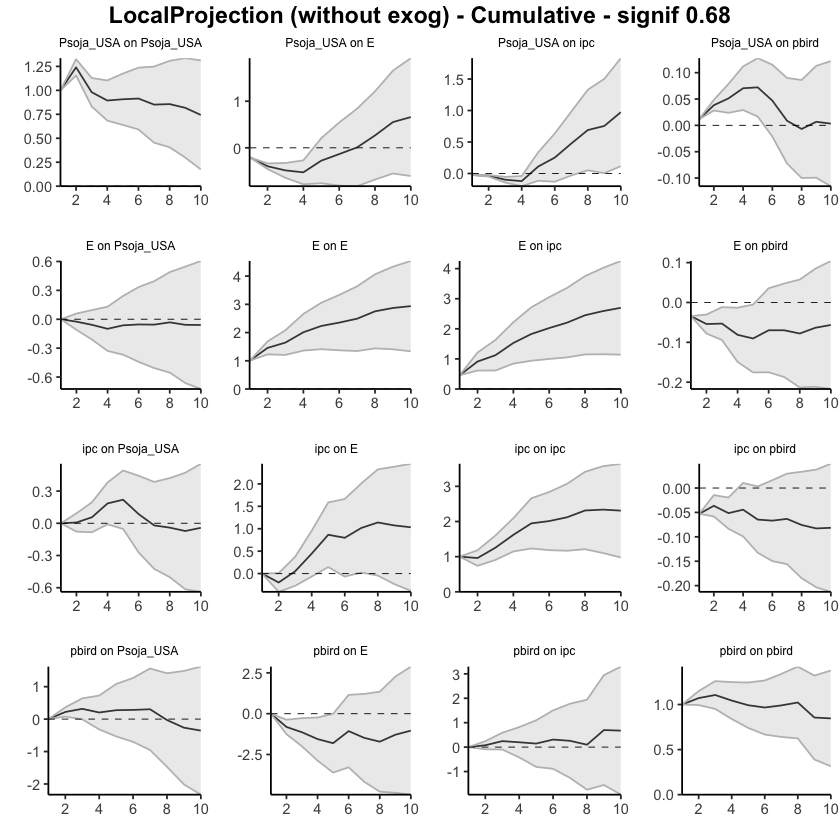

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Psoja_USA", "E", "ipc", "pbird"), fixed_lags = 3, horizons=10, signif = 0.68, cumulative=TRUE)

### Pmaíz_USA 1950 a 2023 - Todas endógenas - Selected orders: 2 y 5

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,NA,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Pmaíz_USA, E, ipc, pbird",4


LocalProjection (without exog) - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.000000000,0.00000000,0.0000000
79,ipc,E,2,-0.158788038,-0.55506767,0.2374916
80,ipc,E,3,0.266562042,-0.07989545,0.6130195
81,ipc,E,4,0.283091541,-0.23968319,0.8058663
82,ipc,E,5,0.414949761,0.06722693,0.7626726
83,ipc,E,6,-0.074371238,-0.33191266,0.1831702
84,ipc,E,7,0.174691503,-0.12012548,0.4695085
85,ipc,E,8,0.122177017,-0.29221979,0.5365738
86,ipc,E,9,-0.021828794,-0.26366499,0.2200074


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.00000000,0.00000000,0.0000000
112,pbird,E,2,-0.79087357,-1.68201482,0.1002677
113,pbird,E,3,-0.32402917,-1.13218550,0.4841272
114,pbird,E,4,-0.40538076,-1.30905349,0.4982920
115,pbird,E,5,-0.24070371,-1.14270384,0.6612964
116,pbird,E,6,0.75813288,-0.06624701,1.5825128
117,pbird,E,7,-0.36881100,-1.25288181,0.5152598
118,pbird,E,8,-0.15499379,-0.87551567,0.5655281
119,pbird,E,9,0.47453876,-0.50496336,1.4540409


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Pmaíz_USA,E,1,-0.08953000,-0.08953000,-0.0895300
2,Pmaíz_USA,E,2,-0.15215396,-0.29571151,-0.0085964
3,Pmaíz_USA,E,3,-0.09195738,-0.36109989,0.1771851
4,Pmaíz_USA,E,4,0.05909019,-0.20579524,0.3239756
5,Pmaíz_USA,E,5,0.21546418,-0.19513976,0.6260681
6,Pmaíz_USA,E,6,0.17696015,-0.18642743,0.5403477
7,Pmaíz_USA,E,7,0.27495682,-0.08167091,0.6315845
8,Pmaíz_USA,E,8,0.15878519,-0.13824710,0.4558175
9,Pmaíz_USA,E,9,0.20874291,-0.07469025,0.4921761


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4648850,0.46488504,0.4648850
46,E,ipc,2,0.4742743,-0.17458283,1.1231315
47,E,ipc,3,0.2189777,-0.29602853,0.7339838
48,E,ipc,4,0.3853843,-0.08498835,0.8557570
49,E,ipc,5,0.2903976,-0.10931264,0.6901078
50,E,ipc,6,0.2018151,-0.09026183,0.4938921
51,E,ipc,7,0.1702668,-0.10682999,0.4473635
52,E,ipc,8,0.2260409,-0.09886752,0.5509494
53,E,ipc,9,0.1439261,-0.10155462,0.3894068


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.000000000,0.0000000,0.0000000
123,pbird,ipc,2,0.080330925,-0.2568239,0.4174857
124,pbird,ipc,3,0.177523504,-0.1726288,0.5276758
125,pbird,ipc,4,-0.011571484,-0.5730129,0.5498700
126,pbird,ipc,5,-0.010027656,-0.6609277,0.6408724
127,pbird,ipc,6,0.239782973,-0.2279060,0.7074719
128,pbird,ipc,7,0.014940573,-0.5245344,0.5544156
129,pbird,ipc,8,-0.121477421,-0.7554141,0.5124592
130,pbird,ipc,9,0.638880758,-0.1594747,1.4372362


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Pmaíz_USA,ipc,1,0.04450260,0.04450260,0.04450260
13,Pmaíz_USA,ipc,2,-0.01092750,-0.10312573,0.08127072
14,Pmaíz_USA,ipc,3,-0.08282152,-0.20939022,0.04374719
15,Pmaíz_USA,ipc,4,0.04735711,-0.03768277,0.13239700
16,Pmaíz_USA,ipc,5,0.19829745,-0.18498074,0.58157564
17,Pmaíz_USA,ipc,6,0.08218715,-0.16296526,0.32733956
18,Pmaíz_USA,ipc,7,0.25534488,-0.03565713,0.54634690
19,Pmaíz_USA,ipc,8,0.13053910,-0.14971723,0.41079543
20,Pmaíz_USA,ipc,9,0.08980475,-0.17580991,0.35541940


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.034170131,-0.03417013,-0.03417013
57,E,pbird,2,-0.018359980,-0.07010609,0.03338613
58,E,pbird,3,0.002548269,-0.03592850,0.04102503
59,E,pbird,4,-0.026948261,-0.07207707,0.01818055
60,E,pbird,5,-0.008214606,-0.03898031,0.02255109
61,E,pbird,6,0.021512621,-0.01387734,0.05690258
62,E,pbird,7,0.001420924,-0.02450629,0.02734814
63,E,pbird,8,-0.005826774,-0.04004354,0.02838999
64,E,pbird,9,0.011057670,-0.01009626,0.03221160


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.049354599,-0.04935460,-0.049354599
90,ipc,pbird,2,0.026348080,-0.02158827,0.074284428
91,ipc,pbird,3,-0.008825754,-0.03676103,0.019109521
92,ipc,pbird,4,0.018833440,-0.01425557,0.051922449
93,ipc,pbird,5,-0.012040519,-0.03308414,0.009003099
94,ipc,pbird,6,-0.005933500,-0.02936670,0.017499696
95,ipc,pbird,7,-0.007845720,-0.02994562,0.014254174
96,ipc,pbird,8,-0.001932379,-0.03185376,0.027988998
97,ipc,pbird,9,-0.012684490,-0.02854963,0.003180648


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Pmaíz_USA,pbird,1,0.017370925,0.017370925,0.017370925
24,Pmaíz_USA,pbird,2,-0.001785917,-0.031400323,0.027828489
25,Pmaíz_USA,pbird,3,0.029310334,-0.002484251,0.061104918
26,Pmaíz_USA,pbird,4,-0.019187426,-0.052194766,0.013819915
27,Pmaíz_USA,pbird,5,-0.007718796,-0.038698582,0.023260990
28,Pmaíz_USA,pbird,6,-0.012571850,-0.044734019,0.019590318
29,Pmaíz_USA,pbird,7,-0.020348944,-0.049736544,0.009038656
30,Pmaíz_USA,pbird,8,-0.001924502,-0.031106317,0.027257312
31,Pmaíz_USA,pbird,9,-0.001339833,-0.036278295,0.033598629


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Pmaíz_USA,1,0.000000000,0.00000000,0.00000000
35,E,Pmaíz_USA,2,-0.016841554,-0.13714143,0.10345832
36,E,Pmaíz_USA,3,-0.025811019,-0.14871476,0.09709272
37,E,Pmaíz_USA,4,0.002523129,-0.12194043,0.12698669
38,E,Pmaíz_USA,5,0.038211748,-0.07988782,0.15631131
39,E,Pmaíz_USA,6,-0.026689664,-0.12140030,0.06802097
40,E,Pmaíz_USA,7,-0.064495964,-0.14387334,0.01488141
41,E,Pmaíz_USA,8,-0.014862876,-0.14971750,0.11999174
42,E,Pmaíz_USA,9,0.004237044,-0.11976317,0.12823726


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Pmaíz_USA,1,0.00000000,0.000000000,0.000000000
68,ipc,Pmaíz_USA,2,0.06491017,-0.035840192,0.165660526
69,ipc,Pmaíz_USA,3,-0.04826184,-0.142450761,0.045927086
70,ipc,Pmaíz_USA,4,0.02347025,-0.083888131,0.130828639
71,ipc,Pmaíz_USA,5,0.07370831,-0.022744837,0.170161462
72,ipc,Pmaíz_USA,6,-0.09464448,-0.185202143,-0.004086826
73,ipc,Pmaíz_USA,7,0.05366083,-0.008554229,0.115875897
74,ipc,Pmaíz_USA,8,0.06264042,-0.036325883,0.161606730
75,ipc,Pmaíz_USA,9,-0.01297636,-0.106819660,0.080866940


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Pmaíz_USA,1,0.00000000,0.00000000,0.0000000
101,pbird,Pmaíz_USA,2,0.38679457,0.02926832,0.7443208
102,pbird,Pmaíz_USA,3,0.15087589,-0.22628057,0.5280324
103,pbird,Pmaíz_USA,4,-0.16517031,-0.55660650,0.2262659
104,pbird,Pmaíz_USA,5,-0.13856498,-0.68577930,0.4086493
105,pbird,Pmaíz_USA,6,-0.03703657,-0.50257195,0.4284988
106,pbird,Pmaíz_USA,7,0.46619695,-0.06373968,0.9961336
107,pbird,Pmaíz_USA,8,-0.08594449,-0.44524153,0.2733525
108,pbird,Pmaíz_USA,9,-0.24862407,-0.78274351,0.2854954


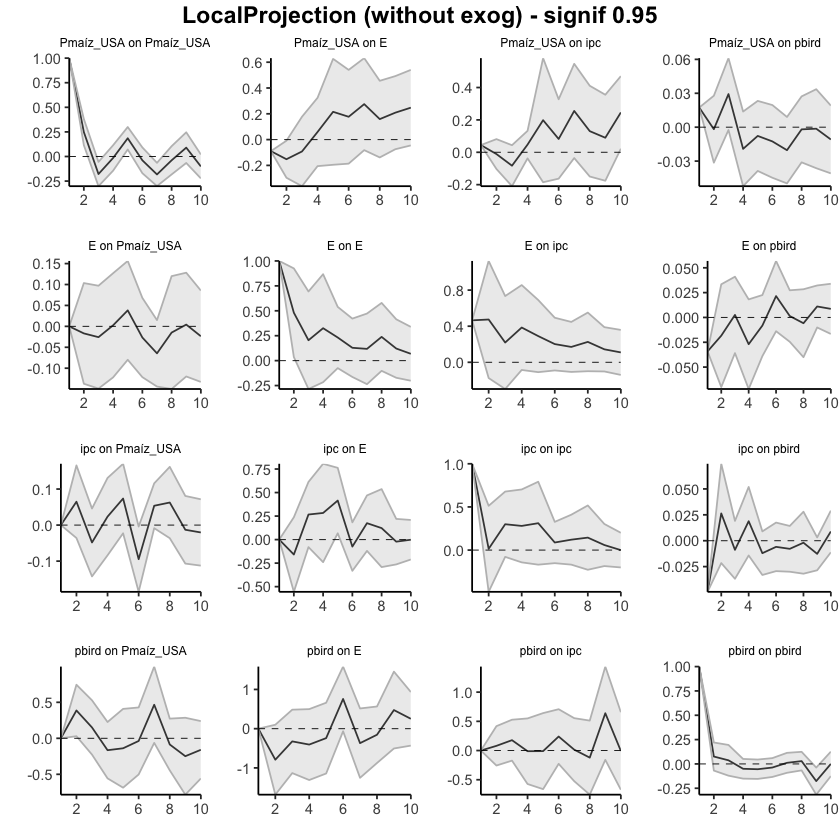

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Pmaíz_USA", "E", "ipc", "pbird"), fixed_lags = 2, horizons=10, signif = 0.95)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Pmaíz_USA, E, ipc, pbird",4


LocalProjection (without exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.000000000,0.00000000,0.00000000
79,ipc,E,2,-0.158788038,-0.36097153,0.04339545
80,ipc,E,3,0.266562042,0.08979802,0.44332607
81,ipc,E,4,0.283091541,0.01636974,0.54981334
82,ipc,E,5,0.414949761,0.23754016,0.59235937
83,ipc,E,6,-0.074371238,-0.20576992,0.05702745
84,ipc,E,7,0.174691503,0.02427467,0.32510833
85,ipc,E,8,0.122177017,-0.08924993,0.33360396
86,ipc,E,9,-0.021828794,-0.14521461,0.10155702


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.00000000,0.00000000,0.00000000
112,pbird,E,2,-0.79087357,-1.24553747,-0.33620966
113,pbird,E,3,-0.32402917,-0.73635383,0.08829548
114,pbird,E,4,-0.40538076,-0.86643828,0.05567675
115,pbird,E,5,-0.24070371,-0.70090786,0.21950045
116,pbird,E,6,0.75813288,0.33753090,1.17873487
117,pbird,E,7,-0.36881100,-0.81986754,0.08224554
118,pbird,E,8,-0.15499379,-0.52260700,0.21261941
119,pbird,E,9,0.47453876,-0.02520722,0.97428474


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Pmaíz_USA,E,1,-0.08953000,-0.089530001,-0.08953000
2,Pmaíz_USA,E,2,-0.15215396,-0.225397606,-0.07891031
3,Pmaíz_USA,E,3,-0.09195738,-0.229274990,0.04536022
4,Pmaíz_USA,E,4,0.05909019,-0.076055441,0.19423582
5,Pmaíz_USA,E,5,0.21546418,0.005972371,0.42495598
6,Pmaíz_USA,E,6,0.17696015,-0.008441677,0.36236197
7,Pmaíz_USA,E,7,0.27495682,0.093003895,0.45690974
8,Pmaíz_USA,E,8,0.15878519,0.007238102,0.31033227
9,Pmaíz_USA,E,9,0.20874291,0.064134156,0.35335167


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4648850,0.46488504,0.4648850
46,E,ipc,2,0.4742743,0.14322476,0.8053239
47,E,ipc,3,0.2189777,-0.04378060,0.4817359
48,E,ipc,4,0.3853843,0.14539826,0.6253704
49,E,ipc,5,0.2903976,0.08646379,0.4943314
50,E,ipc,6,0.2018151,0.05279626,0.3508340
51,E,ipc,7,0.1702668,0.02889087,0.3116427
52,E,ipc,8,0.2260409,0.06027132,0.3918106
53,E,ipc,9,0.1439261,0.01868084,0.2691714


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.000000000,0.000000000,0.0000000
123,pbird,ipc,2,0.080330925,-0.091686826,0.2523487
124,pbird,ipc,3,0.177523504,-0.001125627,0.3561726
125,pbird,ipc,4,-0.011571484,-0.298021210,0.2748782
126,pbird,ipc,5,-0.010027656,-0.342119518,0.3220642
127,pbird,ipc,6,0.239782973,0.001166163,0.4783998
128,pbird,ipc,7,0.014940573,-0.260301768,0.2901829
129,pbird,ipc,8,-0.121477421,-0.444914492,0.2019597
130,pbird,ipc,9,0.638880758,0.231556540,1.0462050


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Pmaíz_USA,ipc,1,0.04450260,0.044502601,0.04450260
13,Pmaíz_USA,ipc,2,-0.01092750,-0.057967415,0.03611241
14,Pmaíz_USA,ipc,3,-0.08282152,-0.147397387,-0.01824564
15,Pmaíz_USA,ipc,4,0.04735711,0.003969418,0.09074481
16,Pmaíz_USA,ipc,5,0.19829745,0.002747350,0.39384755
17,Pmaíz_USA,ipc,6,0.08218715,-0.042890613,0.20726491
18,Pmaíz_USA,ipc,7,0.25534488,0.106874466,0.40381530
19,Pmaíz_USA,ipc,8,0.13053910,-0.012448821,0.27352702
20,Pmaíz_USA,ipc,9,0.08980475,-0.045712936,0.22532243


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.034170131,-0.0341701314,-0.034170131
57,E,pbird,2,-0.018359980,-0.0447610575,0.008041098
58,E,pbird,3,0.002548269,-0.0170827337,0.022179271
59,E,pbird,4,-0.026948261,-0.0499731624,-0.003923359
60,E,pbird,5,-0.008214606,-0.0239113924,0.007482180
61,E,pbird,6,0.021512621,0.0034565183,0.039568723
62,E,pbird,7,0.001420924,-0.0118072463,0.014649095
63,E,pbird,8,-0.005826774,-0.0232843085,0.011630761
64,E,pbird,9,0.011057670,0.0002648474,0.021850492


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.049354599,-0.049354599,-0.049354599
90,ipc,pbird,2,0.026348080,0.001890760,0.050805400
91,ipc,pbird,3,-0.008825754,-0.023078446,0.005426937
92,ipc,pbird,4,0.018833440,0.001951293,0.035715587
93,ipc,pbird,5,-0.012040519,-0.022777059,-0.001303979
94,ipc,pbird,6,-0.005933500,-0.017889212,0.006022212
95,ipc,pbird,7,-0.007845720,-0.019121177,0.003429736
96,ipc,pbird,8,-0.001932379,-0.017198387,0.013333630
97,ipc,pbird,9,-0.012684490,-0.020778948,-0.004590032


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Pmaíz_USA,pbird,1,0.017370925,0.01737092,0.017370925
24,Pmaíz_USA,pbird,2,-0.001785917,-0.01689531,0.013323474
25,Pmaíz_USA,pbird,3,0.029310334,0.01308861,0.045532061
26,Pmaíz_USA,pbird,4,-0.019187426,-0.03602791,-0.002346946
27,Pmaíz_USA,pbird,5,-0.007718796,-0.02352481,0.008087218
28,Pmaíz_USA,pbird,6,-0.012571850,-0.02898112,0.003837419
29,Pmaíz_USA,pbird,7,-0.020348944,-0.03534262,-0.005355271
30,Pmaíz_USA,pbird,8,-0.001924502,-0.01681318,0.012964179
31,Pmaíz_USA,pbird,9,-0.001339833,-0.01916558,0.016485913


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Pmaíz_USA,1,0.000000000,0.00000000,0.00000000
35,E,Pmaíz_USA,2,-0.016841554,-0.07821904,0.04453593
36,E,Pmaíz_USA,3,-0.025811019,-0.08851701,0.03689497
37,E,Pmaíz_USA,4,0.002523129,-0.06097869,0.06602495
38,E,Pmaíz_USA,5,0.038211748,-0.02204313,0.09846663
39,E,Pmaíz_USA,6,-0.026689664,-0.07501142,0.02163209
40,E,Pmaíz_USA,7,-0.064495964,-0.10499462,-0.02399730
41,E,Pmaíz_USA,8,-0.014862876,-0.08366625,0.05394050
42,E,Pmaíz_USA,9,0.004237044,-0.05902837,0.06750246


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Pmaíz_USA,1,0.00000000,0.00000000,0.0000000000
68,ipc,Pmaíz_USA,2,0.06491017,0.01350692,0.1163134110
69,ipc,Pmaíz_USA,3,-0.04826184,-0.09631741,-0.0002062643
70,ipc,Pmaíz_USA,4,0.02347025,-0.03130443,0.0782449405
71,ipc,Pmaíz_USA,5,0.07370831,0.02449752,0.1229191028
72,ipc,Pmaíz_USA,6,-0.09464448,-0.14084737,-0.0484415972
73,ipc,Pmaíz_USA,7,0.05366083,0.02191845,0.0854032128
74,ipc,Pmaíz_USA,8,0.06264042,0.01214741,0.1131334367
75,ipc,Pmaíz_USA,9,-0.01297636,-0.06085559,0.0349028743


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Pmaíz_USA,1,0.00000000,0.00000000,0.00000000
101,pbird,Pmaíz_USA,2,0.38679457,0.20438322,0.56920592
102,pbird,Pmaíz_USA,3,0.15087589,-0.04155087,0.34330266
103,pbird,Pmaíz_USA,4,-0.16517031,-0.36488265,0.03454203
104,pbird,Pmaíz_USA,5,-0.13856498,-0.41775596,0.14062599
105,pbird,Pmaíz_USA,6,-0.03703657,-0.27455462,0.20048148
106,pbird,Pmaíz_USA,7,0.46619695,0.19582112,0.73657278
107,pbird,Pmaíz_USA,8,-0.08594449,-0.26925931,0.09737033
108,pbird,Pmaíz_USA,9,-0.24862407,-0.52113399,0.02388586


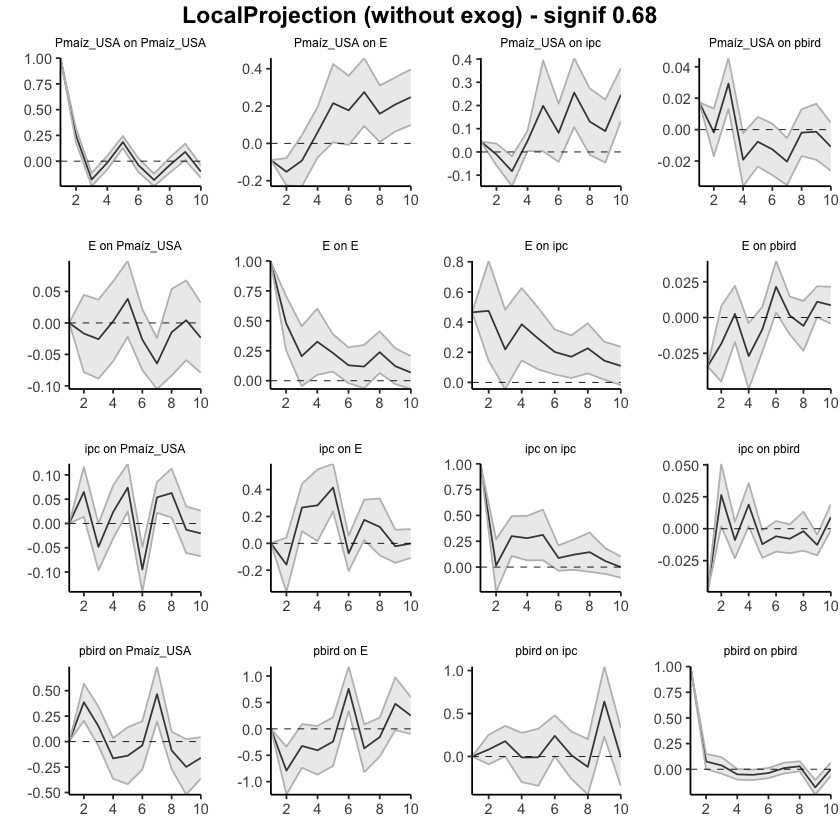

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Pmaíz_USA", "E", "ipc", "pbird"), fixed_lags = 2, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Pmaíz_USA, E, ipc, pbird",4


LocalProjection (without exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.0000000,0.00000000,0.00000000
79,ipc,E,2,-0.1587880,-0.36097153,0.04339545
80,ipc,E,3,0.1077740,-0.27117351,0.48672152
81,ipc,E,4,0.3908655,-0.25480377,1.03653486
82,ipc,E,5,0.8058153,-0.01726361,1.62889422
83,ipc,E,6,0.7314441,-0.22303354,1.68592167
84,ipc,E,7,0.9061356,-0.19875886,2.01103000
85,ipc,E,8,1.0283126,-0.28800879,2.34463397
86,ipc,E,9,1.0064838,-0.43322340,2.44619099


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.0000000,0.000000,0.00000000
112,pbird,E,2,-0.7908736,-1.245537,-0.33620966
113,pbird,E,3,-1.1149027,-1.981891,-0.24791418
114,pbird,E,4,-1.5202835,-2.848330,-0.19223743
115,pbird,E,5,-1.7609872,-3.549237,0.02726302
116,pbird,E,6,-1.0028543,-3.211707,1.20599789
117,pbird,E,7,-1.3716653,-4.031574,1.28824343
118,pbird,E,8,-1.5266591,-4.554181,1.50086284
119,pbird,E,9,-1.0521204,-4.579388,2.47514758


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Pmaíz_USA,E,1,-0.08953000,-0.0895300,-0.08953000
2,Pmaíz_USA,E,2,-0.24168396,-0.3149276,-0.16844031
3,Pmaíz_USA,E,3,-0.33364134,-0.5442026,-0.12308008
4,Pmaíz_USA,E,4,-0.27455115,-0.6202580,0.07115573
5,Pmaíz_USA,E,5,-0.05908698,-0.6142857,0.49611171
6,Pmaíz_USA,E,6,0.11787317,-0.6227273,0.85847368
7,Pmaíz_USA,E,7,0.39282999,-0.5297234,1.31538342
8,Pmaíz_USA,E,8,0.55161517,-0.5224853,1.62571570
9,Pmaíz_USA,E,9,0.76035809,-0.4583512,1.97906737


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4648850,0.4648850,0.464885
46,E,ipc,2,0.9391594,0.6081098,1.270209
47,E,ipc,3,1.1581370,0.5643292,1.751945
48,E,ipc,4,1.5435213,0.7097275,2.377315
49,E,ipc,5,1.8339189,0.7961912,2.871647
50,E,ipc,6,2.0357340,0.8489875,3.222481
51,E,ipc,7,2.2060008,0.8778784,3.534123
52,E,ipc,8,2.4320417,0.9381497,3.925934
53,E,ipc,9,2.5759678,0.9568305,4.195105


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.00000000,0.0000000
123,pbird,ipc,2,0.08033092,-0.09168683,0.2523487
124,pbird,ipc,3,0.25785443,-0.09281245,0.6085213
125,pbird,ipc,4,0.24628294,-0.39083366,0.8833996
126,pbird,ipc,5,0.23625529,-0.73295318,1.2054638
127,pbird,ipc,6,0.47603826,-0.73178702,1.6838635
128,pbird,ipc,7,0.49097883,-0.99208879,1.9740465
129,pbird,ipc,8,0.36950141,-1.43700328,2.1760061
130,pbird,ipc,9,1.00838217,-1.20544674,3.2222111


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Pmaíz_USA,ipc,1,0.044502601,0.04450260,0.04450260
13,Pmaíz_USA,ipc,2,0.033575097,-0.01346481,0.08061501
14,Pmaíz_USA,ipc,3,-0.049246419,-0.16086220,0.06236936
15,Pmaíz_USA,ipc,4,-0.001889305,-0.15689278,0.15311417
16,Pmaíz_USA,ipc,5,0.196408143,-0.15414543,0.54696172
17,Pmaíz_USA,ipc,6,0.278595290,-0.19703605,0.75422663
18,Pmaíz_USA,ipc,7,0.533940175,-0.09016158,1.15804193
19,Pmaíz_USA,ipc,8,0.664479275,-0.10261040,1.43156895
20,Pmaíz_USA,ipc,9,0.754284021,-0.14832334,1.65689138


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.03417013,-0.03417013,-0.0341701314
57,E,pbird,2,-0.05253011,-0.07893119,-0.0261290339
58,E,pbird,3,-0.04998184,-0.09601392,-0.0039497627
59,E,pbird,4,-0.07693010,-0.14598709,-0.0078731222
60,E,pbird,5,-0.08514471,-0.16989848,-0.0003909427
61,E,pbird,6,-0.06363209,-0.16644196,0.0391777800
62,E,pbird,7,-0.06221117,-0.17824921,0.0538268747
63,E,pbird,8,-0.06803794,-0.20153351,0.0654576352
64,E,pbird,9,-0.05698027,-0.20126867,0.0873081269


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.04935460,-0.04935460,-0.049354599
90,ipc,pbird,2,-0.02300652,-0.04746384,0.001450801
91,ipc,pbird,3,-0.03183227,-0.07054229,0.006877738
92,ipc,pbird,4,-0.01299883,-0.06859099,0.042593326
93,ipc,pbird,5,-0.02503935,-0.09136805,0.041289346
94,ipc,pbird,6,-0.03097285,-0.10925726,0.047311558
95,ipc,pbird,7,-0.03881857,-0.12837844,0.050741295
96,ipc,pbird,8,-0.04075095,-0.14557683,0.064074925
97,ipc,pbird,9,-0.05343544,-0.16635578,0.059484893


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Pmaíz_USA,pbird,1,0.017370925,0.0173709247,0.01737092
24,Pmaíz_USA,pbird,2,0.015585007,0.0004756165,0.03069440
25,Pmaíz_USA,pbird,3,0.044895341,0.0135642237,0.07622646
26,Pmaíz_USA,pbird,4,0.025707915,-0.0224636821,0.07387951
27,Pmaíz_USA,pbird,5,0.017989120,-0.0459884913,0.08196673
28,Pmaíz_USA,pbird,6,0.005417269,-0.0749696114,0.08580415
29,Pmaíz_USA,pbird,7,-0.014931675,-0.1103122287,0.08044888
30,Pmaíz_USA,pbird,8,-0.016856177,-0.1271254117,0.09341306
31,Pmaíz_USA,pbird,9,-0.018196009,-0.1462909902,0.10989897


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Pmaíz_USA,1,0.000000000,0.00000000,0.00000000
35,E,Pmaíz_USA,2,-0.016841554,-0.07821904,0.04453593
36,E,Pmaíz_USA,3,-0.042652573,-0.16673605,0.08143090
37,E,Pmaíz_USA,4,-0.040129444,-0.22771474,0.14745585
38,E,Pmaíz_USA,5,-0.001917696,-0.24975787,0.24592248
39,E,Pmaíz_USA,6,-0.028607359,-0.32476929,0.26755457
40,E,Pmaíz_USA,7,-0.093103323,-0.42976391,0.24355726
41,E,Pmaíz_USA,8,-0.107966200,-0.51343017,0.29749777
42,E,Pmaíz_USA,9,-0.103729156,-0.57245854,0.36500023


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Pmaíz_USA,1,0.00000000,0.00000000,0.0000000
68,ipc,Pmaíz_USA,2,0.06491017,0.01350692,0.1163134
69,ipc,Pmaíz_USA,3,0.01664833,-0.08281049,0.1161071
70,ipc,Pmaíz_USA,4,0.04011858,-0.11411492,0.1943521
71,ipc,Pmaíz_USA,5,0.11382690,-0.08961740,0.3172712
72,ipc,Pmaíz_USA,6,0.01918241,-0.23046477,0.2688296
73,ipc,Pmaíz_USA,7,0.07284324,-0.20854632,0.3542328
74,ipc,Pmaíz_USA,8,0.13548367,-0.19639891,0.4673662
75,ipc,Pmaíz_USA,9,0.12250731,-0.25725450,0.5022691


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Pmaíz_USA,1,0.0000000,0.0000000,0.0000000
101,pbird,Pmaíz_USA,2,0.3867946,0.2043832,0.5692059
102,pbird,Pmaíz_USA,3,0.5376705,0.1628323,0.9125086
103,pbird,Pmaíz_USA,4,0.3725002,-0.2020503,0.9470506
104,pbird,Pmaíz_USA,5,0.2339352,-0.6198063,1.0876766
105,pbird,Pmaíz_USA,6,0.1968986,-0.8943609,1.2881581
106,pbird,Pmaíz_USA,7,0.6630956,-0.6985398,2.0247309
107,pbird,Pmaíz_USA,8,0.5771511,-0.9677991,2.1221012
108,pbird,Pmaíz_USA,9,0.3285270,-1.4889331,2.1459871


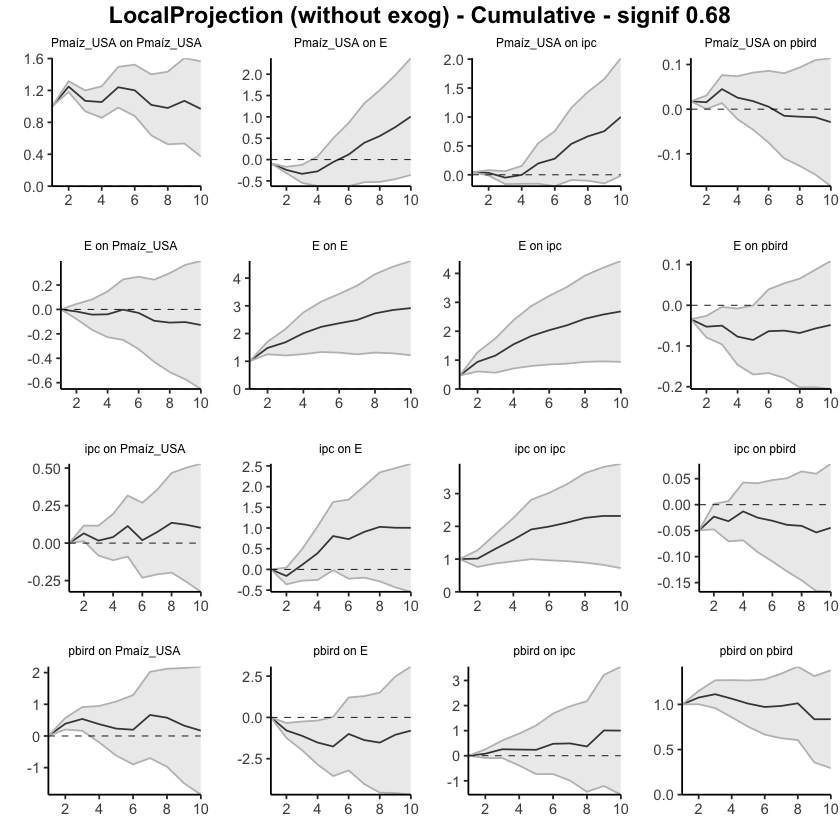

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Pmaíz_USA", "E", "ipc", "pbird"), fixed_lags = 2, horizons=10, signif = 0.68, cumulative=TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,NA,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Pmaíz_USA, E, ipc, pbird",4


LocalProjection (without exog) - Cumulative - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.00000000,0.0000000,0.00000000
79,ipc,E,2,-0.25247608,-0.5839630,0.07901082
80,ipc,E,3,0.03687051,-0.5400858,0.61382681
81,ipc,E,4,0.41392264,-0.5351438,1.36298911
82,ipc,E,5,0.72729149,-0.6306138,2.08519674
83,ipc,E,6,0.56243744,-1.0580734,2.18294832
84,ipc,E,7,0.77308179,-1.1129350,2.65909857
85,ipc,E,8,0.93447487,-1.3305633,3.19951307
86,ipc,E,9,0.84998429,-1.7357855,3.43575410


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.0000000,0.000000,0.0000000
112,pbird,E,2,-0.7577933,-1.622849,0.1072625
113,pbird,E,3,-1.0423433,-2.732464,0.6477779
114,pbird,E,4,-1.4771063,-4.069373,1.1151607
115,pbird,E,5,-1.7457011,-5.286311,1.7949086
116,pbird,E,6,-0.7767231,-5.168296,3.6148503
117,pbird,E,7,-1.1213604,-6.413613,4.1708923
118,pbird,E,8,-1.3843567,-7.473473,4.7047599
119,pbird,E,9,-0.9334807,-8.088186,6.2212251


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Pmaíz_USA,E,1,-0.19997933,-0.1999793,-0.1999793
2,Pmaíz_USA,E,2,-0.40351106,-0.5262161,-0.2808060
3,Pmaíz_USA,E,3,-0.48037900,-0.8005337,-0.1602243
4,Pmaíz_USA,E,4,-0.47917909,-1.0610602,0.1027020
5,Pmaíz_USA,E,5,-0.24221279,-1.2447416,0.7603160
6,Pmaíz_USA,E,6,-0.03178514,-1.3695801,1.3060098
7,Pmaíz_USA,E,7,0.31602466,-1.4135882,2.0456375
8,Pmaíz_USA,E,8,0.55272613,-1.4540111,2.5594634
9,Pmaíz_USA,E,9,0.80638298,-1.4795032,3.0922691


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4405735,0.44057351,0.4405735
46,E,ipc,2,0.9039804,0.37149775,1.4364631
47,E,ipc,3,1.1139201,0.24629638,1.9815439
48,E,ipc,4,1.5184529,0.33191728,2.7049885
49,E,ipc,5,1.7995862,0.22441980,3.3747527
50,E,ipc,6,1.9908872,0.15579831,3.8259760
51,E,ipc,7,2.1675175,0.10059149,4.2344436
52,E,ipc,8,2.4174430,0.07668836,4.7581976
53,E,ipc,9,2.5685074,-0.07783849,5.2148533


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.0000000,0.0000000,0.0000000
123,pbird,ipc,2,0.1458952,-0.1780105,0.4698009
124,pbird,ipc,3,0.3675822,-0.3673181,1.1024826
125,pbird,ipc,4,0.4250878,-0.8087603,1.6589360
126,pbird,ipc,5,0.3897345,-1.4872592,2.2667282
127,pbird,ipc,6,0.7098129,-1.6193225,3.0389482
128,pbird,ipc,7,0.7959349,-2.0643218,3.6561916
129,pbird,ipc,8,0.5435278,-2.9516720,4.0387276
130,pbird,ipc,9,1.2429597,-3.1239101,5.6098296


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Pmaíz_USA,ipc,1,-0.04536398,-0.04536398,-0.04536398
13,Pmaíz_USA,ipc,2,-0.09054655,-0.10507015,-0.07602295
14,Pmaíz_USA,ipc,3,-0.17341041,-0.27296338,-0.07385744
15,Pmaíz_USA,ipc,4,-0.18426576,-0.33533307,-0.03319844
16,Pmaíz_USA,ipc,5,0.04572618,-0.48042669,0.57187904
17,Pmaíz_USA,ipc,6,0.12877033,-0.63502299,0.89256364
18,Pmaíz_USA,ipc,7,0.41871094,-0.63148307,1.46890495
19,Pmaíz_USA,ipc,8,0.59963374,-0.69401957,1.89328705
20,Pmaíz_USA,ipc,9,0.72121351,-0.80803112,2.25045814


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.03101844,-0.03101844,-0.03101844
57,E,pbird,2,-0.05206281,-0.09215407,-0.01197155
58,E,pbird,3,-0.05414311,-0.12624523,0.01795901
59,E,pbird,4,-0.08381643,-0.20567564,0.03804278
60,E,pbird,5,-0.09215657,-0.24413531,0.05982217
61,E,pbird,6,-0.07126789,-0.26066538,0.11812959
62,E,pbird,7,-0.07287907,-0.28309778,0.13733965
63,E,pbird,8,-0.08298416,-0.32522225,0.15925394
64,E,pbird,9,-0.07233474,-0.33993763,0.19526815


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.04463708,-0.04463708,-0.044637079
90,ipc,pbird,2,-0.03038507,-0.06356666,0.002796517
91,ipc,pbird,3,-0.05653711,-0.10730354,-0.005770684
92,ipc,pbird,4,-0.04039537,-0.13502171,0.054230976
93,ipc,pbird,5,-0.05758793,-0.17602084,0.060844983
94,ipc,pbird,6,-0.06871603,-0.21467574,0.077243688
95,ipc,pbird,7,-0.08165461,-0.24610799,0.082798769
96,ipc,pbird,8,-0.10160861,-0.29441015,0.091192922
97,ipc,pbird,9,-0.11421904,-0.33107576,0.102637678


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Pmaíz_USA,pbird,1,0.02666287,0.0266628668,0.02666287
24,Pmaíz_USA,pbird,2,0.02003237,-0.0053904612,0.04545520
25,Pmaíz_USA,pbird,3,0.05331017,-0.0007375602,0.10735791
26,Pmaíz_USA,pbird,4,0.03666443,-0.0447981145,0.11812697
27,Pmaíz_USA,pbird,5,0.02562899,-0.0813115409,0.13256951
28,Pmaíz_USA,pbird,6,0.01153135,-0.1198580509,0.14292075
29,Pmaíz_USA,pbird,7,-0.01148299,-0.1701056731,0.14713968
30,Pmaíz_USA,pbird,8,-0.01752156,-0.1994544140,0.16441129
31,Pmaíz_USA,pbird,9,-0.01803049,-0.2325248936,0.19646392


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Pmaíz_USA,1,0.000000000,0.0000000,0.0000000
35,E,Pmaíz_USA,2,-0.021766466,-0.1548156,0.1112827
36,E,Pmaíz_USA,3,-0.023834079,-0.3068046,0.2591365
37,E,Pmaíz_USA,4,0.008376086,-0.3978808,0.4146330
38,E,Pmaíz_USA,5,0.038597682,-0.5107434,0.5879387
39,E,Pmaíz_USA,6,0.013476176,-0.6555981,0.6825505
40,E,Pmaíz_USA,7,-0.031717075,-0.7982625,0.7348284
41,E,Pmaíz_USA,8,-0.043250555,-0.9420559,0.8555548
42,E,Pmaíz_USA,9,-0.053731868,-1.1013366,0.9938729


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Pmaíz_USA,1,0.0000000,0.00000000,0.0000000
68,ipc,Pmaíz_USA,2,0.0674375,-0.05569141,0.1905664
69,ipc,Pmaíz_USA,3,0.1091514,-0.15040306,0.3687058
70,ipc,Pmaíz_USA,4,0.2406101,-0.13263494,0.6138551
71,ipc,Pmaíz_USA,5,0.2796094,-0.23756391,0.7967828
72,ipc,Pmaíz_USA,6,0.1841435,-0.46389884,0.8321859
73,ipc,Pmaíz_USA,7,0.3385634,-0.40138855,1.0785154
74,ipc,Pmaíz_USA,8,0.4524807,-0.40090103,1.3058625
75,ipc,Pmaíz_USA,9,0.3870327,-0.59588255,1.3699480


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Pmaíz_USA,1,0.00000000,0.00000000,0.0000000
101,pbird,Pmaíz_USA,2,0.50510180,0.15464936,0.8555542
102,pbird,Pmaíz_USA,3,0.66504517,-0.06897617,1.3990665
103,pbird,Pmaíz_USA,4,0.47578973,-0.64594400,1.5975235
104,pbird,Pmaíz_USA,5,0.29976379,-1.38823110,1.9877587
105,pbird,Pmaíz_USA,6,0.30638785,-1.86796172,2.4807374
106,pbird,Pmaíz_USA,7,0.75460307,-1.92664489,3.4358510
107,pbird,Pmaíz_USA,8,0.61823084,-2.43320260,3.6696643
108,pbird,Pmaíz_USA,9,0.33841105,-3.23468610,3.9115082


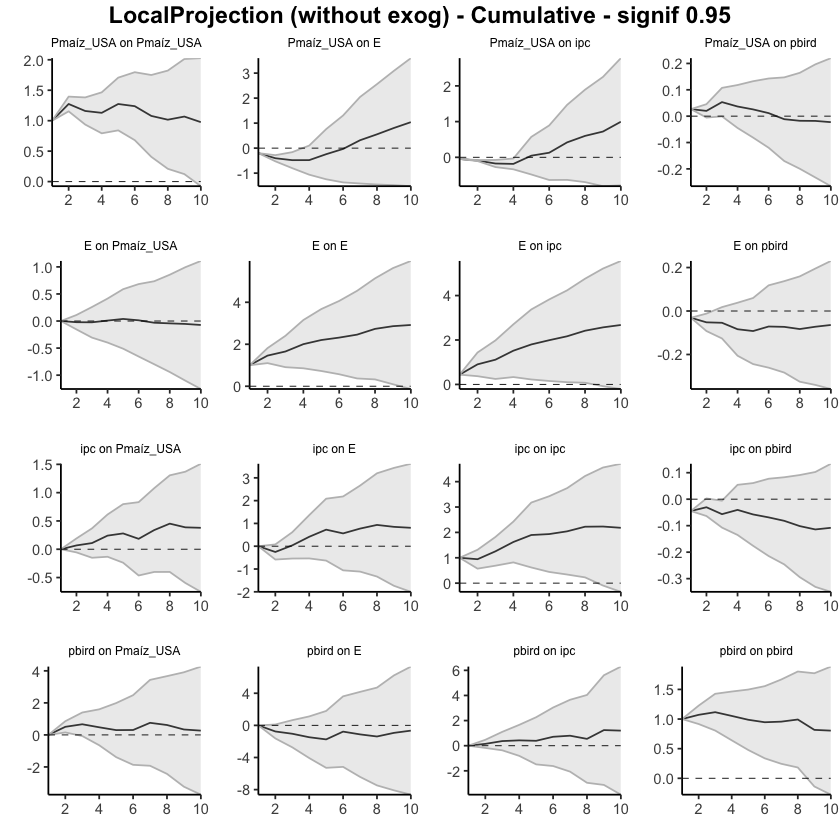

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Pmaíz_USA", "E", "ipc", "pbird"), fixed_lags = 5, horizons=10, signif = 0.95, cumulative=TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Pmaíz_USA, E, ipc, pbird",4


LocalProjection (without exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.00000000,0.00000000,0.00000000
79,ipc,E,2,-0.25247608,-0.42160205,-0.08335011
80,ipc,E,3,0.28934659,0.16410710,0.41458607
81,ipc,E,4,0.37705214,0.18720001,0.56690426
82,ipc,E,5,0.31336884,0.10477763,0.52196006
83,ipc,E,6,-0.16485405,-0.29883651,-0.03087158
84,ipc,E,7,0.21064435,0.07518216,0.34610654
85,ipc,E,8,0.16139308,-0.03198520,0.35477135
86,ipc,E,9,-0.08449057,-0.24812914,0.07914800


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.0000000,0.00000000,0.00000000
112,pbird,E,2,-0.7577933,-1.19914827,-0.31643829
113,pbird,E,3,-0.2845500,-0.70550174,0.13640173
114,pbird,E,4,-0.4347630,-0.89504149,0.02551544
115,pbird,E,5,-0.2685947,-0.75244308,0.21525359
116,pbird,E,6,0.9689780,0.53481290,1.40314311
117,pbird,E,7,-0.3446374,-0.80416766,0.11489295
118,pbird,E,8,-0.2629962,-0.66955940,0.14356693
119,pbird,E,9,0.4508760,-0.09279201,0.99454394


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Pmaíz_USA,E,1,-0.199979332,-0.19997933,-0.19997933
2,Pmaíz_USA,E,2,-0.203531725,-0.26613634,-0.14092711
3,Pmaíz_USA,E,3,-0.076867939,-0.17760756,0.02387169
4,Pmaíz_USA,E,4,0.001199906,-0.13233394,0.13473376
5,Pmaíz_USA,E,5,0.236966300,0.02235009,0.45158250
6,Pmaíz_USA,E,6,0.210427647,0.03937350,0.38148179
7,Pmaíz_USA,E,7,0.347809800,0.14790273,0.54771687
8,Pmaíz_USA,E,8,0.236701476,0.09531147,0.37809148
9,Pmaíz_USA,E,9,0.253656853,0.11123393,0.39607977


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4405735,0.440573505,0.4405735
46,E,ipc,2,0.4634069,0.191732075,0.7350817
47,E,ipc,3,0.2099397,0.038949375,0.3809301
48,E,ipc,4,0.4045328,0.241822629,0.5672429
49,E,ipc,5,0.2811333,0.082852305,0.4794143
50,E,ipc,6,0.1913009,0.058687450,0.3239144
51,E,ipc,7,0.1766304,0.058346086,0.2949146
52,E,ipc,8,0.2499254,0.110216978,0.3896339
53,E,ipc,9,0.1510645,-0.004849475,0.3069784


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.00000000,0.0000000
123,pbird,ipc,2,0.14589518,-0.01936283,0.3111532
124,pbird,ipc,3,0.22168706,0.01199590,0.4313782
125,pbird,ipc,4,0.05750559,-0.19705959,0.3120708
126,pbird,ipc,5,-0.03535330,-0.36348880,0.2927822
127,pbird,ipc,6,0.32007835,0.08939383,0.5507629
128,pbird,ipc,7,0.08612203,-0.18485827,0.3571023
129,pbird,ipc,8,-0.25240714,-0.57635767,0.0715434
130,pbird,ipc,9,0.69943197,0.25470233,1.1441616


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Pmaíz_USA,ipc,1,-0.04536398,-0.045363985,-0.04536398
13,Pmaíz_USA,ipc,2,-0.04518256,-0.052592562,-0.03777257
14,Pmaíz_USA,ipc,3,-0.08286386,-0.126246197,-0.03948153
15,Pmaíz_USA,ipc,4,-0.01085534,-0.037138174,0.01542748
16,Pmaíz_USA,ipc,5,0.22999193,0.038621753,0.42136211
17,Pmaíz_USA,ipc,6,0.08304415,-0.038200976,0.20428928
18,Pmaíz_USA,ipc,7,0.28994062,0.143817813,0.43606342
19,Pmaíz_USA,ipc,8,0.18092280,0.056708871,0.30513673
20,Pmaíz_USA,ipc,9,0.12157977,0.001380113,0.24177942


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.031018442,-0.031018442,-0.0310184423
57,E,pbird,2,-0.021044365,-0.041499090,-0.0005896398
58,E,pbird,3,-0.002080306,-0.018412377,0.0142517642
59,E,pbird,4,-0.029673318,-0.055059589,-0.0042870463
60,E,pbird,5,-0.008340140,-0.023707246,0.0070269659
61,E,pbird,6,0.020888678,0.001797481,0.0399798744
62,E,pbird,7,-0.001611172,-0.012234248,0.0090119033
63,E,pbird,8,-0.010105090,-0.026441511,0.0062313316
64,E,pbird,9,0.010649413,-0.002291806,0.0235906329


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.04463708,-0.044637079,-0.0446370792
90,ipc,pbird,2,0.01425201,-0.002677371,0.0311813907
91,ipc,pbird,3,-0.02615204,-0.035123901,-0.0171801854
92,ipc,pbird,4,0.01614175,-0.006235759,0.0385192541
93,ipc,pbird,5,-0.01719256,-0.029338769,-0.0050463528
94,ipc,pbird,6,-0.01112810,-0.025172387,0.0029161885
95,ipc,pbird,7,-0.01293859,-0.022374132,-0.0035030420
96,ipc,pbird,8,-0.01995400,-0.034417342,-0.0054906559
97,ipc,pbird,9,-0.01261043,-0.024883480,-0.0003373746


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Pmaíz_USA,pbird,1,0.0266628668,0.026662867,0.026662867
24,Pmaíz_USA,pbird,2,-0.0066304959,-0.019601329,0.006340337
25,Pmaíz_USA,pbird,3,0.0332778024,0.018673261,0.047882344
26,Pmaíz_USA,pbird,4,-0.0166457442,-0.030632892,-0.002658596
27,Pmaíz_USA,pbird,5,-0.0110354428,-0.024034414,0.001963528
28,Pmaíz_USA,pbird,6,-0.0140976366,-0.026571552,-0.001623722
29,Pmaíz_USA,pbird,7,-0.0230143445,-0.036908874,-0.009119815
30,Pmaíz_USA,pbird,8,-0.0060385678,-0.017931513,0.005854378
31,Pmaíz_USA,pbird,9,-0.0005089228,-0.017121962,0.016104116


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Pmaíz_USA,1,0.000000000,0.00000000,0.000000000
35,E,Pmaíz_USA,2,-0.021766466,-0.08964868,0.046115751
36,E,Pmaíz_USA,3,-0.002067613,-0.07855814,0.074422910
37,E,Pmaíz_USA,4,0.032210165,-0.03069103,0.095111362
38,E,Pmaíz_USA,5,0.030221596,-0.04278051,0.103223700
39,E,Pmaíz_USA,6,-0.025121506,-0.08620990,0.035966892
40,E,Pmaíz_USA,7,-0.045193251,-0.09492344,0.004536934
41,E,Pmaíz_USA,8,-0.011533480,-0.07901301,0.055946053
42,E,Pmaíz_USA,9,-0.010481313,-0.08639937,0.065436746


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Pmaíz_USA,1,0.000000000,0.000000000,0.0000000000
68,ipc,Pmaíz_USA,2,0.067437499,0.004616628,0.1302583700
69,ipc,Pmaíz_USA,3,0.041713877,-0.027890985,0.1113187396
70,ipc,Pmaíz_USA,4,0.131458680,0.073453291,0.1894640699
71,ipc,Pmaíz_USA,5,0.038999384,-0.034433447,0.1124322156
72,ipc,Pmaíz_USA,6,-0.095465935,-0.162235830,-0.0286960400
73,ipc,Pmaíz_USA,7,0.154419944,0.107527263,0.2013126238
74,ipc,Pmaíz_USA,8,0.113917277,0.056044950,0.1717896036
75,ipc,Pmaíz_USA,9,-0.065447988,-0.131536526,0.0006405505


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Pmaíz_USA,1,0.000000000,0.00000000,0.000000000
101,pbird,Pmaíz_USA,2,0.505101799,0.32629953,0.683904064
102,pbird,Pmaíz_USA,3,0.159943367,-0.03575505,0.355641783
103,pbird,Pmaíz_USA,4,-0.189255431,-0.38706788,0.008557020
104,pbird,Pmaíz_USA,5,-0.176025946,-0.46493469,0.112882802
105,pbird,Pmaíz_USA,6,0.006624065,-0.24151608,0.254764214
106,pbird,Pmaíz_USA,7,0.448215221,0.18959360,0.706836845
107,pbird,Pmaíz_USA,8,-0.136372231,-0.32524238,0.052497914
108,pbird,Pmaíz_USA,9,-0.279819798,-0.54597475,-0.013664846


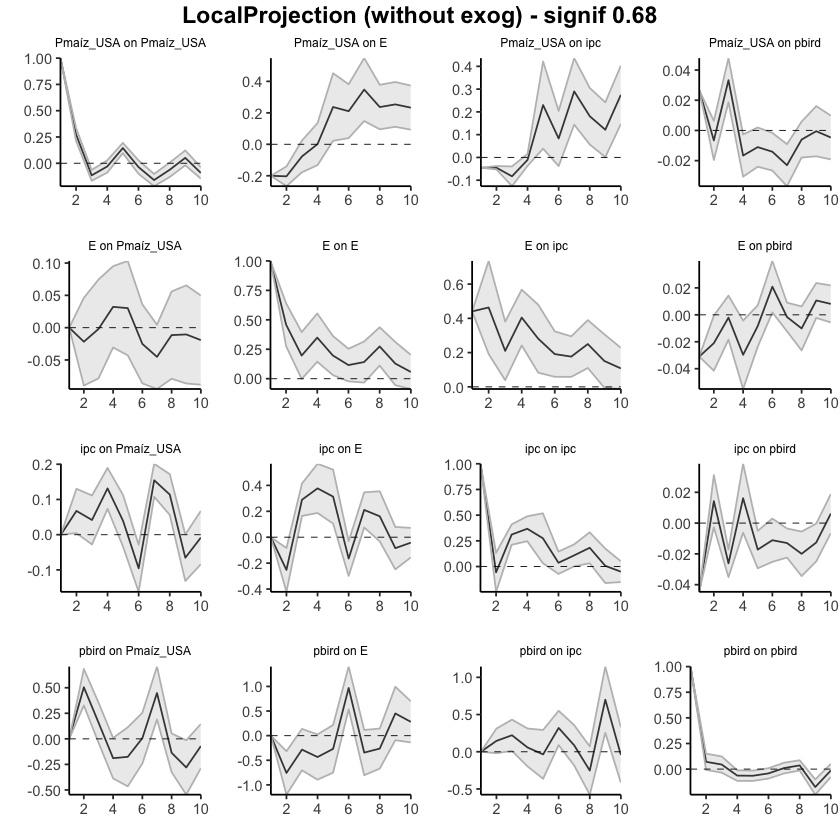

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Pmaíz_USA", "E", "ipc", "pbird"), fixed_lags = 5, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Pmaíz_USA, E, ipc, pbird",4


LocalProjection (without exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.00000000,0.00000000,0.00000000
79,ipc,E,2,-0.25247608,-0.42160205,-0.08335011
80,ipc,E,3,0.03687051,-0.25749495,0.33123597
81,ipc,E,4,0.41392264,-0.07029495,0.89814023
82,ipc,E,5,0.72729149,0.03448268,1.42010029
83,ipc,E,6,0.56243744,-0.26435383,1.38922871
84,ipc,E,7,0.77308179,-0.18917167,1.73533525
85,ipc,E,8,0.93447487,-0.22115687,2.09010660
86,ipc,E,9,0.84998429,-0.46928601,2.16925460


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.0000000,0.000000,0.00000000
112,pbird,E,2,-0.7577933,-1.199148,-0.31643829
113,pbird,E,3,-1.0423433,-1.904650,-0.18003656
114,pbird,E,4,-1.4771063,-2.799692,-0.15452112
115,pbird,E,5,-1.7457011,-3.552135,0.06073246
116,pbird,E,6,-0.7767231,-3.017322,1.46387558
117,pbird,E,7,-1.1213604,-3.821489,1.57876852
118,pbird,E,8,-1.3843567,-4.491049,1.72233545
119,pbird,E,9,-0.9334807,-4.583841,2.71687939


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Pmaíz_USA,E,1,-0.19997933,-0.1999793,-0.1999793
2,Pmaíz_USA,E,2,-0.40351106,-0.4661157,-0.3409064
3,Pmaíz_USA,E,3,-0.48037900,-0.6437232,-0.3170348
4,Pmaíz_USA,E,4,-0.47917909,-0.7760572,-0.1823010
5,Pmaíz_USA,E,5,-0.24221279,-0.7537071,0.2692815
6,Pmaíz_USA,E,6,-0.03178514,-0.7143336,0.6507633
7,Pmaíz_USA,E,7,0.31602466,-0.5664309,1.1984802
8,Pmaíz_USA,E,8,0.55272613,-0.4711194,1.5765717
9,Pmaíz_USA,E,9,0.80638298,-0.3598855,1.9726514


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4405735,0.4405735,0.4405735
46,E,ipc,2,0.9039804,0.6323056,1.1756552
47,E,ipc,3,1.1139201,0.6712550,1.5565853
48,E,ipc,4,1.5184529,0.9130776,2.1238282
49,E,ipc,5,1.7995862,0.9959299,2.6032426
50,E,ipc,6,1.9908872,1.0546173,2.9271570
51,E,ipc,7,2.1675175,1.1129634,3.2220716
52,E,ipc,8,2.4174430,1.2231804,3.6117055
53,E,ipc,9,2.5685074,1.2183309,3.9186839


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.0000000,0.000000000,0.0000000
123,pbird,ipc,2,0.1458952,-0.019362832,0.3111532
124,pbird,ipc,3,0.3675822,-0.007366934,0.7425314
125,pbird,ipc,4,0.4250878,-0.204426520,1.0546022
126,pbird,ipc,5,0.3897345,-0.567915315,1.3473844
127,pbird,ipc,6,0.7098129,-0.478521484,1.8981472
128,pbird,ipc,7,0.7959349,-0.663379758,2.2552496
129,pbird,ipc,8,0.5435278,-1.239737433,2.3267930
130,pbird,ipc,9,1.2429597,-0.985035099,3.4709546


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Pmaíz_USA,ipc,1,-0.04536398,-0.04536398,-0.04536398
13,Pmaíz_USA,ipc,2,-0.09054655,-0.09795655,-0.08313655
14,Pmaíz_USA,ipc,3,-0.17341041,-0.22420274,-0.12261808
15,Pmaíz_USA,ipc,4,-0.18426576,-0.26134092,-0.10719059
16,Pmaíz_USA,ipc,5,0.04572618,-0.22271917,0.31417152
17,Pmaíz_USA,ipc,6,0.12877033,-0.26092014,0.51846079
18,Pmaíz_USA,ipc,7,0.41871094,-0.11710233,0.95452421
19,Pmaíz_USA,ipc,8,0.59963374,-0.06039346,1.25966094
20,Pmaíz_USA,ipc,9,0.72121351,-0.05901334,1.50144036


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.03101844,-0.03101844,-0.03101844
57,E,pbird,2,-0.05206281,-0.07251753,-0.03160808
58,E,pbird,3,-0.05414311,-0.09092991,-0.01735632
59,E,pbird,4,-0.08381643,-0.14598950,-0.02164336
60,E,pbird,5,-0.09215657,-0.16969674,-0.01461640
61,E,pbird,6,-0.07126789,-0.16789926,0.02536348
62,E,pbird,7,-0.07287907,-0.18013351,0.03437538
63,E,pbird,8,-0.08298416,-0.20657502,0.04060671
64,E,pbird,9,-0.07233474,-0.20886683,0.06419734


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.04463708,-0.04463708,-0.044637079
90,ipc,pbird,2,-0.03038507,-0.04731445,-0.013455689
91,ipc,pbird,3,-0.05653711,-0.08243835,-0.030635874
92,ipc,pbird,4,-0.04039537,-0.08867411,0.007883380
93,ipc,pbird,5,-0.05758793,-0.11801288,0.002837027
94,ipc,pbird,6,-0.06871603,-0.14318527,0.005753216
95,ipc,pbird,7,-0.08165461,-0.16555940,0.002250174
96,ipc,pbird,8,-0.10160861,-0.19997674,-0.003240482
97,ipc,pbird,9,-0.11421904,-0.22486022,-0.003577857


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Pmaíz_USA,pbird,1,0.02666287,0.026662867,0.02666287
24,Pmaíz_USA,pbird,2,0.02003237,0.007061538,0.03300320
25,Pmaíz_USA,pbird,3,0.05331017,0.025734799,0.08088555
26,Pmaíz_USA,pbird,4,0.03666443,-0.004898093,0.07822695
27,Pmaíz_USA,pbird,5,0.02562899,-0.028932507,0.08019048
28,Pmaíz_USA,pbird,6,0.01153135,-0.055504059,0.07856676
29,Pmaíz_USA,pbird,7,-0.01148299,-0.092412933,0.06944694
30,Pmaíz_USA,pbird,8,-0.01752156,-0.110344446,0.07530132
31,Pmaíz_USA,pbird,9,-0.01803049,-0.127466408,0.09140544


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Pmaíz_USA,1,0.000000000,0.00000000,0.00000000
35,E,Pmaíz_USA,2,-0.021766466,-0.08964868,0.04611575
36,E,Pmaíz_USA,3,-0.023834079,-0.16820682,0.12053866
37,E,Pmaíz_USA,4,0.008376086,-0.19889785,0.21565002
38,E,Pmaíz_USA,5,0.038597682,-0.24167836,0.31887372
39,E,Pmaíz_USA,6,0.013476176,-0.32788826,0.35484062
40,E,Pmaíz_USA,7,-0.031717075,-0.42281170,0.35937755
41,E,Pmaíz_USA,8,-0.043250555,-0.50182471,0.41532360
42,E,Pmaíz_USA,9,-0.053731868,-0.58822408,0.48076035


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Pmaíz_USA,1,0.0000000,0.000000000,0.0000000
68,ipc,Pmaíz_USA,2,0.0674375,0.004616628,0.1302584
69,ipc,Pmaíz_USA,3,0.1091514,-0.023274357,0.2415771
70,ipc,Pmaíz_USA,4,0.2406101,0.050178934,0.4310412
71,ipc,Pmaíz_USA,5,0.2796094,0.015745487,0.5434734
72,ipc,Pmaíz_USA,6,0.1841435,-0.146490343,0.5147774
73,ipc,Pmaíz_USA,7,0.3385634,-0.038963079,0.7160900
74,ipc,Pmaíz_USA,8,0.4524807,0.017081870,0.8878796
75,ipc,Pmaíz_USA,9,0.3870327,-0.114454655,0.8885201


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Pmaíz_USA,1,0.00000000,0.0000000,0.0000000
101,pbird,Pmaíz_USA,2,0.50510180,0.3262995,0.6839041
102,pbird,Pmaíz_USA,3,0.66504517,0.2905445,1.0395458
103,pbird,Pmaíz_USA,4,0.47578973,-0.0965234,1.0481029
104,pbird,Pmaíz_USA,5,0.29976379,-0.5614581,1.1609857
105,pbird,Pmaíz_USA,6,0.30638785,-0.8029742,1.4157499
106,pbird,Pmaíz_USA,7,0.75460307,-0.6133806,2.1225867
107,pbird,Pmaíz_USA,8,0.61823084,-0.9386230,2.1750846
108,pbird,Pmaíz_USA,9,0.33841105,-1.4845977,2.1614198


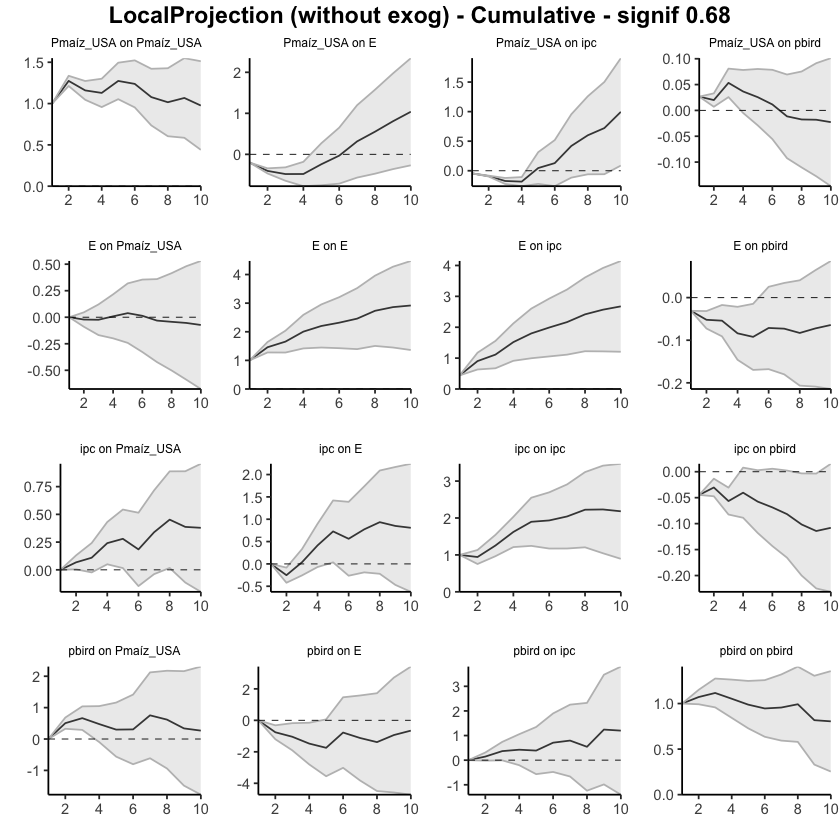

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Pmaíz_USA", "E", "ipc", "pbird"), fixed_lags = 5, horizons=10, signif = 0.68, cumulative=TRUE)

### Ptrigo_USA 1950 a 2023 - Todas endógenas - Selected orders: 1, 2 y 5

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
1,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Ptrigo_USA, E, ipc, pbird",4


LocalProjection (without exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.00000000,0.000000000,0.0000000
79,ipc,E,2,0.15370118,-0.004239627,0.3116420
80,ipc,E,3,0.52511784,0.259952130,0.7902835
81,ipc,E,4,0.39567946,0.114589237,0.6767697
82,ipc,E,5,0.43969817,0.236795319,0.6426010
83,ipc,E,6,0.17630500,0.022623409,0.3299866
84,ipc,E,7,0.33324428,0.203835664,0.4626529
85,ipc,E,8,0.16066348,0.005906296,0.3154207
86,ipc,E,9,0.09968308,-0.029636386,0.2290025


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.00000000,0.00000000,0.00000000
112,pbird,E,2,-0.47397706,-1.02641340,0.07845929
113,pbird,E,3,-0.15998320,-0.55572944,0.23576303
114,pbird,E,4,-0.24072547,-0.66618393,0.18473300
115,pbird,E,5,-0.14139786,-0.57948288,0.29668716
116,pbird,E,6,0.98731775,0.59402307,1.38061242
117,pbird,E,7,-0.21750715,-0.62008048,0.18506618
118,pbird,E,8,-0.06292064,-0.44327317,0.31743190
119,pbird,E,9,0.61585303,0.08120807,1.15049799


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Ptrigo_USA,E,1,-0.15155864,-0.151558635,-0.15155864
2,Ptrigo_USA,E,2,-0.14869633,-0.205268277,-0.09212438
3,Ptrigo_USA,E,3,-0.09639423,-0.172536686,-0.02025176
4,Ptrigo_USA,E,4,0.02424811,-0.139563684,0.18805990
5,Ptrigo_USA,E,5,0.14425146,-0.021119673,0.30962260
6,Ptrigo_USA,E,6,0.11610484,-0.005197166,0.23740684
7,Ptrigo_USA,E,7,0.41229562,0.227414611,0.59717663
8,Ptrigo_USA,E,8,0.20834173,0.048782664,0.36790080
9,Ptrigo_USA,E,9,0.13234647,-0.034192873,0.29888581


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.5138728,0.51387280,0.5138728
46,E,ipc,2,0.5257621,0.18640498,0.8651193
47,E,ipc,3,0.3303320,0.02209387,0.6385701
48,E,ipc,4,0.4172212,0.15409409,0.6803482
49,E,ipc,5,0.3058724,0.11427599,0.4974689
50,E,ipc,6,0.2398916,0.06824973,0.4115335
51,E,ipc,7,0.2218941,0.08044964,0.3633385
52,E,ipc,8,0.2310989,0.09206453,0.3701332
53,E,ipc,9,0.1628436,0.03815494,0.2875322


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.00000000,0.0000000
123,pbird,ipc,2,0.47128492,0.12789065,0.8146792
124,pbird,ipc,3,0.42414086,0.22100943,0.6272723
125,pbird,ipc,4,0.17117969,-0.06731477,0.4096742
126,pbird,ipc,5,0.13188254,-0.19965030,0.4634154
127,pbird,ipc,6,0.42967187,0.21530665,0.6440371
128,pbird,ipc,7,0.19779241,-0.04236271,0.4379475
129,pbird,ipc,8,0.01228485,-0.29367513,0.3182448
130,pbird,ipc,9,0.72771491,0.29316519,1.1622646


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Ptrigo_USA,ipc,1,-0.05320487,-0.05320487,-0.053204869
13,Ptrigo_USA,ipc,2,-0.02563638,-0.04613534,-0.005137418
14,Ptrigo_USA,ipc,3,-0.03947617,-0.05945258,-0.019499772
15,Ptrigo_USA,ipc,4,0.09325347,0.01303364,0.173473303
16,Ptrigo_USA,ipc,5,0.12627507,-0.02045052,0.273000669
17,Ptrigo_USA,ipc,6,0.04947123,-0.05674664,0.155689102
18,Ptrigo_USA,ipc,7,0.23364425,0.11231908,0.354969424
19,Ptrigo_USA,ipc,8,0.17653058,0.05906934,0.293991822
20,Ptrigo_USA,ipc,9,0.08484781,-0.05763212,0.227327747


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.0348792840,-0.0348792840,-0.034879284
57,E,pbird,2,-0.0189255880,-0.0393891970,0.001538021
58,E,pbird,3,-0.0033294257,-0.0303719572,0.023713106
59,E,pbird,4,-0.0199065338,-0.0438018594,0.003988792
60,E,pbird,5,0.0016867461,-0.0145486224,0.017922115
61,E,pbird,6,0.0189938068,0.0005623467,0.037425267
62,E,pbird,7,0.0013803004,-0.0133375488,0.016098150
63,E,pbird,8,0.0015838996,-0.0179731731,0.021140972
64,E,pbird,9,0.0136992968,0.0025081790,0.024890415


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.0451919731,-0.045191973,-0.0451919731
90,ipc,pbird,2,0.0161104292,0.001472575,0.0307482830
91,ipc,pbird,3,-0.0175744436,-0.037585042,0.0024361546
92,ipc,pbird,4,0.0270557280,0.011086264,0.0430251921
93,ipc,pbird,5,0.0082580111,-0.004339273,0.0208552949
94,ipc,pbird,6,-0.0131218782,-0.025616000,-0.0006277568
95,ipc,pbird,7,-0.0017479073,-0.013325459,0.0098296443
96,ipc,pbird,8,0.0029446880,-0.012627434,0.0185168104
97,ipc,pbird,9,-0.0036103086,-0.011738103,0.0045174862


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Ptrigo_USA,pbird,1,0.0005525309,0.0005525309,0.0005525309
24,Ptrigo_USA,pbird,2,0.0180982660,0.0067138083,0.0294827237
25,Ptrigo_USA,pbird,3,0.0046916418,-0.0055098551,0.0148931388
26,Ptrigo_USA,pbird,4,-0.0069978150,-0.0211329447,0.0071373146
27,Ptrigo_USA,pbird,5,-0.0109636798,-0.0248198393,0.0028924798
28,Ptrigo_USA,pbird,6,-0.0058071129,-0.0226538736,0.0110396479
29,Ptrigo_USA,pbird,7,-0.0428572388,-0.0548319081,-0.0308825695
30,Ptrigo_USA,pbird,8,-0.0144991673,-0.0232305509,-0.0057677837
31,Ptrigo_USA,pbird,9,0.0080159984,-0.0078071080,0.0238391047


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Ptrigo_USA,1,0.000000000,0.00000000,0.000000000
35,E,Ptrigo_USA,2,-0.012517720,-0.06822320,0.043187764
36,E,Ptrigo_USA,3,-0.003981898,-0.08672154,0.078757747
37,E,Ptrigo_USA,4,-0.027734562,-0.07273839,0.017269266
38,E,Ptrigo_USA,5,-0.054979819,-0.11441736,0.004457722
39,E,Ptrigo_USA,6,-0.082354006,-0.13106253,-0.033645485
40,E,Ptrigo_USA,7,-0.043863613,-0.10299342,0.015266193
41,E,Ptrigo_USA,8,-0.005165730,-0.07208403,0.061752573
42,E,Ptrigo_USA,9,0.017942809,-0.02336065,0.059246270


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Ptrigo_USA,1,0.000000000,0.000000000,0.000000000
68,ipc,Ptrigo_USA,2,-0.023483177,-0.065795716,0.018829362
69,ipc,Ptrigo_USA,3,-0.072218704,-0.134594622,-0.009842786
70,ipc,Ptrigo_USA,4,-0.003007058,-0.037089469,0.031075354
71,ipc,Ptrigo_USA,5,-0.027549899,-0.074855350,0.019755552
72,ipc,Ptrigo_USA,6,0.028718323,-0.004912181,0.062348827
73,ipc,Ptrigo_USA,7,0.073018500,0.033932462,0.112104538
74,ipc,Ptrigo_USA,8,0.058284946,0.006582559,0.109987332
75,ipc,Ptrigo_USA,9,-0.032808849,-0.071132372,0.005514674


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Ptrigo_USA,1,0.000000000,0.000000000,0.00000000
101,pbird,Ptrigo_USA,2,0.126182629,-0.034392389,0.28675765
102,pbird,Ptrigo_USA,3,-0.148237081,-0.308501501,0.01202734
103,pbird,Ptrigo_USA,4,-0.051334246,-0.282789171,0.18012068
104,pbird,Ptrigo_USA,5,0.283861086,0.054594754,0.51312742
105,pbird,Ptrigo_USA,6,0.173075252,-0.009470947,0.35562145
106,pbird,Ptrigo_USA,7,0.003220748,-0.222181535,0.22862303
107,pbird,Ptrigo_USA,8,-0.107835027,-0.322000929,0.10633087
108,pbird,Ptrigo_USA,9,-0.299922424,-0.537672432,-0.06217242


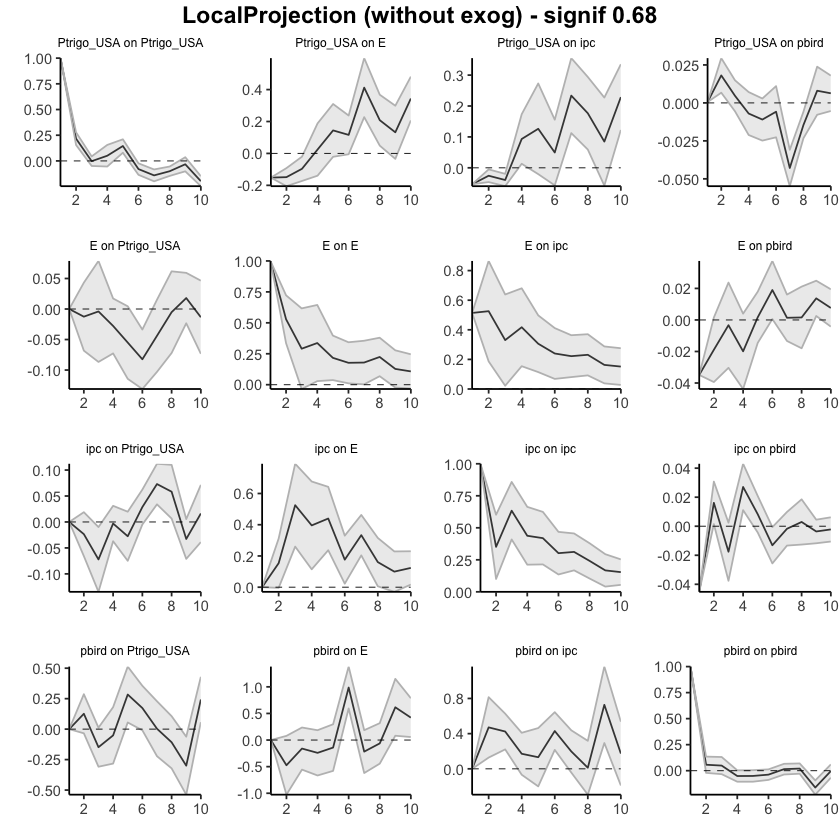

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Ptrigo_USA", "E", "ipc", "pbird"), fixed_lags = 1, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
1,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Ptrigo_USA, E, ipc, pbird",4


LocalProjection (without exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.0000000,0.000000000,0.000000
79,ipc,E,2,0.1537012,-0.004239627,0.311642
80,ipc,E,3,0.6788190,0.255712502,1.101926
81,ipc,E,4,1.0744985,0.370301740,1.778695
82,ipc,E,5,1.5141966,0.607097059,2.421296
83,ipc,E,6,1.6905016,0.629720468,2.751283
84,ipc,E,7,2.0237459,0.833556132,3.213936
85,ipc,E,8,2.1844094,0.839462427,3.529356
86,ipc,E,9,2.2840925,0.809826041,3.758359


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.00000000,0.000000,0.00000000
112,pbird,E,2,-0.47397706,-1.026413,0.07845929
113,pbird,E,3,-0.63396026,-1.582143,0.31422232
114,pbird,E,4,-0.87468573,-2.248327,0.49895532
115,pbird,E,5,-1.01608359,-2.827810,0.79564248
116,pbird,E,6,-0.02876584,-2.233787,2.17625490
117,pbird,E,7,-0.24627299,-2.853867,2.36132108
118,pbird,E,8,-0.30919363,-3.297140,2.67875298
119,pbird,E,9,0.30665940,-3.215932,3.82925097


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Ptrigo_USA,E,1,-0.1515586,-0.1515586,-0.15155864
2,Ptrigo_USA,E,2,-0.3002550,-0.3568269,-0.24368302
3,Ptrigo_USA,E,3,-0.3966492,-0.5293636,-0.26393478
4,Ptrigo_USA,E,4,-0.3724011,-0.6689273,-0.07587488
5,Ptrigo_USA,E,5,-0.2281496,-0.6900470,0.23374772
6,Ptrigo_USA,E,6,-0.1120448,-0.6952441,0.47115456
7,Ptrigo_USA,E,7,0.3002508,-0.4678295,1.06833118
8,Ptrigo_USA,E,8,0.5085926,-0.4190468,1.43623198
9,Ptrigo_USA,E,9,0.6409390,-0.4532397,1.73511779


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.5138728,0.5138728,0.5138728
46,E,ipc,2,1.0396349,0.7002778,1.3789921
47,E,ipc,3,1.3699669,0.7223716,2.0175622
48,E,ipc,4,1.7871881,0.8764657,2.6979104
49,E,ipc,5,2.0930605,0.9907417,3.1953793
50,E,ipc,6,2.3329521,1.0589915,3.6069128
51,E,ipc,7,2.5548462,1.1394411,3.9702513
52,E,ipc,8,2.7859451,1.2315056,4.3403845
53,E,ipc,9,2.9487886,1.2696606,4.6279167


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.0000000,0.00000000,0.0000000
123,pbird,ipc,2,0.4712849,0.12789065,0.8146792
124,pbird,ipc,3,0.8954258,0.34890008,1.4419515
125,pbird,ipc,4,1.0666055,0.28158531,1.8516256
126,pbird,ipc,5,1.1984880,0.08193502,2.3150410
127,pbird,ipc,6,1.6281599,0.29724167,2.9590781
128,pbird,ipc,7,1.8259523,0.25487896,3.3970256
129,pbird,ipc,8,1.8382372,-0.03879617,3.7152705
130,pbird,ipc,9,2.5659521,0.25436902,4.8775351


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Ptrigo_USA,ipc,1,-0.05320487,-0.05320487,-0.05320487
13,Ptrigo_USA,ipc,2,-0.07884125,-0.09934021,-0.05834229
14,Ptrigo_USA,ipc,3,-0.11831742,-0.15879278,-0.07784206
15,Ptrigo_USA,ipc,4,-0.02506395,-0.14575914,0.09563124
16,Ptrigo_USA,ipc,5,0.10121112,-0.16620966,0.36863191
17,Ptrigo_USA,ipc,6,0.15068235,-0.22295631,0.52432101
18,Ptrigo_USA,ipc,7,0.38432661,-0.11063722,0.87929044
19,Ptrigo_USA,ipc,8,0.56085719,-0.05156789,1.17328226
20,Ptrigo_USA,ipc,9,0.64570500,-0.10920001,1.40061001


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.03487928,-0.03487928,-0.034879284
57,E,pbird,2,-0.05380487,-0.07426848,-0.033341263
58,E,pbird,3,-0.05713430,-0.10464044,-0.009628157
59,E,pbird,4,-0.07704083,-0.14844230,-0.005639365
60,E,pbird,5,-0.07535409,-0.16299092,0.012282749
61,E,pbird,6,-0.05636028,-0.16242857,0.049708016
62,E,pbird,7,-0.05497998,-0.17576612,0.065806166
63,E,pbird,8,-0.05339608,-0.19373930,0.086947138
64,E,pbird,9,-0.03969678,-0.19123112,0.111837553


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.04519197,-0.04519197,-0.04519197
90,ipc,pbird,2,-0.02908154,-0.04371940,-0.01444369
91,ipc,pbird,3,-0.04665599,-0.08130444,-0.01200754
92,ipc,pbird,4,-0.01960026,-0.07021818,0.03101766
93,ipc,pbird,5,-0.01134225,-0.07455745,0.05187295
94,ipc,pbird,6,-0.02446413,-0.10017345,0.05124519
95,ipc,pbird,7,-0.02621203,-0.11349891,0.06107484
96,ipc,pbird,8,-0.02326735,-0.12612634,0.07959165
97,ipc,pbird,9,-0.02687765,-0.13786444,0.08410914


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Ptrigo_USA,pbird,1,0.0005525309,0.0005525309,0.0005525309
24,Ptrigo_USA,pbird,2,0.0186507969,0.0072663392,0.0300352546
25,Ptrigo_USA,pbird,3,0.0233424387,0.0017564841,0.0449283933
26,Ptrigo_USA,pbird,4,0.0163446237,-0.0193764606,0.0520657080
27,Ptrigo_USA,pbird,5,0.0053809439,-0.0441963000,0.0549581877
28,Ptrigo_USA,pbird,6,-0.0004261690,-0.0668501736,0.0659978356
29,Ptrigo_USA,pbird,7,-0.0432834078,-0.1216820817,0.0351152661
30,Ptrigo_USA,pbird,8,-0.0577825751,-0.1449126326,0.0293474824
31,Ptrigo_USA,pbird,9,-0.0497665767,-0.1527197406,0.0531865871


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Ptrigo_USA,1,0.00000000,0.0000000,0.00000000
35,E,Ptrigo_USA,2,-0.01251772,-0.0682232,0.04318776
36,E,Ptrigo_USA,3,-0.01649962,-0.1549447,0.12194551
37,E,Ptrigo_USA,4,-0.04423418,-0.2276831,0.13921478
38,E,Ptrigo_USA,5,-0.09921400,-0.3421005,0.14367250
39,E,Ptrigo_USA,6,-0.18156800,-0.4731630,0.11002701
40,E,Ptrigo_USA,7,-0.22543162,-0.5761564,0.12529321
41,E,Ptrigo_USA,8,-0.23059735,-0.6482405,0.18704578
42,E,Ptrigo_USA,9,-0.21265454,-0.6716011,0.24629205


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Ptrigo_USA,1,0.0000000000,0.00000000,0.000000000
68,ipc,Ptrigo_USA,2,-0.0234831769,-0.06579572,0.018829362
69,ipc,Ptrigo_USA,3,-0.0957018810,-0.20039034,0.008986576
70,ipc,Ptrigo_USA,4,-0.0987089386,-0.23747981,0.040061930
71,ipc,Ptrigo_USA,5,-0.1262588377,-0.31233516,0.059817482
72,ipc,Ptrigo_USA,6,-0.0975405147,-0.31724734,0.122166309
73,ipc,Ptrigo_USA,7,-0.0245220152,-0.28331488,0.234270846
74,ipc,Ptrigo_USA,8,0.0337629304,-0.27673232,0.344258178
75,ipc,Ptrigo_USA,9,0.0009540814,-0.34786469,0.349772852


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Ptrigo_USA,1,0.00000000,0.00000000,0.0000000
101,pbird,Ptrigo_USA,2,0.12618263,-0.03439239,0.2867576
102,pbird,Ptrigo_USA,3,-0.02205445,-0.34289389,0.2987850
103,pbird,Ptrigo_USA,4,-0.07338870,-0.62568306,0.4789057
104,pbird,Ptrigo_USA,5,0.21047239,-0.57108831,0.9920331
105,pbird,Ptrigo_USA,6,0.38354764,-0.58055925,1.3476545
106,pbird,Ptrigo_USA,7,0.38676839,-0.80274079,1.5762776
107,pbird,Ptrigo_USA,8,0.27893336,-1.12474172,1.6826084
108,pbird,Ptrigo_USA,9,-0.02098906,-1.66241415,1.6204360


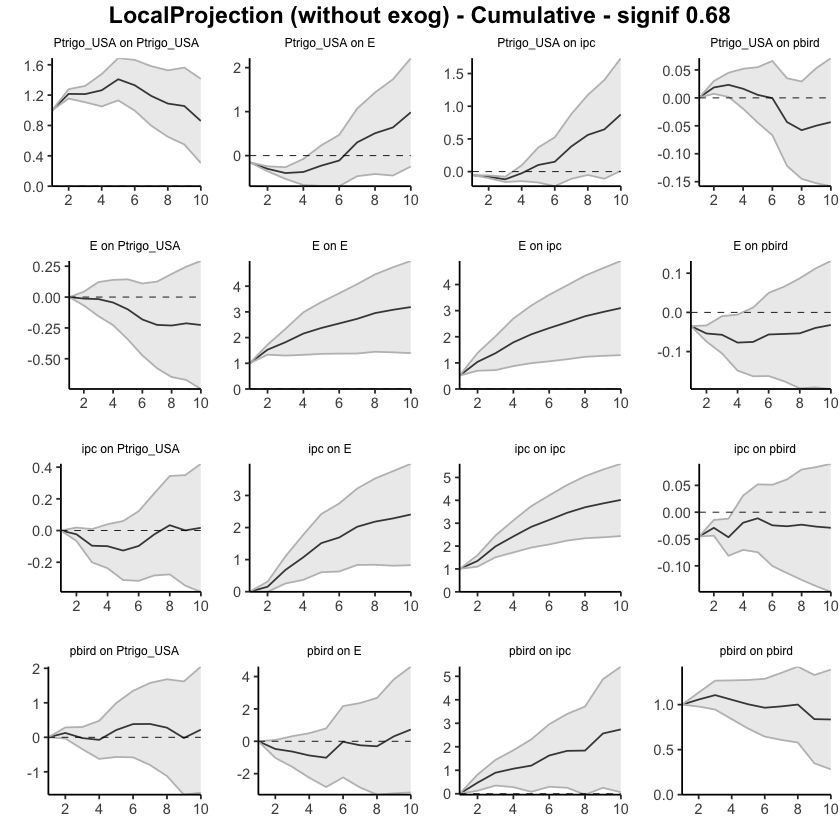

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Ptrigo_USA", "E", "ipc", "pbird"), fixed_lags = 1, horizons=10, signif = 0.68, cumulative=TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Ptrigo_USA, E, ipc, pbird",4


LocalProjection (without exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.00000000,0.0000000000,0.00000000
79,ipc,E,2,-0.16624230,-0.3858552500,0.05337066
80,ipc,E,3,0.26363612,0.0696652052,0.45760704
81,ipc,E,4,0.29415296,0.0009123112,0.58739362
82,ipc,E,5,0.43489567,0.2447815894,0.62500976
83,ipc,E,6,-0.07868107,-0.2186891508,0.06132700
84,ipc,E,7,0.18305987,0.0359581664,0.33016157
85,ipc,E,8,0.13718821,-0.0834482948,0.35782471
86,ipc,E,9,-0.02125515,-0.1461583455,0.10364804


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.00000000,0.00000000,0.00000000
112,pbird,E,2,-0.80509059,-1.25030714,-0.35987405
113,pbird,E,3,-0.36016518,-0.77775828,0.05742792
114,pbird,E,4,-0.43162769,-0.92216320,0.05890783
115,pbird,E,5,-0.22651717,-0.65855139,0.20551705
116,pbird,E,6,0.70707909,0.30314882,1.11100935
117,pbird,E,7,-0.35078452,-0.79070333,0.08913428
118,pbird,E,8,-0.15123523,-0.51161782,0.20914736
119,pbird,E,9,0.44662577,-0.05784582,0.95109737


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Ptrigo_USA,E,1,-0.09033252,-0.090332518,-0.09033252
2,Ptrigo_USA,E,2,-0.11071825,-0.189406925,-0.03202957
3,Ptrigo_USA,E,3,-0.06854748,-0.175723855,0.03862890
4,Ptrigo_USA,E,4,0.03123846,-0.140038217,0.20251514
5,Ptrigo_USA,E,5,0.14786599,-0.009522947,0.30525493
6,Ptrigo_USA,E,6,0.05522796,-0.067966205,0.17842212
7,Ptrigo_USA,E,7,0.41208612,0.235660591,0.58851166
8,Ptrigo_USA,E,8,0.19981886,0.058313237,0.34132447
9,Ptrigo_USA,E,9,0.07117650,-0.089120417,0.23147341


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4644329,0.46443287,0.4644329
46,E,ipc,2,0.4773781,0.11693284,0.8378234
47,E,ipc,3,0.2217536,-0.01539120,0.4588983
48,E,ipc,4,0.3850564,0.14262334,0.6274895
49,E,ipc,5,0.2872474,0.07513830,0.4993564
50,E,ipc,6,0.1983907,0.05026914,0.3465122
51,E,ipc,7,0.1693204,0.02582317,0.3128177
52,E,ipc,8,0.2265392,0.05518089,0.3978975
53,E,ipc,9,0.1417317,0.01407321,0.2693903


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.00000000,0.0000000
123,pbird,ipc,2,0.08492323,-0.09469165,0.2645381
124,pbird,ipc,3,0.12873311,-0.03772419,0.2951904
125,pbird,ipc,4,-0.03411420,-0.33733003,0.2691016
126,pbird,ipc,5,0.01561168,-0.28817445,0.3193978
127,pbird,ipc,6,0.20304620,-0.03490697,0.4409994
128,pbird,ipc,7,0.02837955,-0.24890823,0.3056673
129,pbird,ipc,8,-0.11284032,-0.42303991,0.1973593
130,pbird,ipc,9,0.61049617,0.22723018,0.9937622


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Ptrigo_USA,ipc,1,0.01701447,0.017014472,0.01701447
13,Ptrigo_USA,ipc,2,0.01863220,-0.024801163,0.06206556
14,Ptrigo_USA,ipc,3,-0.01458733,-0.062547656,0.03337299
15,Ptrigo_USA,ipc,4,0.11050093,0.027171512,0.19383034
16,Ptrigo_USA,ipc,5,0.15092910,-0.003733314,0.30559152
17,Ptrigo_USA,ipc,6,0.02493773,-0.073937036,0.12381250
18,Ptrigo_USA,ipc,7,0.23174562,0.117763632,0.34572761
19,Ptrigo_USA,ipc,8,0.17896144,0.058363725,0.29955915
20,Ptrigo_USA,ipc,9,0.05377245,-0.080714829,0.18825973


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.0344189215,-0.0344189215,-0.034418921
57,E,pbird,2,-0.0182099148,-0.0456739716,0.009254142
58,E,pbird,3,0.0022564896,-0.0167994417,0.021312421
59,E,pbird,4,-0.0263742034,-0.0490477633,-0.003700643
60,E,pbird,5,-0.0080645775,-0.0238732457,0.007744091
61,E,pbird,6,0.0216815937,0.0041823636,0.039180824
62,E,pbird,7,0.0006262710,-0.0126770701,0.013929612
63,E,pbird,8,-0.0060648640,-0.0233866496,0.011256922
64,E,pbird,9,0.0116844810,0.0008935738,0.022475388


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.050809122,-0.0508091221,-0.050809122
90,ipc,pbird,2,0.026961367,0.0014624387,0.052460296
91,ipc,pbird,3,-0.007370369,-0.0218134504,0.007072713
92,ipc,pbird,4,0.017084496,0.0006905807,0.033478411
93,ipc,pbird,5,-0.013097864,-0.0242486435,-0.001947084
94,ipc,pbird,6,-0.004443785,-0.0161085646,0.007220995
95,ipc,pbird,7,-0.007618647,-0.0187091686,0.003471874
96,ipc,pbird,8,-0.002634728,-0.0177123444,0.012442888
97,ipc,pbird,9,-0.014103523,-0.0221261684,-0.006080877


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Ptrigo_USA,pbird,1,-0.0012061117,-0.001206112,-0.001206112
24,Ptrigo_USA,pbird,2,0.0172739724,0.003643911,0.030904033
25,Ptrigo_USA,pbird,3,0.0070689352,-0.005819725,0.019957596
26,Ptrigo_USA,pbird,4,-0.0040877678,-0.019872167,0.011696631
27,Ptrigo_USA,pbird,5,-0.0100002447,-0.024832940,0.004832450
28,Ptrigo_USA,pbird,6,0.0033606885,-0.014105476,0.020826853
29,Ptrigo_USA,pbird,7,-0.0418521027,-0.055136200,-0.028568005
30,Ptrigo_USA,pbird,8,-0.0149766154,-0.025180412,-0.004772819
31,Ptrigo_USA,pbird,9,0.0070807096,-0.010140520,0.024301939


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Ptrigo_USA,1,0.000000000,0.00000000,0.000000000
35,E,Ptrigo_USA,2,-0.012998451,-0.05755986,0.031562960
36,E,Ptrigo_USA,3,0.002757622,-0.08284586,0.088361108
37,E,Ptrigo_USA,4,0.007977364,-0.03920153,0.055156259
38,E,Ptrigo_USA,5,-0.030915296,-0.07843362,0.016603030
39,E,Ptrigo_USA,6,-0.091622612,-0.15699512,-0.026250103
40,E,Ptrigo_USA,7,-0.054493088,-0.11448411,0.005497934
41,E,Ptrigo_USA,8,-0.007334555,-0.07018164,0.055512532
42,E,Ptrigo_USA,9,0.018086506,-0.01994661,0.056119618


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Ptrigo_USA,1,0.000000e+00,0.0000000000,0.000000000
68,ipc,Ptrigo_USA,2,2.913098e-02,-0.0084937792,0.066755743
69,ipc,Ptrigo_USA,3,-8.018198e-02,-0.1578483890,-0.002515568
70,ipc,Ptrigo_USA,4,7.267945e-02,0.0386774016,0.106681503
71,ipc,Ptrigo_USA,5,3.806248e-02,-0.0005847674,0.076709721
72,ipc,Ptrigo_USA,6,8.910369e-05,-0.0704307312,0.070608939
73,ipc,Ptrigo_USA,7,5.954549e-02,0.0132631254,0.105827856
74,ipc,Ptrigo_USA,8,1.203909e-01,0.0714267068,0.169355170
75,ipc,Ptrigo_USA,9,-6.063978e-02,-0.0940023481,-0.027277222


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Ptrigo_USA,1,0.000000000,0.00000000,0.000000000
101,pbird,Ptrigo_USA,2,0.190591628,0.03023787,0.350945381
102,pbird,Ptrigo_USA,3,-0.173681242,-0.31972817,-0.027634319
103,pbird,Ptrigo_USA,4,-0.023873564,-0.24521035,0.197463219
104,pbird,Ptrigo_USA,5,0.320841046,0.08901962,0.552662476
105,pbird,Ptrigo_USA,6,0.148750259,-0.01718439,0.314684911
106,pbird,Ptrigo_USA,7,0.006563993,-0.21515552,0.228283507
107,pbird,Ptrigo_USA,8,-0.032441698,-0.23897906,0.174095665
108,pbird,Ptrigo_USA,9,-0.326951841,-0.57079315,-0.083110529


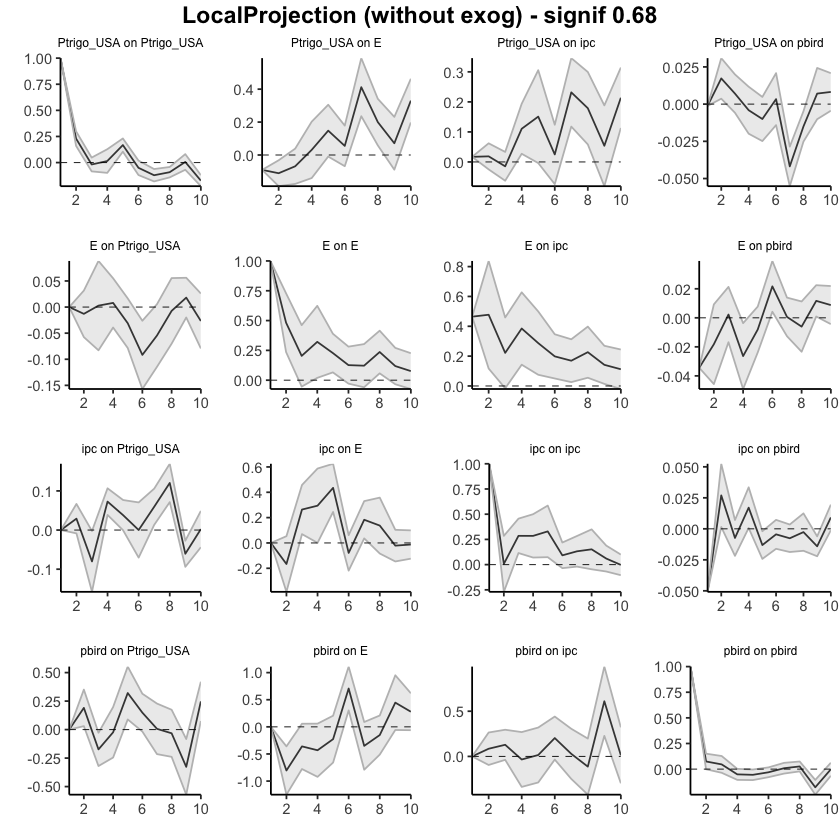

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Ptrigo_USA", "E", "ipc", "pbird"), fixed_lags = 2, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Ptrigo_USA, E, ipc, pbird",4


LocalProjection (without exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.00000000,0.00000000,0.00000000
79,ipc,E,2,-0.16624230,-0.38585525,0.05337066
80,ipc,E,3,0.09739383,-0.31619004,0.51097770
81,ipc,E,4,0.39154679,-0.31527773,1.09837132
82,ipc,E,5,0.82644247,-0.07049614,1.72338108
83,ipc,E,6,0.74776139,-0.28918529,1.78470808
84,ipc,E,7,0.93082126,-0.25322713,2.11486965
85,ipc,E,8,1.06800946,-0.33667542,2.47269435
86,ipc,E,9,1.04675431,-0.48283377,2.57634240


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.0000000,0.000000,0.00000000
112,pbird,E,2,-0.8050906,-1.250307,-0.35987405
113,pbird,E,3,-1.1652558,-2.028065,-0.30244613
114,pbird,E,4,-1.5968835,-2.950229,-0.24353830
115,pbird,E,5,-1.8234006,-3.608780,-0.03802125
116,pbird,E,6,-1.1163215,-3.305631,1.07298811
117,pbird,E,7,-1.4671061,-4.096335,1.16212239
118,pbird,E,8,-1.6183413,-4.607952,1.37126975
119,pbird,E,9,-1.1717155,-4.665798,2.32236712


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Ptrigo_USA,E,1,-0.09033252,-0.09033252,-0.09033252
2,Ptrigo_USA,E,2,-0.20105077,-0.27973944,-0.12236209
3,Ptrigo_USA,E,3,-0.26959824,-0.45546330,-0.08373319
4,Ptrigo_USA,E,4,-0.23835978,-0.59550152,0.11878196
5,Ptrigo_USA,E,5,-0.09049379,-0.60502446,0.42403689
6,Ptrigo_USA,E,6,-0.03526583,-0.67299067,0.60245901
7,Ptrigo_USA,E,7,0.37682030,-0.43733008,1.19097067
8,Ptrigo_USA,E,8,0.57663915,-0.37901684,1.53229515
9,Ptrigo_USA,E,9,0.64781565,-0.46813726,1.76376855


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4644329,0.4644329,0.4644329
46,E,ipc,2,0.9418110,0.5813657,1.3022563
47,E,ipc,3,1.1635646,0.5659745,1.7611546
48,E,ipc,4,1.5486210,0.7085979,2.3886442
49,E,ipc,5,1.8358684,0.7837362,2.8880006
50,E,ipc,6,2.0342590,0.8340053,3.2345128
51,E,ipc,7,2.2035795,0.8598285,3.5473305
52,E,ipc,8,2.4301187,0.9150094,3.9452280
53,E,ipc,9,2.5718504,0.9290826,4.2146182


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.00000000,0.0000000
123,pbird,ipc,2,0.08492323,-0.09469165,0.2645381
124,pbird,ipc,3,0.21365634,-0.13241584,0.5597285
125,pbird,ipc,4,0.17954215,-0.46974587,0.8288302
126,pbird,ipc,5,0.19515383,-0.75792032,1.1482280
127,pbird,ipc,6,0.39820003,-0.79282729,1.5892273
128,pbird,ipc,7,0.42657958,-1.04173552,1.8948947
129,pbird,ipc,8,0.31373926,-1.46477542,2.0922539
130,pbird,ipc,9,0.92423543,-1.23754524,3.0860161


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Ptrigo_USA,ipc,1,0.01701447,0.017014472,0.01701447
13,Ptrigo_USA,ipc,2,0.03564667,-0.007786691,0.07908003
14,Ptrigo_USA,ipc,3,0.02105934,-0.070334347,0.11245302
15,Ptrigo_USA,ipc,4,0.13156026,-0.043162835,0.30628337
16,Ptrigo_USA,ipc,5,0.28248937,-0.046896149,0.61187489
17,Ptrigo_USA,ipc,6,0.30742710,-0.120833184,0.73568738
18,Ptrigo_USA,ipc,7,0.53917272,-0.003069553,1.08141499
19,Ptrigo_USA,ipc,8,0.71813416,0.055294172,1.38097414
20,Ptrigo_USA,ipc,9,0.77190661,-0.025420657,1.56923387


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.03441892,-0.03441892,-0.0344189215
57,E,pbird,2,-0.05262884,-0.08009289,-0.0251647796
58,E,pbird,3,-0.05037235,-0.09689233,-0.0038523588
59,E,pbird,4,-0.07674655,-0.14594010,-0.0075530022
60,E,pbird,5,-0.08481113,-0.16981334,0.0001910885
61,E,pbird,6,-0.06312953,-0.16563098,0.0393719122
62,E,pbird,7,-0.06250326,-0.17830805,0.0533015242
63,E,pbird,8,-0.06856813,-0.20169470,0.0645584459
64,E,pbird,9,-0.05688365,-0.20080113,0.0870338340


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.05080912,-0.05080912,-0.050809122
90,ipc,pbird,2,-0.02384775,-0.04934668,0.001651174
91,ipc,pbird,3,-0.03121812,-0.07116013,0.008723887
92,ipc,pbird,4,-0.01413363,-0.07046955,0.042202298
93,ipc,pbird,5,-0.02723149,-0.09471820,0.040255214
94,ipc,pbird,6,-0.03167528,-0.11082676,0.047476209
95,ipc,pbird,7,-0.03929392,-0.12953593,0.050948083
96,ipc,pbird,8,-0.04192865,-0.14724827,0.063390972
97,ipc,pbird,9,-0.05603217,-0.16937444,0.057310095


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Ptrigo_USA,pbird,1,-0.001206112,-0.001206112,-0.001206112
24,Ptrigo_USA,pbird,2,0.016067861,0.002437800,0.029697922
25,Ptrigo_USA,pbird,3,0.023136796,-0.003381925,0.049655517
26,Ptrigo_USA,pbird,4,0.019049028,-0.023254092,0.061352148
27,Ptrigo_USA,pbird,5,0.009048783,-0.048087032,0.066184598
28,Ptrigo_USA,pbird,6,0.012409472,-0.062192508,0.087011452
29,Ptrigo_USA,pbird,7,-0.029442631,-0.117328708,0.058443447
30,Ptrigo_USA,pbird,8,-0.044419246,-0.142509120,0.053670628
31,Ptrigo_USA,pbird,9,-0.037338537,-0.152649640,0.077972567


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Ptrigo_USA,1,0.000000000,0.00000000,0.00000000
35,E,Ptrigo_USA,2,-0.012998451,-0.05755986,0.03156296
36,E,Ptrigo_USA,3,-0.010240830,-0.14040573,0.11992407
37,E,Ptrigo_USA,4,-0.002263465,-0.17960726,0.17508033
38,E,Ptrigo_USA,5,-0.033178762,-0.25804088,0.19168336
39,E,Ptrigo_USA,6,-0.124801374,-0.41503600,0.16543325
40,E,Ptrigo_USA,7,-0.179294461,-0.52952011,0.17093119
41,E,Ptrigo_USA,8,-0.186629017,-0.59970175,0.22644372
42,E,Ptrigo_USA,9,-0.168542511,-0.61964836,0.28256334


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Ptrigo_USA,1,0.00000000,0.000000000,0.00000000
68,ipc,Ptrigo_USA,2,0.02913098,-0.008493779,0.06675574
69,ipc,Ptrigo_USA,3,-0.05105100,-0.166342168,0.06424018
70,ipc,Ptrigo_USA,4,0.02162846,-0.127664767,0.17092168
71,ipc,Ptrigo_USA,5,0.05969093,-0.128249534,0.24763140
72,ipc,Ptrigo_USA,6,0.05978004,-0.198680265,0.31824034
73,ipc,Ptrigo_USA,7,0.11932553,-0.185417140,0.42406819
74,ipc,Ptrigo_USA,8,0.23971647,-0.113990433,0.59342336
75,ipc,Ptrigo_USA,9,0.17907668,-0.207992781,0.56614614


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Ptrigo_USA,1,0.000000000,0.00000000,0.0000000
101,pbird,Ptrigo_USA,2,0.190591628,0.03023787,0.3509454
102,pbird,Ptrigo_USA,3,0.016910386,-0.28949029,0.3233111
103,pbird,Ptrigo_USA,4,-0.006963179,-0.53470064,0.5207743
104,pbird,Ptrigo_USA,5,0.313877867,-0.44568102,1.0734368
105,pbird,Ptrigo_USA,6,0.462628126,-0.46286542,1.3881217
106,pbird,Ptrigo_USA,7,0.469192119,-0.67802094,1.6164052
107,pbird,Ptrigo_USA,8,0.436750421,-0.91700000,1.7905008
108,pbird,Ptrigo_USA,9,0.109798580,-1.48779315,1.7073903


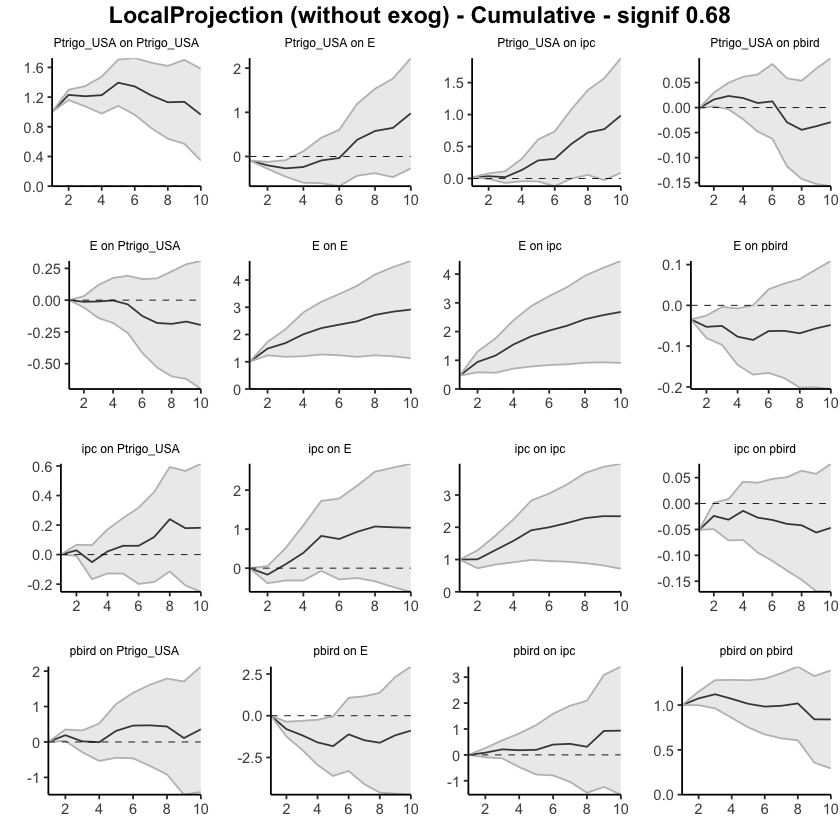

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Ptrigo_USA", "E", "ipc", "pbird"), fixed_lags = 2, horizons=10, signif = 0.68, cumulative=TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Ptrigo_USA, E, ipc, pbird",4


LocalProjection (without exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.000000000,0.000000000,0.000000000
79,ipc,E,2,-0.243145708,-0.418053594,-0.068237822
80,ipc,E,3,0.296179683,0.172048929,0.420310437
81,ipc,E,4,0.351899493,0.167193808,0.536605179
82,ipc,E,5,0.341406473,0.122450617,0.560362329
83,ipc,E,6,-0.158816995,-0.310227145,-0.007406846
84,ipc,E,7,0.145432452,-0.006042323,0.296907227
85,ipc,E,8,0.099731242,-0.093178981,0.292641465
86,ipc,E,9,-0.103548785,-0.262153015,0.055055445


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.00000000,0.00000000,0.00000000
112,pbird,E,2,-0.79741724,-1.22577496,-0.36905953
113,pbird,E,3,-0.23798580,-0.66845315,0.19248155
114,pbird,E,4,-0.46421800,-0.94445102,0.01601503
115,pbird,E,5,-0.16919373,-0.59880102,0.26041356
116,pbird,E,6,0.86330791,0.43880247,1.28781335
117,pbird,E,7,-0.31339281,-0.75683321,0.13004760
118,pbird,E,8,-0.17640186,-0.57469653,0.22189281
119,pbird,E,9,0.45592442,-0.08477525,0.99662409


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Ptrigo_USA,E,1,-0.16305593,-0.16305593,-0.16305593
2,Ptrigo_USA,E,2,-0.22076772,-0.27183371,-0.16970173
3,Ptrigo_USA,E,3,-0.09923354,-0.16003918,-0.03842791
4,Ptrigo_USA,E,4,-0.01623541,-0.19806469,0.16559388
5,Ptrigo_USA,E,5,0.11189322,-0.03394115,0.25772759
6,Ptrigo_USA,E,6,0.01115341,-0.10340881,0.12571563
7,Ptrigo_USA,E,7,0.41277515,0.26856732,0.55698299
8,Ptrigo_USA,E,8,0.23934870,0.11978732,0.35891008
9,Ptrigo_USA,E,9,0.11264685,-0.04896074,0.27425443


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.44244317,0.442443168,0.4424432
46,E,ipc,2,0.47010283,0.172948686,0.7672570
47,E,ipc,3,0.21983369,0.052730875,0.3869365
48,E,ipc,4,0.40851159,0.230445316,0.5865779
49,E,ipc,5,0.27865063,0.086417311,0.4708839
50,E,ipc,6,0.19386524,0.065310131,0.3224203
51,E,ipc,7,0.16900764,0.037982545,0.3000327
52,E,ipc,8,0.23412914,0.088501160,0.3797571
53,E,ipc,9,0.13910457,-0.002615814,0.2808249


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.00000000,0.00000000,0.0000000
123,pbird,ipc,2,0.10917529,-0.06057186,0.2789224
124,pbird,ipc,3,0.24670342,0.05308638,0.4403205
125,pbird,ipc,4,-0.02133452,-0.33133386,0.2886648
126,pbird,ipc,5,0.07043372,-0.22910689,0.3699743
127,pbird,ipc,6,0.27785663,0.03564299,0.5200703
128,pbird,ipc,7,0.05283611,-0.20646324,0.3121355
129,pbird,ipc,8,-0.13067010,-0.42142817,0.1600880
130,pbird,ipc,9,0.65842430,0.18872353,1.1281251


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Ptrigo_USA,ipc,1,-0.041003000,-0.04100300,-0.04100300
13,Ptrigo_USA,ipc,2,-0.041118106,-0.05453403,-0.02770219
14,Ptrigo_USA,ipc,3,-0.048622305,-0.08096837,-0.01627624
15,Ptrigo_USA,ipc,4,0.071821734,-0.02257377,0.16621724
16,Ptrigo_USA,ipc,5,0.115127509,-0.03237952,0.26263454
17,Ptrigo_USA,ipc,6,-0.009270505,-0.11014816,0.09160715
18,Ptrigo_USA,ipc,7,0.242545864,0.12866557,0.35642616
19,Ptrigo_USA,ipc,8,0.181300242,0.07358751,0.28901297
20,Ptrigo_USA,ipc,9,0.089664218,-0.01557802,0.19490645


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.031065009,-0.031065009,-0.0310650089
57,E,pbird,2,-0.020790131,-0.041076461,-0.0005038013
58,E,pbird,3,-0.002303091,-0.017738648,0.0131324669
59,E,pbird,4,-0.028882080,-0.052422888,-0.0053412714
60,E,pbird,5,-0.008076256,-0.024227768,0.0080752563
61,E,pbird,6,0.019948537,0.002063788,0.0378332862
62,E,pbird,7,-0.001367100,-0.012804238,0.0100700370
63,E,pbird,8,-0.007897670,-0.023751284,0.0079559435
64,E,pbird,9,0.011654942,-0.002083433,0.0253933168


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.048282469,-0.048282469,-4.828247e-02
90,ipc,pbird,2,0.015223656,-0.002004138,3.245145e-02
91,ipc,pbird,3,-0.025756558,-0.034065878,-1.744724e-02
92,ipc,pbird,4,0.019921264,-0.001044215,4.088674e-02
93,ipc,pbird,5,-0.018210866,-0.031168684,-5.253049e-03
94,ipc,pbird,6,-0.013078956,-0.026162762,4.850586e-06
95,ipc,pbird,7,-0.009970900,-0.020532942,5.911420e-04
96,ipc,pbird,8,-0.013870823,-0.028240207,4.985618e-04
97,ipc,pbird,9,-0.013262315,-0.026045010,-4.796210e-04


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Ptrigo_USA,pbird,1,0.0119756948,0.0119756948,0.011975695
24,Ptrigo_USA,pbird,2,0.0305998910,0.0177889570,0.043410825
25,Ptrigo_USA,pbird,3,0.0124917425,0.0007019871,0.024281498
26,Ptrigo_USA,pbird,4,-0.0005017367,-0.0149096013,0.013906128
27,Ptrigo_USA,pbird,5,-0.0045090969,-0.0185038719,0.009485678
28,Ptrigo_USA,pbird,6,0.0058884788,-0.0099797927,0.021756750
29,Ptrigo_USA,pbird,7,-0.0479058835,-0.0598050415,-0.036006725
30,Ptrigo_USA,pbird,8,-0.0143197142,-0.0238149225,-0.004824506
31,Ptrigo_USA,pbird,9,-0.0029879631,-0.0202075688,0.014231643


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Ptrigo_USA,1,0.00000000,0.00000000,0.000000000
35,E,Ptrigo_USA,2,-0.01119372,-0.05867655,0.036289110
36,E,Ptrigo_USA,3,0.02314399,-0.05713177,0.103419743
37,E,Ptrigo_USA,4,0.01615805,-0.04631679,0.078632886
38,E,Ptrigo_USA,5,-0.04863367,-0.10392996,0.006662612
39,E,Ptrigo_USA,6,-0.10220135,-0.16016208,-0.044240622
40,E,Ptrigo_USA,7,-0.03740878,-0.11123664,0.036419075
41,E,Ptrigo_USA,8,-0.01173547,-0.06628411,0.042813165
42,E,Ptrigo_USA,9,0.01236324,-0.03490772,0.059634190


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Ptrigo_USA,1,0.000000000,0.000000000,0.00000000
68,ipc,Ptrigo_USA,2,0.041446952,-0.003858375,0.08675228
69,ipc,Ptrigo_USA,3,-0.002259683,-0.076482130,0.07196276
70,ipc,Ptrigo_USA,4,0.118305313,0.056303482,0.18030714
71,ipc,Ptrigo_USA,5,-0.009992374,-0.063022173,0.04303743
72,ipc,Ptrigo_USA,6,-0.031930305,-0.086889062,0.02302845
73,ipc,Ptrigo_USA,7,0.162651438,0.096860655,0.22844222
74,ipc,Ptrigo_USA,8,0.110288821,0.072710175,0.14786747
75,ipc,Ptrigo_USA,9,-0.072212203,-0.122271197,-0.02215321


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Ptrigo_USA,1,0.000000000,0.000000000,0.00000000
101,pbird,Ptrigo_USA,2,0.232350740,0.077651531,0.38704995
102,pbird,Ptrigo_USA,3,-0.237138023,-0.381184499,-0.09309155
103,pbird,Ptrigo_USA,4,-0.144493048,-0.358065091,0.06907899
104,pbird,Ptrigo_USA,5,0.228487337,0.009464169,0.44751051
105,pbird,Ptrigo_USA,6,0.180059168,0.009445927,0.35067241
106,pbird,Ptrigo_USA,7,0.002082695,-0.215045787,0.21921118
107,pbird,Ptrigo_USA,8,-0.065426402,-0.264467489,0.13361468
108,pbird,Ptrigo_USA,9,-0.310087035,-0.547823961,-0.07235011


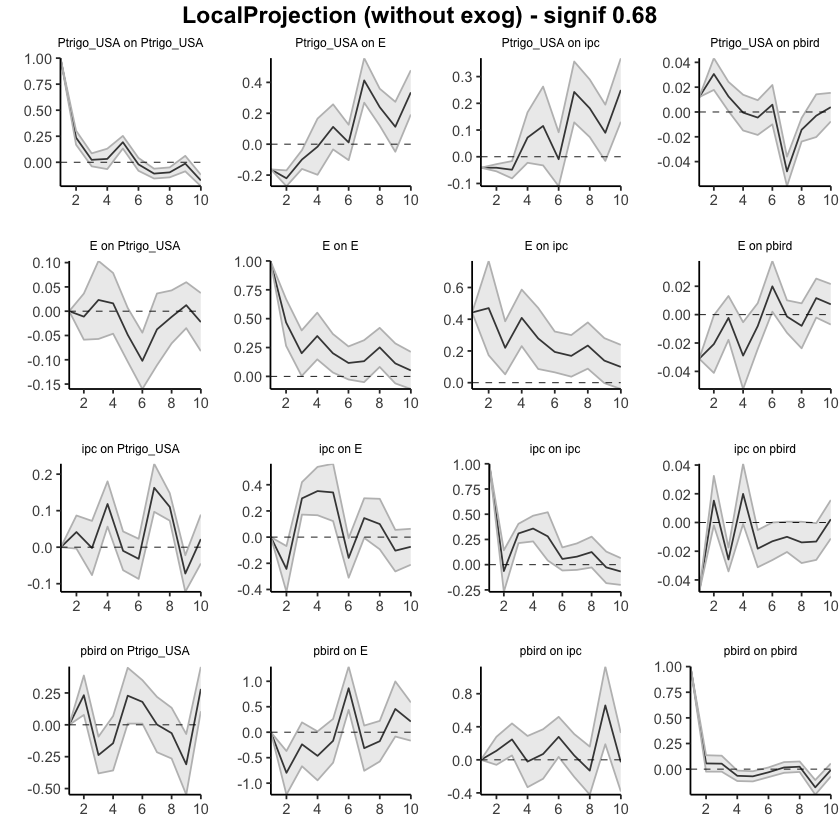

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Ptrigo_USA", "E", "ipc", "pbird"), fixed_lags = 5, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,NA,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"Ptrigo_USA, E, ipc, pbird",4


LocalProjection (without exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
78,ipc,E,1,0.00000000,0.00000000,0.00000000
79,ipc,E,2,-0.24314571,-0.41805359,-0.06823782
80,ipc,E,3,0.05303397,-0.24600467,0.35207261
81,ipc,E,4,0.40493347,-0.07881086,0.88867779
82,ipc,E,5,0.74633994,0.04363976,1.44904012
83,ipc,E,6,0.58752295,-0.26658739,1.44163328
84,ipc,E,7,0.73295540,-0.27262971,1.73854050
85,ipc,E,8,0.83268664,-0.36580869,2.03118197
86,ipc,E,9,0.72913786,-0.62796170,2.08623742


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
111,pbird,E,1,0.0000000,0.000000,0.0000000
112,pbird,E,2,-0.7974172,-1.225775,-0.3690595
113,pbird,E,3,-1.0354030,-1.894228,-0.1765780
114,pbird,E,4,-1.4996210,-2.838679,-0.1605630
115,pbird,E,5,-1.6688148,-3.437480,0.0998506
116,pbird,E,6,-0.8055069,-2.998678,1.3876639
117,pbird,E,7,-1.1188997,-3.755511,1.5177115
118,pbird,E,8,-1.2953015,-4.330207,1.7396044
119,pbird,E,9,-0.8393771,-4.414983,2.7362284


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,Ptrigo_USA,E,1,-0.16305593,-0.1630559,-0.1630559
2,Ptrigo_USA,E,2,-0.38382365,-0.4348896,-0.3327577
3,Ptrigo_USA,E,3,-0.48305719,-0.5949288,-0.3711856
4,Ptrigo_USA,E,4,-0.49929260,-0.7929935,-0.2055917
5,Ptrigo_USA,E,5,-0.38739938,-0.8269347,0.0521359
6,Ptrigo_USA,E,6,-0.37624597,-0.9303435,0.1778515
7,Ptrigo_USA,E,7,0.03652918,-0.6617762,0.7348345
8,Ptrigo_USA,E,8,0.27587788,-0.5419888,1.0937446
9,Ptrigo_USA,E,9,0.38852473,-0.5909496,1.3679990


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,E,ipc,1,0.4424432,0.4424432,0.4424432
46,E,ipc,2,0.9125460,0.6153919,1.2097001
47,E,ipc,3,1.1323797,0.6681227,1.5966366
48,E,ipc,4,1.5408913,0.8985680,2.1832145
49,E,ipc,5,1.8195419,0.9849854,2.6540984
50,E,ipc,6,2.0134071,1.0502955,2.9765188
51,E,ipc,7,2.1824148,1.0882780,3.2765515
52,E,ipc,8,2.4165439,1.1767792,3.6563086
53,E,ipc,9,2.5556485,1.1741634,3.9371336


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
122,pbird,ipc,1,0.0000000,0.000000000,0.0000000
123,pbird,ipc,2,0.1091753,-0.060571860,0.2789224
124,pbird,ipc,3,0.3558787,-0.007485478,0.7192429
125,pbird,ipc,4,0.3345442,-0.338819336,1.0079077
126,pbird,ipc,5,0.4049779,-0.567926230,1.3778821
127,pbird,ipc,6,0.6828346,-0.532283245,1.8979524
128,pbird,ipc,7,0.7356707,-0.738746484,2.2100878
129,pbird,ipc,8,0.6050006,-1.160174652,2.3701758
130,pbird,ipc,9,1.2634249,-0.971451118,3.4983008


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,Ptrigo_USA,ipc,1,-0.04100300,-0.04100300,-0.04100300
13,Ptrigo_USA,ipc,2,-0.08212111,-0.09553703,-0.06870519
14,Ptrigo_USA,ipc,3,-0.13074341,-0.17650540,-0.08498143
15,Ptrigo_USA,ipc,4,-0.05892168,-0.19907917,0.08123581
16,Ptrigo_USA,ipc,5,0.05620583,-0.23145868,0.34387035
17,Ptrigo_USA,ipc,6,0.04693533,-0.34160685,0.43547750
18,Ptrigo_USA,ipc,7,0.28948119,-0.21294128,0.79190366
19,Ptrigo_USA,ipc,8,0.47078143,-0.13935377,1.08091664
20,Ptrigo_USA,ipc,9,0.56044565,-0.15493179,1.27582309


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,E,pbird,1,-0.03106501,-0.03106501,-0.03106501
57,E,pbird,2,-0.05185514,-0.07214147,-0.03156881
58,E,pbird,3,-0.05415823,-0.08988012,-0.01843634
59,E,pbird,4,-0.08304031,-0.14230301,-0.02377761
60,E,pbird,5,-0.09111657,-0.16653077,-0.01570236
61,E,pbird,6,-0.07116803,-0.16446699,0.02213093
62,E,pbird,7,-0.07253513,-0.17727122,0.03220096
63,E,pbird,8,-0.08043280,-0.20102251,0.04015691
64,E,pbird,9,-0.06877786,-0.20310594,0.06555022


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
89,ipc,pbird,1,-0.04828247,-0.04828247,-0.048282469
90,ipc,pbird,2,-0.03305881,-0.05028661,-0.015831019
91,ipc,pbird,3,-0.05881537,-0.08435248,-0.033278257
92,ipc,pbird,4,-0.03889411,-0.08539670,0.007608486
93,ipc,pbird,5,-0.05710497,-0.11656538,0.002355436
94,ipc,pbird,6,-0.07018393,-0.14272815,0.002360287
95,ipc,pbird,7,-0.08015483,-0.16326109,0.002951429
96,ipc,pbird,8,-0.09402565,-0.19150129,0.003449991
97,ipc,pbird,9,-0.10728797,-0.21754630,0.002970370


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,Ptrigo_USA,pbird,1,0.011975695,0.011975695,0.01197569
24,Ptrigo_USA,pbird,2,0.042575586,0.029764652,0.05538652
25,Ptrigo_USA,pbird,3,0.055067328,0.030466639,0.07966802
26,Ptrigo_USA,pbird,4,0.054565592,0.015557038,0.09357415
27,Ptrigo_USA,pbird,5,0.050056495,-0.002946834,0.10305982
28,Ptrigo_USA,pbird,6,0.055944974,-0.012926627,0.12481657
29,Ptrigo_USA,pbird,7,0.008039090,-0.072731668,0.08880985
30,Ptrigo_USA,pbird,8,-0.006280624,-0.096546591,0.08398534
31,Ptrigo_USA,pbird,9,-0.009268587,-0.116754160,0.09821699


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,E,Ptrigo_USA,1,0.00000000,0.00000000,0.00000000
35,E,Ptrigo_USA,2,-0.01119372,-0.05867655,0.03628911
36,E,Ptrigo_USA,3,0.01195027,-0.11580832,0.13970885
37,E,Ptrigo_USA,4,0.02810832,-0.16212511,0.21834174
38,E,Ptrigo_USA,5,-0.02052536,-0.26605506,0.22500435
39,E,Ptrigo_USA,6,-0.12272670,-0.42621714,0.18076373
40,E,Ptrigo_USA,7,-0.16013549,-0.53745378,0.21718280
41,E,Ptrigo_USA,8,-0.17187096,-0.60373788,0.25999597
42,E,Ptrigo_USA,9,-0.15950772,-0.63864560,0.31963016


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
67,ipc,Ptrigo_USA,1,0.00000000,0.000000000,0.00000000
68,ipc,Ptrigo_USA,2,0.04144695,-0.003858375,0.08675228
69,ipc,Ptrigo_USA,3,0.03918727,-0.080340505,0.15871504
70,ipc,Ptrigo_USA,4,0.15749258,-0.024037023,0.33902219
71,ipc,Ptrigo_USA,5,0.14750021,-0.087059196,0.38205961
72,ipc,Ptrigo_USA,6,0.11556990,-0.173948258,0.40508806
73,ipc,Ptrigo_USA,7,0.27822134,-0.077087603,0.63353029
74,ipc,Ptrigo_USA,8,0.38851016,-0.004377428,0.78139775
75,ipc,Ptrigo_USA,9,0.31629796,-0.126648625,0.75924454


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
100,pbird,Ptrigo_USA,1,0.000000000,0.00000000,0.0000000
101,pbird,Ptrigo_USA,2,0.232350740,0.07765153,0.3870499
102,pbird,Ptrigo_USA,3,-0.004787283,-0.30353297,0.2939584
103,pbird,Ptrigo_USA,4,-0.149280331,-0.66159806,0.3630374
104,pbird,Ptrigo_USA,5,0.079207006,-0.65213389,0.8105479
105,pbird,Ptrigo_USA,6,0.259266174,-0.64268796,1.1612203
106,pbird,Ptrigo_USA,7,0.261348869,-0.85773375,1.3804315
107,pbird,Ptrigo_USA,8,0.195922466,-1.12220124,1.5140462
108,pbird,Ptrigo_USA,9,-0.114164569,-1.67002520,1.4416961


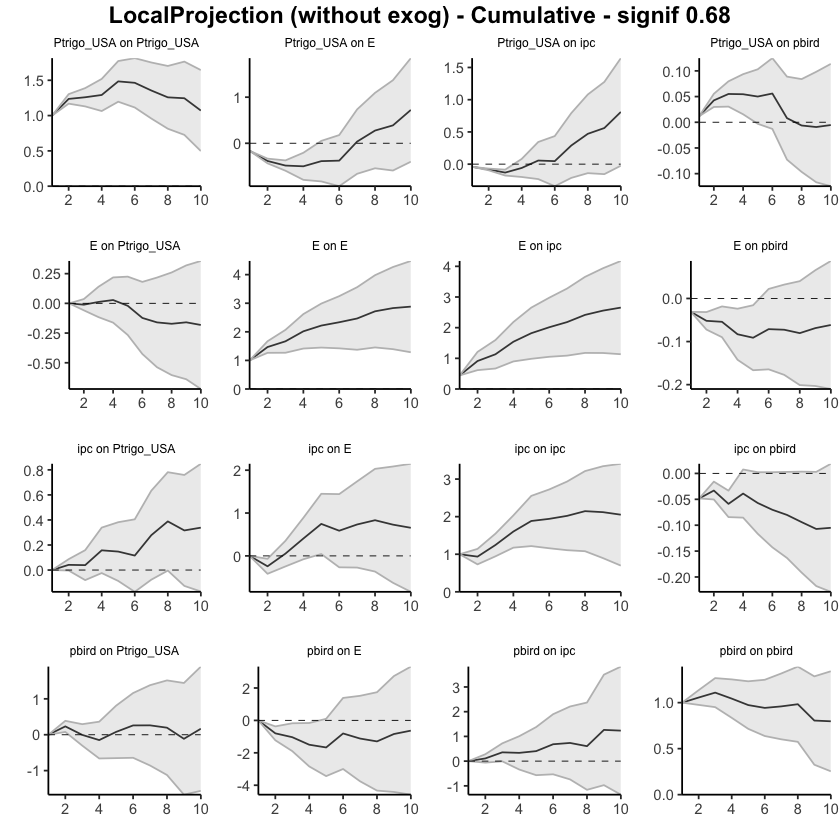

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("Ptrigo_USA", "E", "ipc", "pbird"), fixed_lags = 5, horizons=10, signif = 0.68, cumulative=TRUE)

### Psoja_USA 1950 a 2023 - 1 exógena y el resto endógenas - Selected orders: 2 y 5

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.000000000,0.00000000,0.0000000
24,ipc,E,2,-0.151049317,-0.54330403,0.2412054
25,ipc,E,3,0.279346398,-0.06526358,0.6239564
26,ipc,E,4,0.288323423,-0.26503968,0.8416865
27,ipc,E,5,0.424404424,0.08370506,0.7651038
28,ipc,E,6,-0.049938590,-0.31779608,0.2179189
29,ipc,E,7,0.182628660,-0.09302627,0.4582836
30,ipc,E,8,0.103788187,-0.31486455,0.5224409
31,ipc,E,9,-0.024878879,-0.27473752,0.2249798


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.00000000,0.00000000,0.0000000
46,pbird,E,2,-0.77284335,-1.65664393,0.1109572
47,pbird,E,3,-0.33178570,-1.11052208,0.4469507
48,pbird,E,4,-0.46237424,-1.43246239,0.5077139
49,pbird,E,5,-0.25287833,-1.20862346,0.7028668
50,pbird,E,6,0.74549109,-0.07404802,1.5650302
51,pbird,E,7,-0.41423246,-1.35232573,0.5238608
52,pbird,E,8,-0.24132597,-0.98543355,0.5027816
53,pbird,E,9,0.43610370,-0.54893153,1.4211389


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4638946,0.46389464,0.4638946
2,E,ipc,2,0.4743441,-0.13600940,1.0846977
3,E,ipc,3,0.2141589,-0.34138811,0.7697058
4,E,ipc,4,0.3852802,-0.09223254,0.8627929
5,E,ipc,5,0.2942124,-0.10892319,0.6973479
6,E,ipc,6,0.2058095,-0.11008204,0.5217010
7,E,ipc,7,0.1750804,-0.10506645,0.4552273
8,E,ipc,8,0.2308174,-0.11633987,0.5779746
9,E,ipc,9,0.1456835,-0.11237353,0.4037405


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.0000000,0.0000000
57,pbird,ipc,2,0.09945274,-0.2360190,0.4349244
58,pbird,ipc,3,0.17209206,-0.1875963,0.5317805
59,pbird,ipc,4,-0.06324068,-0.6675852,0.5411039
60,pbird,ipc,5,-0.03938156,-0.7138716,0.6351084
61,pbird,ipc,6,0.17488522,-0.3044768,0.6542472
62,pbird,ipc,7,-0.02500260,-0.6001353,0.5501301
63,pbird,ipc,8,-0.15364254,-0.8810291,0.5737440
64,pbird,ipc,9,0.58919261,-0.1874751,1.3658603


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.034103543,-0.034103543,-0.03410354
13,E,pbird,2,-0.017653721,-0.070302853,0.03499541
14,E,pbird,3,0.003475083,-0.036208912,0.04315908
15,E,pbird,4,-0.024872020,-0.070259670,0.02051563
16,E,pbird,5,-0.007886225,-0.038961173,0.02318872
17,E,pbird,6,0.020064288,-0.017133247,0.05726182
18,E,pbird,7,-0.000167838,-0.026303393,0.02596772
19,E,pbird,8,-0.006116853,-0.040609928,0.02837622
20,E,pbird,9,0.011570176,-0.009982078,0.03312243


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.051097293,-0.05109729,-0.051097293
35,ipc,pbird,2,0.024988625,-0.02350624,0.073483487
36,ipc,pbird,3,-0.011308654,-0.04156578,0.018948472
37,ipc,pbird,4,0.013196781,-0.02020025,0.046593812
38,ipc,pbird,5,-0.012772654,-0.03380360,0.008258295
39,ipc,pbird,6,-0.002791786,-0.02768272,0.022099152
40,ipc,pbird,7,-0.004782346,-0.02618771,0.016623014
41,ipc,pbird,8,-0.001497269,-0.03152272,0.028528187
42,ipc,pbird,9,-0.013510663,-0.02938485,0.002363520


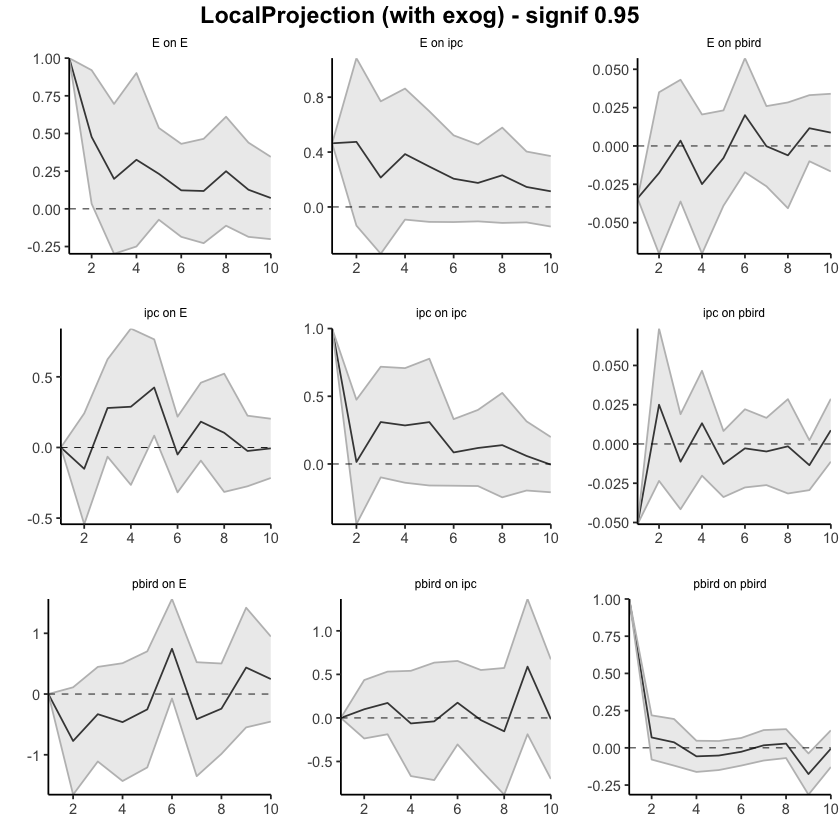

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Psoja_USA"), fixed_lags = 2, horizons=10, signif = 0.95)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.0000000,0.0000000,0.0000000
24,ipc,E,2,-0.1510493,-0.5433040,0.2412054
25,ipc,E,3,0.1282971,-0.6085676,0.8651618
26,ipc,E,4,0.4166205,-0.8736073,1.7068483
27,ipc,E,5,0.8410249,-0.7899022,2.4719521
28,ipc,E,6,0.7910863,-1.1076983,2.6898710
29,ipc,E,7,0.9737150,-1.2007246,3.1481546
30,ipc,E,8,1.0775032,-1.5155891,3.6705955
31,ipc,E,9,1.0526243,-1.7903267,3.8955753


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.0000000
46,pbird,E,2,-0.7728434,-1.656644,0.1109572
47,pbird,E,3,-1.1046290,-2.767166,0.5579079
48,pbird,E,4,-1.5670033,-4.199628,1.0656218
49,pbird,E,5,-1.8198816,-5.408252,1.7684886
50,pbird,E,6,-1.0743905,-5.482300,3.3335188
51,pbird,E,7,-1.4886230,-6.834626,3.8573796
52,pbird,E,8,-1.7299490,-7.820059,4.3601612
53,pbird,E,9,-1.2938453,-8.368991,5.7813002


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4638946,0.46389464,0.4638946
2,E,ipc,2,0.9382388,0.32788524,1.5485923
3,E,ipc,3,1.1523976,-0.01350287,2.3182982
4,E,ipc,4,1.5376778,-0.10573541,3.1810911
5,E,ipc,5,1.8318902,-0.21465860,3.8784390
6,E,ipc,6,2.0376997,-0.32474064,4.4001400
7,E,ipc,7,2.2127801,-0.42980709,4.8553673
8,E,ipc,8,2.4435975,-0.54614696,5.4333419
9,E,ipc,9,2.5892809,-0.65852049,5.8370824


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.0000000,0.0000000
57,pbird,ipc,2,0.09945274,-0.2360190,0.4349244
58,pbird,ipc,3,0.27154480,-0.4236153,0.9667049
59,pbird,ipc,4,0.20830412,-1.0912005,1.5078088
60,pbird,ipc,5,0.16892256,-1.8050721,2.1429172
61,pbird,ipc,6,0.34380778,-2.1095489,2.7971644
62,pbird,ipc,7,0.31880518,-2.7096842,3.3472945
63,pbird,ipc,8,0.16516265,-3.5907132,3.9210385
64,pbird,ipc,9,0.75435525,-3.7781883,5.2868988


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03410354,-0.03410354,-0.0341035428
13,E,pbird,2,-0.05175726,-0.10440640,0.0008918678
14,E,pbird,3,-0.04828218,-0.14061531,0.0440509468
15,E,pbird,4,-0.07315420,-0.21087498,0.0645665757
16,E,pbird,5,-0.08104043,-0.24983615,0.0877552989
17,E,pbird,6,-0.06097614,-0.26696940,0.1450171218
18,E,pbird,7,-0.06114398,-0.29327279,0.1709848387
19,E,pbird,8,-0.06726083,-0.33388272,0.1993610604
20,E,pbird,9,-0.05569065,-0.34386480,0.2324834898


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.05109729,-0.05109729,-0.05109729
35,ipc,pbird,2,-0.02610867,-0.07460353,0.02238619
36,ipc,pbird,3,-0.03741732,-0.11616931,0.04133467
37,ipc,pbird,4,-0.02422054,-0.13636956,0.08792848
38,ipc,pbird,5,-0.03699319,-0.17017316,0.09618677
39,ipc,pbird,6,-0.03978498,-0.19785589,0.11828592
40,ipc,pbird,7,-0.04456733,-0.22404359,0.13490894
41,ipc,pbird,8,-0.04606460,-0.25556632,0.16343713
42,ipc,pbird,9,-0.05957526,-0.28495116,0.16580065


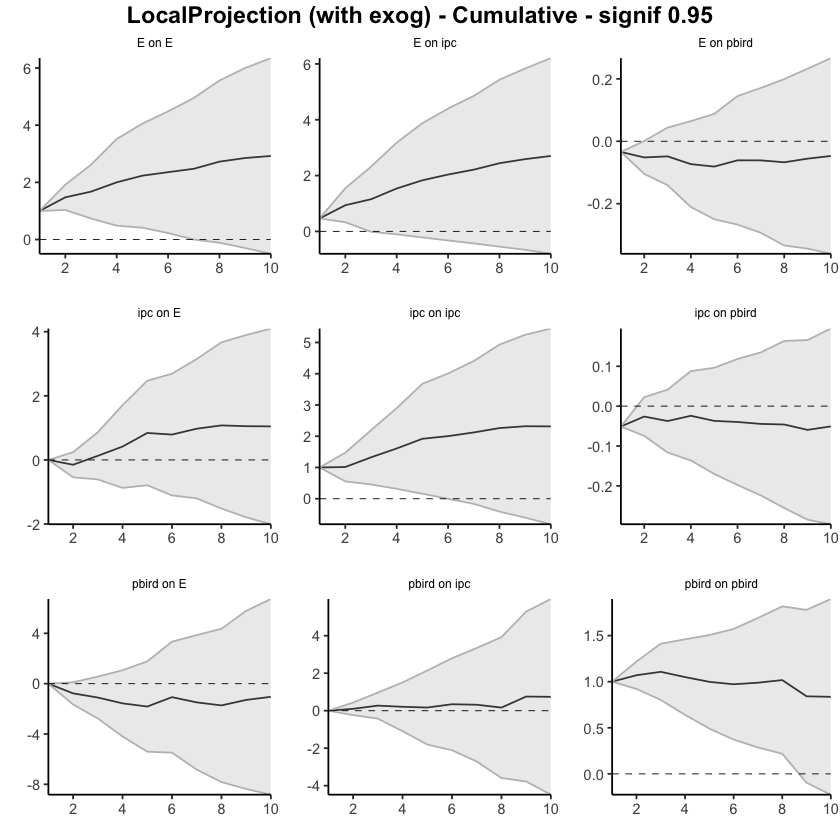

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Psoja_USA"), fixed_lags = 2, horizons=10, signif = 0.95, cumulative=TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.000000000,0.000000000,0.00000000
24,ipc,E,2,-0.151049317,-0.351179270,0.04908064
25,ipc,E,3,0.279346398,0.103524981,0.45516782
26,ipc,E,4,0.288323423,0.005995308,0.57065154
27,ipc,E,5,0.424404424,0.250578217,0.59823063
28,ipc,E,6,-0.049938590,-0.186600577,0.08672340
29,ipc,E,7,0.182628660,0.041988389,0.32326893
30,ipc,E,8,0.103788187,-0.109810149,0.31738652
31,ipc,E,9,-0.024878879,-0.152357777,0.10260002


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.00000000,0.00000000,0.00000000
46,pbird,E,2,-0.77284335,-1.22376201,-0.32192469
47,pbird,E,3,-0.33178570,-0.72910018,0.06552878
48,pbird,E,4,-0.46237424,-0.95731717,0.03256869
49,pbird,E,5,-0.25287833,-0.74050340,0.23474674
50,pbird,E,6,0.74549109,0.32735889,1.16362329
51,pbird,E,7,-0.41423246,-0.89285147,0.06438656
52,pbird,E,8,-0.24132597,-0.62097270,0.13832075
53,pbird,E,9,0.43610370,-0.06646529,0.93867270


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4638946,0.46389464,0.4638946
2,E,ipc,2,0.4743441,0.16293927,0.7857490
3,E,ipc,3,0.2141589,-0.06928347,0.4976012
4,E,ipc,4,0.3852802,0.14165125,0.6289091
5,E,ipc,5,0.2942124,0.08853095,0.4998938
6,E,ipc,6,0.2058095,0.04464034,0.3669786
7,E,ipc,7,0.1750804,0.03214835,0.3180125
8,E,ipc,8,0.2308174,0.05369633,0.4079384
9,E,ipc,9,0.1456835,0.01402173,0.2773452


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.00000000,0.0000000
57,pbird,ipc,2,0.09945274,-0.07170628,0.2706118
58,pbird,ipc,3,0.17209206,-0.01142243,0.3556065
59,pbird,ipc,4,-0.06324068,-0.37157975,0.2450984
60,pbird,ipc,5,-0.03938156,-0.38350911,0.3047460
61,pbird,ipc,6,0.17488522,-0.06968723,0.4194577
62,pbird,ipc,7,-0.02500260,-0.31843764,0.2684325
63,pbird,ipc,8,-0.15364254,-0.52475811,0.2174730
64,pbird,ipc,9,0.58919261,0.19293356,0.9854517


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.034103543,-0.0341035428,-0.034103543
13,E,pbird,2,-0.017653721,-0.0445155233,0.009208081
14,E,pbird,3,0.003475083,-0.0167718533,0.023722020
15,E,pbird,4,-0.024872020,-0.0480289843,-0.001715056
16,E,pbird,5,-0.007886225,-0.0237407899,0.007968341
17,E,pbird,6,0.020064288,0.0010859542,0.039042622
18,E,pbird,7,-0.000167838,-0.0135023049,0.013166629
19,E,pbird,8,-0.006116853,-0.0237153611,0.011481654
20,E,pbird,9,0.011570176,0.0005741282,0.022566224


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.051097293,-0.0510972930,-0.051097293
35,ipc,pbird,2,0.024988625,0.0002463491,0.049730902
36,ipc,pbird,3,-0.011308654,-0.0267459633,0.004128655
37,ipc,pbird,4,0.013196781,-0.0038425206,0.030236083
38,ipc,pbird,5,-0.012772654,-0.0235027297,-0.002042578
39,ipc,pbird,6,-0.002791786,-0.0154912435,0.009907672
40,ipc,pbird,7,-0.004782346,-0.0157034484,0.006138756
41,ipc,pbird,8,-0.001497269,-0.0168163787,0.013821841
42,ipc,pbird,9,-0.013510663,-0.0216097353,-0.005411590


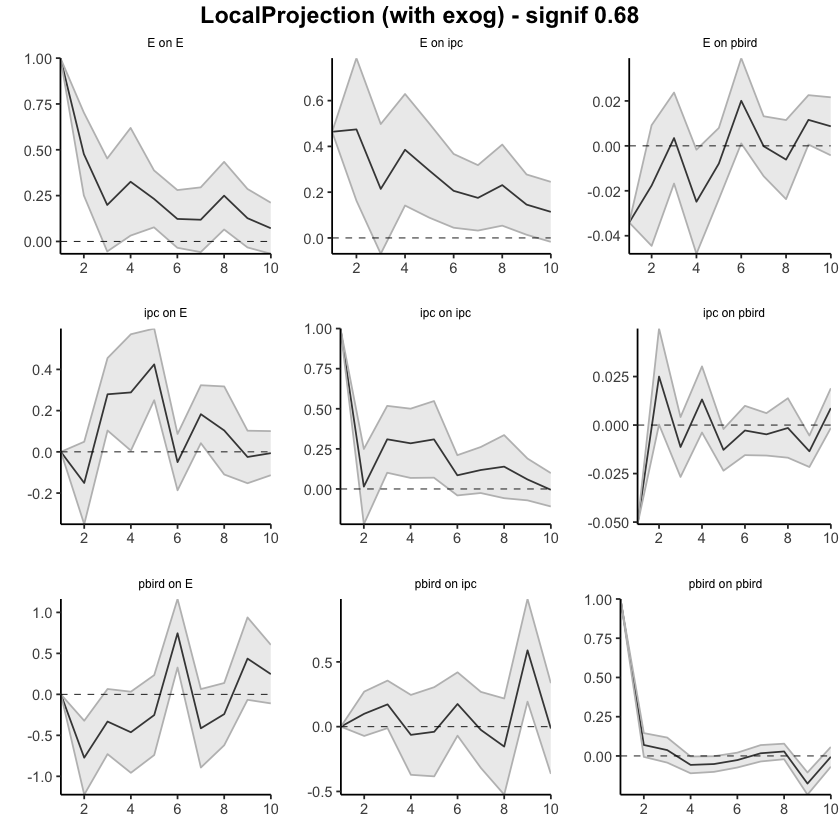

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Psoja_USA"), fixed_lags = 2, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.0000000,0.000000000,0.00000000
24,ipc,E,2,-0.1510493,-0.351179270,0.04908064
25,ipc,E,3,0.1282971,-0.247654289,0.50424845
26,ipc,E,4,0.4166205,-0.241658981,1.07489999
27,ipc,E,5,0.8410249,0.008919235,1.67313062
28,ipc,E,6,0.7910863,-0.177681342,1.75985402
29,ipc,E,7,0.9737150,-0.135692953,2.08312295
30,ipc,E,8,1.0775032,-0.245503102,2.40050947
31,ipc,E,9,1.0526243,-0.397860879,2.50310949


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.00000000
46,pbird,E,2,-0.7728434,-1.223762,-0.32192469
47,pbird,E,3,-1.1046290,-1.952862,-0.25639591
48,pbird,E,4,-1.5670033,-2.910179,-0.22382722
49,pbird,E,5,-1.8198816,-3.650683,0.01091952
50,pbird,E,6,-1.0743905,-3.323324,1.17454281
51,pbird,E,7,-1.4886230,-4.216175,1.23892937
52,pbird,E,8,-1.7299490,-4.837148,1.37725012
53,pbird,E,9,-1.2938453,-4.903613,2.31592282


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4638946,0.4638946,0.4638946
2,E,ipc,2,0.9382388,0.6268339,1.2496437
3,E,ipc,3,1.1523976,0.5575504,1.7472448
4,E,ipc,4,1.5376778,0.6992017,2.3761540
5,E,ipc,5,1.8318902,0.7877326,2.8760477
6,E,ipc,6,2.0376997,0.8323730,3.2430264
7,E,ipc,7,2.2127801,0.8645213,3.5610389
8,E,ipc,8,2.4435975,0.9182177,3.9689773
9,E,ipc,9,2.5892809,0.9322394,4.2463225


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.00000000,0.0000000
57,pbird,ipc,2,0.09945274,-0.07170628,0.2706118
58,pbird,ipc,3,0.27154480,-0.08312871,0.6262183
59,pbird,ipc,4,0.20830412,-0.45470846,0.8713167
60,pbird,ipc,5,0.16892256,-0.83821757,1.1760627
61,pbird,ipc,6,0.34380778,-0.90790479,1.5955203
62,pbird,ipc,7,0.31880518,-1.22634244,1.8639528
63,pbird,ipc,8,0.16516265,-1.75110054,2.0814258
64,pbird,ipc,9,0.75435525,-1.55816699,3.0668775


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03410354,-0.03410354,-0.034103543
13,E,pbird,2,-0.05175726,-0.07861907,-0.024895462
14,E,pbird,3,-0.04828218,-0.09539092,-0.001173442
15,E,pbird,4,-0.07315420,-0.14341990,-0.002888499
16,E,pbird,5,-0.08104043,-0.16716069,0.005079842
17,E,pbird,6,-0.06097614,-0.16607474,0.044122464
18,E,pbird,7,-0.06114398,-0.17957704,0.057289093
19,E,pbird,8,-0.06726083,-0.20329241,0.068770747
20,E,pbird,9,-0.05569065,-0.20271828,0.091336971


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.05109729,-0.05109729,-0.051097293
35,ipc,pbird,2,-0.02610867,-0.05085094,-0.001366391
36,ipc,pbird,3,-0.03741732,-0.07759691,0.002762264
37,ipc,pbird,4,-0.02422054,-0.08143943,0.032998346
38,ipc,pbird,5,-0.03699319,-0.10494216,0.030955769
39,ipc,pbird,6,-0.03978498,-0.12043340,0.040863441
40,ipc,pbird,7,-0.04456733,-0.13613685,0.047002197
41,ipc,pbird,8,-0.04606460,-0.15295323,0.060824038
42,ipc,pbird,9,-0.05957526,-0.17456296,0.055412448


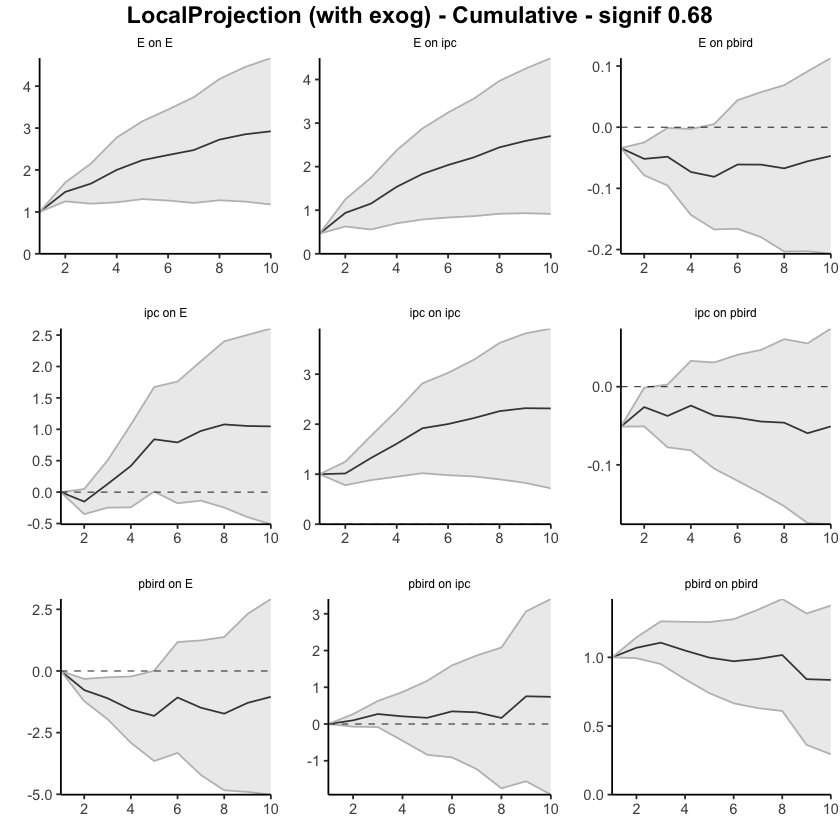

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Psoja_USA"), fixed_lags = 2, horizons=10, signif = 0.68, cumulative=TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,5,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.00000000,0.00000000,0.00000000
24,ipc,E,2,-0.22017216,-0.37855852,-0.06178581
25,ipc,E,3,0.33040880,0.22743252,0.43338509
26,ipc,E,4,0.36325072,0.17795007,0.54855138
27,ipc,E,5,0.30465911,0.11556431,0.49375391
28,ipc,E,6,-0.12304422,-0.28050133,0.03441289
29,ipc,E,7,0.18536969,0.04782562,0.32291376
30,ipc,E,8,0.08592084,-0.10149677,0.27333844
31,ipc,E,9,-0.12575412,-0.27714184,0.02563360


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.00000000,0.0000000,0.00000000
46,pbird,E,2,-0.86434413,-1.3090016,-0.41968668
47,pbird,E,3,-0.29533231,-0.7570055,0.16634093
48,pbird,E,4,-0.62493863,-1.1474077,-0.10246956
49,pbird,E,5,-0.33782929,-0.8316053,0.15594672
50,pbird,E,6,0.74753694,0.3379709,1.15710303
51,pbird,E,7,-0.47889772,-0.9427722,-0.01502322
52,pbird,E,8,-0.28342058,-0.6516296,0.08478839
53,pbird,E,9,0.47473524,-0.1333379,1.08280837


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4382695,0.43826951,0.4382695
2,E,ipc,2,0.4666999,0.19278988,0.7406100
3,E,ipc,3,0.2084707,0.03244010,0.3845013
4,E,ipc,4,0.4081552,0.22997585,0.5863346
5,E,ipc,5,0.2883146,0.10266717,0.4739620
6,E,ipc,6,0.1988100,0.05689725,0.3407227
7,E,ipc,7,0.1810249,0.04866139,0.3133885
8,E,ipc,8,0.2448143,0.09944308,0.3901854
9,E,ipc,9,0.1329987,-0.01966782,0.2856652


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.00000000,0.00000000
57,pbird,ipc,2,0.05254363,-0.14468180,0.24976905
58,pbird,ipc,3,0.17463366,-0.02205038,0.37131770
59,pbird,ipc,4,-0.17670061,-0.52120871,0.16780749
60,pbird,ipc,5,-0.06589952,-0.39042288,0.25862385
61,pbird,ipc,6,0.15844030,-0.11944682,0.43632743
62,pbird,ipc,7,-0.09348404,-0.37778065,0.19081256
63,pbird,ipc,8,-0.20076216,-0.51931301,0.11778869
64,pbird,ipc,9,0.58153476,0.10521285,1.05785667


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.0330926320,-0.0330926320,-0.0330926320
13,E,pbird,2,-0.0195688578,-0.0393625126,0.0002247971
14,E,pbird,3,-0.0002063017,-0.0167872544,0.0163746510
15,E,pbird,4,-0.0280113217,-0.0555338690,-0.0004887744
16,E,pbird,5,-0.0087720360,-0.0244336269,0.0068895548
17,E,pbird,6,0.0199103147,0.0002423654,0.0395782641
18,E,pbird,7,-0.0028901082,-0.0135991536,0.0078189372
19,E,pbird,8,-0.0099912304,-0.0265311307,0.0065486698
20,E,pbird,9,0.0119833715,-0.0010048846,0.0249716277


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.049291345,-0.049291345,-0.0492913449
35,ipc,pbird,2,0.015570706,-0.001401052,0.0325424629
36,ipc,pbird,3,-0.027396722,-0.036902483,-0.0178909605
37,ipc,pbird,4,0.009831912,-0.015349758,0.0350135814
38,ipc,pbird,5,-0.018852342,-0.030765470,-0.0069392151
39,ipc,pbird,6,-0.006223998,-0.020857123,0.0084091263
40,ipc,pbird,7,-0.008769122,-0.018244187,0.0007059436
41,ipc,pbird,8,-0.020166185,-0.035081401,-0.0052509684
42,ipc,pbird,9,-0.013155318,-0.025322810,-0.0009878267


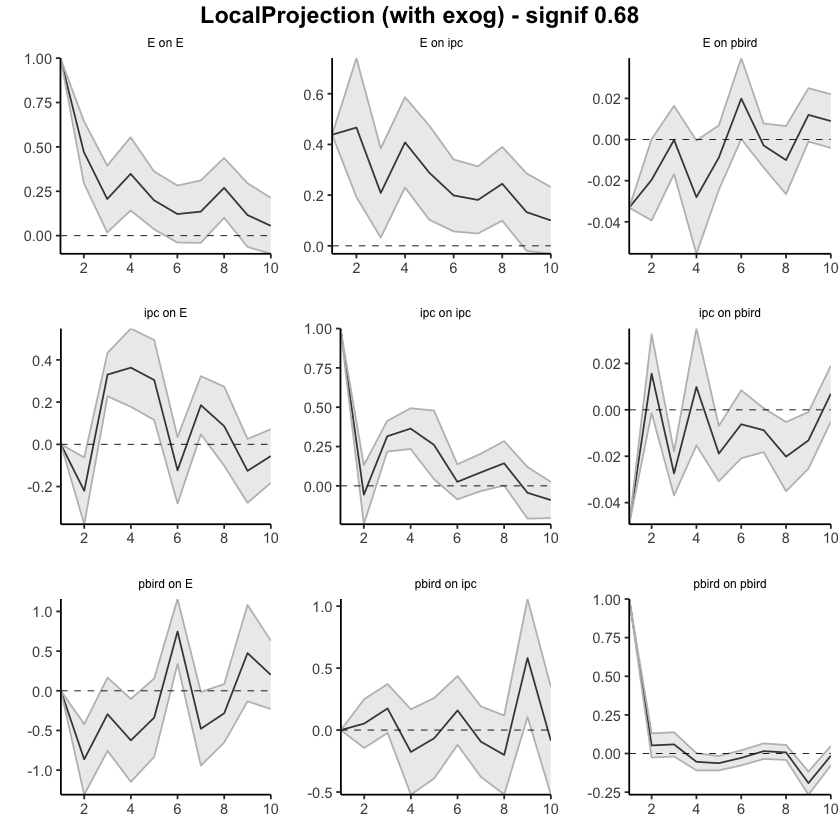

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Psoja_USA"), fixed_lags = 5, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,5,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.0000000,0.00000000,0.00000000
24,ipc,E,2,-0.2201722,-0.37855852,-0.06178581
25,ipc,E,3,0.1102366,-0.15112600,0.37159928
26,ipc,E,4,0.4734874,0.02682407,0.92015066
27,ipc,E,5,0.7781465,0.14238838,1.41390456
28,ipc,E,6,0.6551023,-0.13811294,1.44831746
29,ipc,E,7,0.8404719,-0.09028732,1.77123121
30,ipc,E,8,0.9263928,-0.19178409,2.04456965
31,ipc,E,9,0.8006387,-0.46892593,2.07020325


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.0000000
46,pbird,E,2,-0.8643441,-1.309002,-0.4196867
47,pbird,E,3,-1.1596764,-2.066007,-0.2533458
48,pbird,E,4,-1.7846151,-3.213415,-0.3558153
49,pbird,E,5,-2.1224443,-4.045020,-0.1998686
50,pbird,E,6,-1.3749074,-3.707049,0.9572344
51,pbird,E,7,-1.8538051,-4.649821,0.9422112
52,pbird,E,8,-2.1372257,-5.301451,1.0269996
53,pbird,E,9,-1.6624905,-5.434789,2.1098080


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4382695,0.4382695,0.4382695
2,E,ipc,2,0.9049694,0.6310594,1.1788795
3,E,ipc,3,1.1134401,0.6634995,1.5633808
4,E,ipc,4,1.5215954,0.8934753,2.1497154
5,E,ipc,5,1.8099099,0.9961425,2.6236774
6,E,ipc,6,2.0087199,1.0530398,2.9644000
7,E,ipc,7,2.1897448,1.1017011,3.2777885
8,E,ipc,8,2.4345591,1.2011442,3.6679739
9,E,ipc,9,2.5675578,1.1814764,3.9536392


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.0000000,0.0000000
57,pbird,ipc,2,0.05254363,-0.1446818,0.2497691
58,pbird,ipc,3,0.22717729,-0.1667322,0.6210868
59,pbird,ipc,4,0.05047668,-0.6879409,0.7888942
60,pbird,ipc,5,-0.01542284,-1.0783638,1.0475181
61,pbird,ipc,6,0.14301746,-1.1978106,1.4838455
62,pbird,ipc,7,0.04953342,-1.5755912,1.6746581
63,pbird,ipc,8,-0.15122874,-2.0949043,1.7924468
64,pbird,ipc,9,0.43030602,-1.9896914,2.8503034


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03309263,-0.03309263,-0.03309263
13,E,pbird,2,-0.05266149,-0.07245514,-0.03286783
14,E,pbird,3,-0.05286779,-0.08924240,-0.01649318
15,E,pbird,4,-0.08087911,-0.14477627,-0.01698196
16,E,pbird,5,-0.08965115,-0.16920989,-0.01009240
17,E,pbird,6,-0.06974083,-0.16896753,0.02948586
18,E,pbird,7,-0.07263094,-0.18256668,0.03730480
19,E,pbird,8,-0.08262217,-0.20909781,0.04385347
20,E,pbird,9,-0.07063880,-0.21010270,0.06882510


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.04929134,-0.04929134,-0.0492913449
35,ipc,pbird,2,-0.03372064,-0.05069240,-0.0167488820
36,ipc,pbird,3,-0.06111736,-0.08759488,-0.0346398425
37,ipc,pbird,4,-0.05128545,-0.10294464,0.0003737389
38,ipc,pbird,5,-0.07013779,-0.13371011,-0.0065654762
39,ipc,pbird,6,-0.07636179,-0.15456723,0.0018436501
40,ipc,pbird,7,-0.08513091,-0.17281142,0.0025495937
41,ipc,pbird,8,-0.10529710,-0.20789282,-0.0027013747
42,ipc,pbird,9,-0.11845242,-0.23321563,-0.0036892014


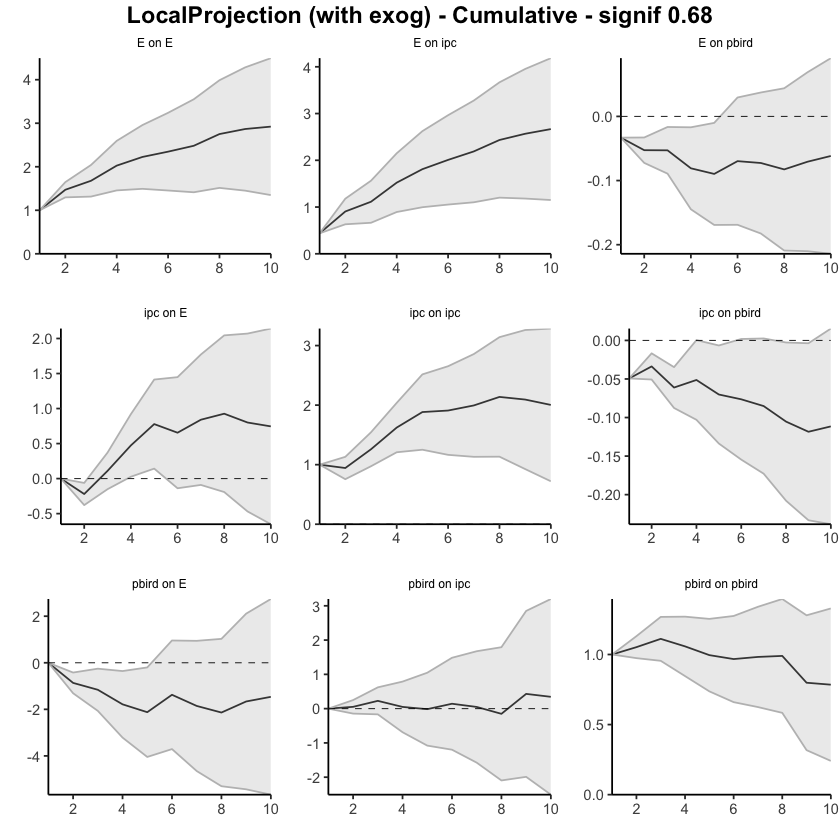

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Psoja_USA"), fixed_lags = 5, horizons=10, signif = 0.68, cumulative=TRUE)

### Pmaíz_USA 1950 a 2023 - 1 exógena y el resto endógenas - Selected orders: 2 y 5

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.0000000000,0.00000000,0.0000000
24,ipc,E,2,-0.1606434852,-0.55901380,0.2377268
25,ipc,E,3,0.2658018455,-0.08255164,0.6141553
26,ipc,E,4,0.2821404882,-0.24275432,0.8070353
27,ipc,E,5,0.4143850528,0.06454607,0.7642240
28,ipc,E,6,-0.0725926028,-0.33206808,0.1868829
29,ipc,E,7,0.1738262453,-0.12306483,0.4707173
30,ipc,E,8,0.1218133899,-0.29427382,0.5379006
31,ipc,E,9,-0.0207154915,-0.26484967,0.2234187


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.00000000,0.00000000,0.0000000
46,pbird,E,2,-0.79087357,-1.68201482,0.1002677
47,pbird,E,3,-0.32402917,-1.13218550,0.4841272
48,pbird,E,4,-0.40538076,-1.30905349,0.4982920
49,pbird,E,5,-0.24070371,-1.14270384,0.6612964
50,pbird,E,6,0.75813288,-0.06624701,1.5825128
51,pbird,E,7,-0.36881100,-1.25288181,0.5152598
52,pbird,E,8,-0.15499379,-0.87551567,0.5655281
53,pbird,E,9,0.47453876,-0.50496336,1.4540409


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4629143,0.46291431,0.4629143
2,E,ipc,2,0.4742112,-0.17352066,1.1219431
3,E,ipc,3,0.2183117,-0.29580044,0.7324239
4,E,ipc,4,0.3848373,-0.08446462,0.8541391
5,E,ipc,5,0.2897879,-0.10869914,0.6882750
6,E,ipc,6,0.2015403,-0.08986654,0.4929472
7,E,ipc,7,0.1700226,-0.10627506,0.4463202
8,E,ipc,8,0.2258077,-0.09809737,0.5497127
9,E,ipc,9,0.1435391,-0.10112196,0.3882001


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.000000000,0.0000000,0.0000000
57,pbird,ipc,2,0.080330925,-0.2568239,0.4174857
58,pbird,ipc,3,0.177523504,-0.1726288,0.5276758
59,pbird,ipc,4,-0.011571484,-0.5730129,0.5498700
60,pbird,ipc,5,-0.010027656,-0.6609277,0.6408724
61,pbird,ipc,6,0.239782973,-0.2279060,0.7074719
62,pbird,ipc,7,0.014940573,-0.5245344,0.5544156
63,pbird,ipc,8,-0.121477421,-0.7554141,0.5124592
64,pbird,ipc,9,0.638880758,-0.1594747,1.4372362


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.034497617,-0.034497617,-0.03449762
13,E,pbird,2,-0.018444124,-0.070034462,0.03314621
14,E,pbird,3,0.002549868,-0.035804804,0.04090454
15,E,pbird,4,-0.026964178,-0.071984823,0.01805647
16,E,pbird,5,-0.008167742,-0.038849702,0.02251422
17,E,pbird,6,0.021540053,-0.013762627,0.05684273
18,E,pbird,7,0.001431544,-0.024408577,0.02727166
19,E,pbird,8,-0.005835264,-0.039952541,0.02828201
20,E,pbird,9,0.011157651,-0.009905898,0.03222120


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.047008526,-0.04700853,-0.047008526
35,ipc,pbird,2,0.026526042,-0.02174892,0.074801004
36,ipc,pbird,3,-0.008738516,-0.03704409,0.019567054
37,ipc,pbird,4,0.018716353,-0.01460990,0.052042610
38,ipc,pbird,5,-0.012168311,-0.03344540,0.009108777
39,ipc,pbird,6,-0.006020436,-0.02968064,0.017639772
40,ipc,pbird,7,-0.007818976,-0.03015936,0.014521412
41,ipc,pbird,8,-0.001864452,-0.03200966,0.028280756
42,ipc,pbird,9,-0.013098655,-0.02929032,0.003093012


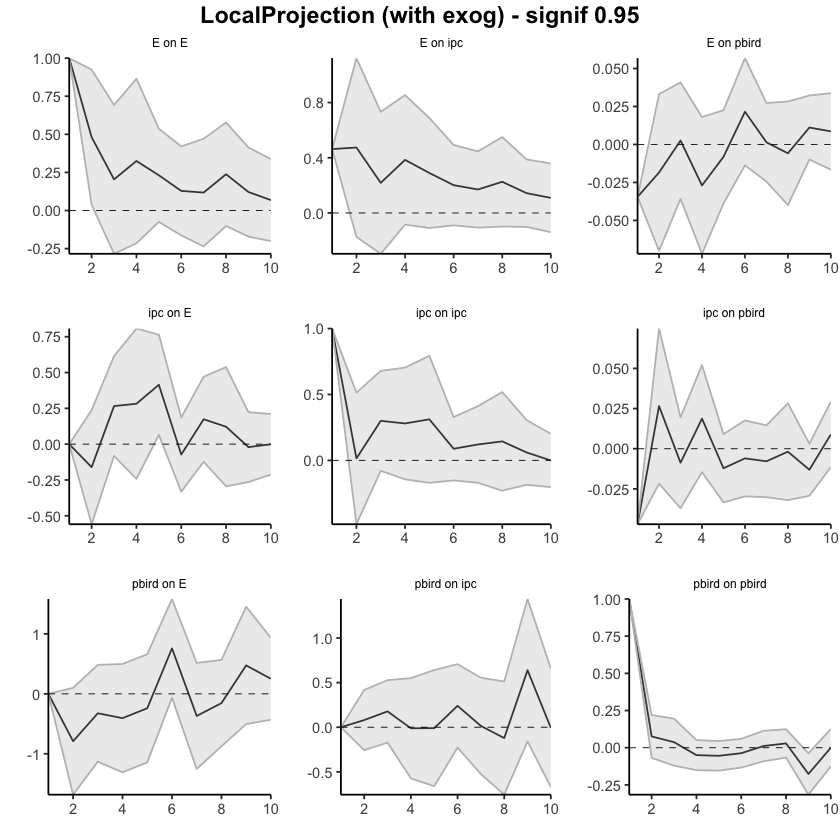

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Pmaíz_USA"), fixed_lags = 2, horizons=10, signif = 0.95)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.0000000000,0.00000000,0.00000000
24,ipc,E,2,-0.1606434852,-0.36389365,0.04260668
25,ipc,E,3,0.2658018455,0.08807048,0.44353321
26,ipc,E,4,0.2821404882,0.01433701,0.54994396
27,ipc,E,5,0.4143850528,0.23589577,0.59287433
28,ipc,E,6,-0.0725926028,-0.20497805,0.05979285
29,ipc,E,7,0.1738262453,0.02235120,0.32530129
30,ipc,E,8,0.1218133899,-0.09047600,0.33410278
31,ipc,E,9,-0.0207154915,-0.14527375,0.10384276


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.00000000,0.00000000,0.00000000
46,pbird,E,2,-0.79087357,-1.24553747,-0.33620966
47,pbird,E,3,-0.32402917,-0.73635383,0.08829548
48,pbird,E,4,-0.40538076,-0.86643828,0.05567675
49,pbird,E,5,-0.24070371,-0.70090786,0.21950045
50,pbird,E,6,0.75813288,0.33753090,1.17873487
51,pbird,E,7,-0.36881100,-0.81986754,0.08224554
52,pbird,E,8,-0.15499379,-0.52260700,0.21261941
53,pbird,E,9,0.47453876,-0.02520722,0.97428474


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4629143,0.46291431,0.4629143
2,E,ipc,2,0.4742112,0.14373578,0.8046867
3,E,ipc,3,0.2183117,-0.04399040,0.4806138
4,E,ipc,4,0.3848373,0.14539753,0.6242770
5,E,ipc,5,0.2897879,0.08647819,0.4930976
6,E,ipc,6,0.2015403,0.05286336,0.3502173
7,E,ipc,7,0.1700226,0.02905439,0.3109908
8,E,ipc,8,0.2258077,0.06054999,0.3910653
9,E,ipc,9,0.1435391,0.01871201,0.2683661


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.000000000,0.000000000,0.0000000
57,pbird,ipc,2,0.080330925,-0.091686826,0.2523487
58,pbird,ipc,3,0.177523504,-0.001125627,0.3561726
59,pbird,ipc,4,-0.011571484,-0.298021210,0.2748782
60,pbird,ipc,5,-0.010027656,-0.342119518,0.3220642
61,pbird,ipc,6,0.239782973,0.001166163,0.4783998
62,pbird,ipc,7,0.014940573,-0.260301768,0.2901829
63,pbird,ipc,8,-0.121477421,-0.444914492,0.2019597
64,pbird,ipc,9,0.638880758,0.231556540,1.0462050


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.034497617,-0.0344976175,-0.034497617
13,E,pbird,2,-0.018444124,-0.0447657251,0.007877476
14,E,pbird,3,0.002549868,-0.0170188421,0.022118577
15,E,pbird,4,-0.026964178,-0.0499338948,-0.003994462
16,E,pbird,5,-0.008167742,-0.0238218029,0.007486320
17,E,pbird,6,0.021540053,0.0035284818,0.039551625
18,E,pbird,7,0.001431544,-0.0117521912,0.014615279
19,E,pbird,8,-0.005835264,-0.0232420377,0.011571510
20,E,pbird,9,0.011157651,0.0004109422,0.021904359


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.047008526,-0.047008526,-0.047008526
35,ipc,pbird,2,0.026526042,0.001895960,0.051156125
36,ipc,pbird,3,-0.008738516,-0.023180134,0.005703101
37,ipc,pbird,4,0.018716353,0.001713161,0.035719545
38,ipc,pbird,5,-0.012168311,-0.023023968,-0.001312654
39,ipc,pbird,6,-0.006020436,-0.018091970,0.006051099
40,ipc,pbird,7,-0.007818976,-0.019217133,0.003579181
41,ipc,pbird,8,-0.001864452,-0.017244660,0.013515756
42,ipc,pbird,9,-0.013098655,-0.021359709,-0.004837600


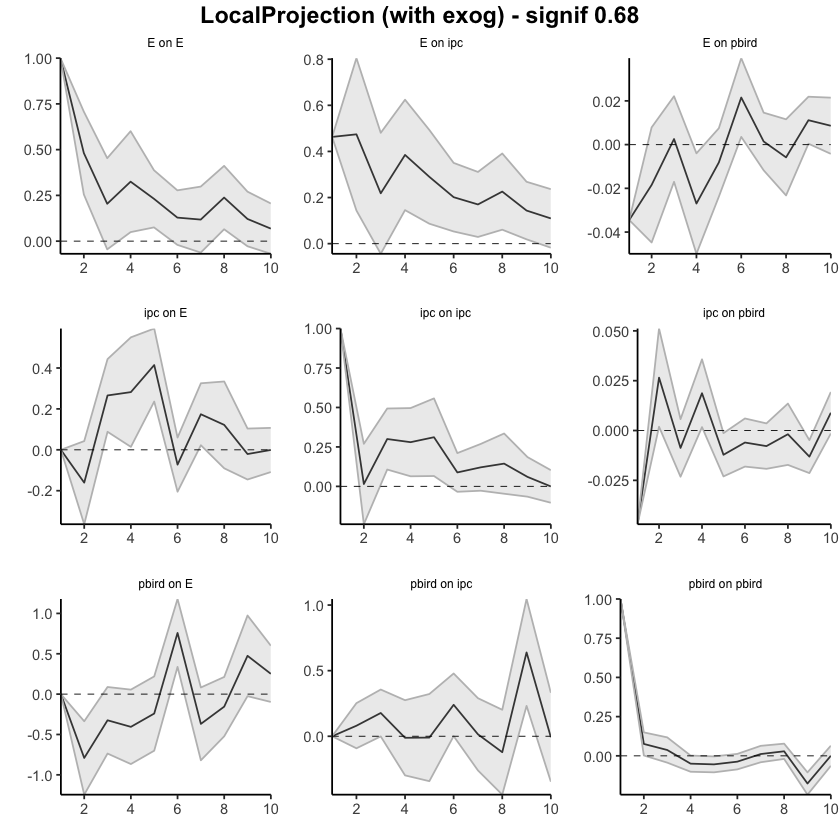

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Pmaíz_USA"), fixed_lags = 2, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.0000000,0.0000000,0.0000000
24,ipc,E,2,-0.1606435,-0.5590138,0.2377268
25,ipc,E,3,0.1051584,-0.6415654,0.8518822
26,ipc,E,4,0.3872988,-0.8843198,1.6589175
27,ipc,E,5,0.8016839,-0.8197737,2.4231415
28,ipc,E,6,0.7290913,-1.1518418,2.6100244
29,ipc,E,7,0.9029175,-1.2749066,3.0807417
30,ipc,E,8,1.0247309,-1.5691804,3.6186423
31,ipc,E,9,1.0040154,-1.8340301,3.8420610


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.0000000
46,pbird,E,2,-0.7908736,-1.682015,0.1002677
47,pbird,E,3,-1.1149027,-2.814200,0.5843948
48,pbird,E,4,-1.5202835,-4.123254,1.0826868
49,pbird,E,5,-1.7609872,-5.265958,1.7439832
50,pbird,E,6,-1.0028543,-5.332205,3.3264960
51,pbird,E,7,-1.3716653,-6.585086,3.8417558
52,pbird,E,8,-1.5266591,-7.460602,4.4072839
53,pbird,E,9,-1.0521204,-7.965566,5.8613248


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4629143,0.462914313,0.4629143
2,E,ipc,2,0.9371255,0.289393657,1.5848574
3,E,ipc,3,1.1554373,-0.006406782,2.3172813
4,E,ipc,4,1.5402745,-0.090871397,3.1714204
5,E,ipc,5,1.8300624,-0.199570539,3.8596954
6,E,ipc,6,2.0316028,-0.289437075,4.3526426
7,E,ipc,7,2.2016253,-0.395712137,4.7989628
8,E,ipc,8,2.4274330,-0.493809510,5.3486755
9,E,ipc,9,2.5709721,-0.594931471,5.7368756


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.0000000,0.0000000
57,pbird,ipc,2,0.08033092,-0.2568239,0.4174857
58,pbird,ipc,3,0.25785443,-0.4294527,0.9451615
59,pbird,ipc,4,0.24628294,-1.0024656,1.4950315
60,pbird,ipc,5,0.23625529,-1.6633933,2.1359039
61,pbird,ipc,6,0.47603826,-1.8912993,2.8433758
62,pbird,ipc,7,0.49097883,-2.4158337,3.3977914
63,pbird,ipc,8,0.36950141,-3.1712478,3.9102506
64,pbird,ipc,9,1.00838217,-3.3307225,5.3474868


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03449762,-0.03449762,-0.034497617
13,E,pbird,2,-0.05294174,-0.10453208,-0.001351404
14,E,pbird,3,-0.05039187,-0.14033688,0.039553135
15,E,pbird,4,-0.07735605,-0.21232171,0.057609601
16,E,pbird,5,-0.08552379,-0.25117141,0.080123820
17,E,pbird,6,-0.06398374,-0.26493403,0.136966553
18,E,pbird,7,-0.06255220,-0.28934261,0.164238217
19,E,pbird,8,-0.06838746,-0.32929515,0.192520231
20,E,pbird,9,-0.05722981,-0.33920105,0.224741430


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.04700853,-0.04700853,-0.04700853
35,ipc,pbird,2,-0.02048248,-0.06875745,0.02779248
36,ipc,pbird,3,-0.02922100,-0.10580153,0.04735953
37,ipc,pbird,4,-0.01050465,-0.12041144,0.09940214
38,ipc,pbird,5,-0.02267296,-0.15385683,0.10851092
39,ipc,pbird,6,-0.02869339,-0.18353748,0.12615069
40,ipc,pbird,7,-0.03651237,-0.21369684,0.14067210
41,ipc,pbird,8,-0.03837682,-0.24570650,0.16895286
42,ipc,pbird,9,-0.05147548,-0.27499682,0.17204587


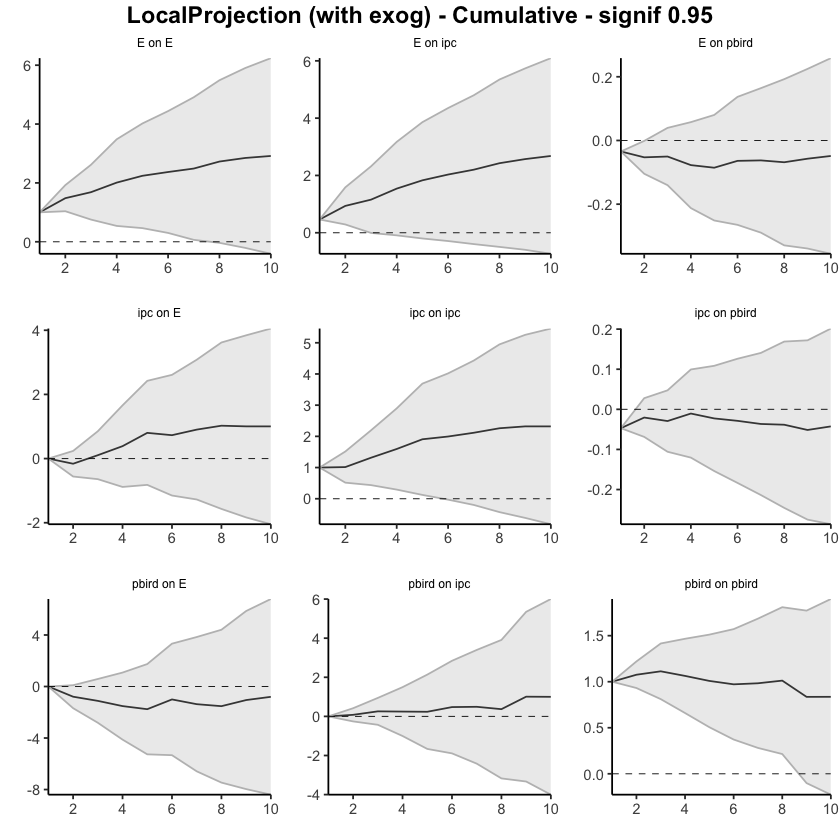

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Pmaíz_USA"), fixed_lags = 2, horizons=10, signif = 0.95, cumulative = TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.0000000,0.00000000,0.00000000
24,ipc,E,2,-0.1606435,-0.36389365,0.04260668
25,ipc,E,3,0.1051584,-0.27582317,0.48613989
26,ipc,E,4,0.3872988,-0.26148616,1.03608385
27,ipc,E,5,0.8016839,-0.02559038,1.62895818
28,ipc,E,6,0.7290913,-0.23056844,1.68875103
29,ipc,E,7,0.9029175,-0.20821723,2.01405232
30,ipc,E,8,1.0247309,-0.29869323,2.34815510
31,ipc,E,9,1.0040154,-0.44396698,2.45199786


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.00000000
46,pbird,E,2,-0.7908736,-1.245537,-0.33620966
47,pbird,E,3,-1.1149027,-1.981891,-0.24791418
48,pbird,E,4,-1.5202835,-2.848330,-0.19223743
49,pbird,E,5,-1.7609872,-3.549237,0.02726302
50,pbird,E,6,-1.0028543,-3.211707,1.20599789
51,pbird,E,7,-1.3716653,-4.031574,1.28824343
52,pbird,E,8,-1.5266591,-4.554181,1.50086284
53,pbird,E,9,-1.0521204,-4.579388,2.47514758


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4629143,0.4629143,0.4629143
2,E,ipc,2,0.9371255,0.6066501,1.2676010
3,E,ipc,3,1.1554373,0.5626597,1.7482148
4,E,ipc,4,1.5402745,0.7080572,2.3724918
5,E,ipc,5,1.8300624,0.7945354,2.8655895
6,E,ipc,6,2.0316028,0.8473988,3.2158068
7,E,ipc,7,2.2016253,0.8764532,3.5267975
8,E,ipc,8,2.4274330,0.9370031,3.9178628
9,E,ipc,9,2.5709721,0.9557152,4.1862290


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.00000000,0.0000000
57,pbird,ipc,2,0.08033092,-0.09168683,0.2523487
58,pbird,ipc,3,0.25785443,-0.09281245,0.6085213
59,pbird,ipc,4,0.24628294,-0.39083366,0.8833996
60,pbird,ipc,5,0.23625529,-0.73295318,1.2054638
61,pbird,ipc,6,0.47603826,-0.73178702,1.6838635
62,pbird,ipc,7,0.49097883,-0.99208879,1.9740465
63,pbird,ipc,8,0.36950141,-1.43700328,2.1760061
64,pbird,ipc,9,1.00838217,-1.20544674,3.2222111


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03449762,-0.03449762,-0.034497617
13,E,pbird,2,-0.05294174,-0.07926334,-0.026620141
14,E,pbird,3,-0.05039187,-0.09628218,-0.004501564
15,E,pbird,4,-0.07735605,-0.14621608,-0.008496025
16,E,pbird,5,-0.08552379,-0.17003788,-0.001009705
17,E,pbird,6,-0.06398374,-0.16650940,0.038541919
18,E,pbird,7,-0.06255220,-0.17826159,0.053157198
19,E,pbird,8,-0.06838746,-0.20150363,0.064728708
20,E,pbird,9,-0.05722981,-0.20109269,0.086633067


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.04700853,-0.04700853,-0.047008526
35,ipc,pbird,2,-0.02048248,-0.04511257,0.004147599
36,ipc,pbird,3,-0.02922100,-0.06829270,0.009850700
37,ipc,pbird,4,-0.01050465,-0.06657954,0.045570246
38,ipc,pbird,5,-0.02267296,-0.08960351,0.044257592
39,ipc,pbird,6,-0.02869339,-0.10769548,0.050308690
40,ipc,pbird,7,-0.03651237,-0.12691261,0.053887872
41,ipc,pbird,8,-0.03837682,-0.14415727,0.067403628
42,ipc,pbird,9,-0.05147548,-0.16551698,0.062566028


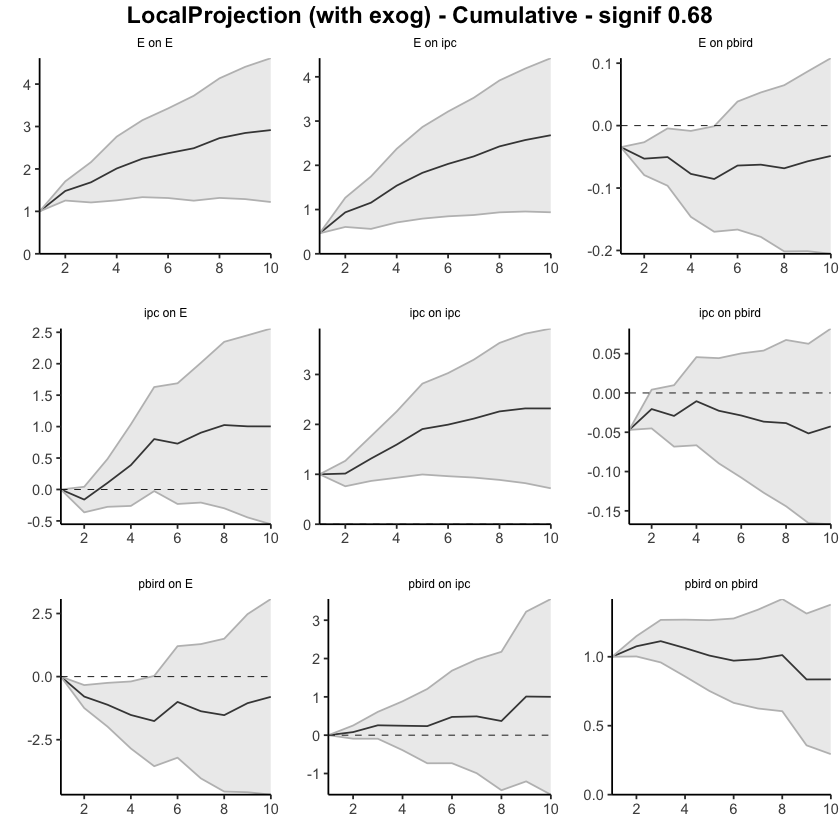

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Pmaíz_USA"), fixed_lags = 2, horizons=10, signif = 0.68, cumulative = TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,5,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.00000000,0.000000000,0.00000000
24,ipc,E,2,-0.25357235,-0.586310687,0.07916599
25,ipc,E,3,0.28893494,0.042271957,0.53559792
26,ipc,E,4,0.37642318,0.003007917,0.74983845
27,ipc,E,5,0.31298028,-0.097230429,0.72319099
28,ipc,E,6,-0.16345227,-0.427288954,0.10038441
29,ipc,E,7,0.21014578,-0.056663093,0.47695465
30,ipc,E,8,0.16101261,-0.219161598,0.54118682
31,ipc,E,9,-0.08383831,-0.406111446,0.23843483


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.0000000,0.0000000
46,pbird,E,2,-0.7577933,-1.6228491,0.1072625
47,pbird,E,3,-0.2845500,-1.1096154,0.5405154
48,pbird,E,4,-0.4347630,-1.3369088,0.4673828
49,pbird,E,5,-0.2685947,-1.2169375,0.6797480
50,pbird,E,6,0.9689780,0.1180144,1.8199416
51,pbird,E,7,-0.3446374,-1.2453168,0.5560420
52,pbird,E,8,-0.2629962,-1.0598600,0.5338676
53,pbird,E,9,0.4508760,-0.6147133,1.5164652


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4383516,0.43835162,0.4383516
2,E,ipc,2,0.4633629,-0.06791721,0.9946431
3,E,ipc,3,0.2089910,-0.12524031,0.5432224
4,E,ipc,4,0.4036490,0.08584495,0.7214531
5,E,ipc,5,0.2805628,-0.10626391,0.6673896
6,E,ipc,6,0.1908474,-0.06807572,0.4497705
7,E,ipc,7,0.1762900,-0.05446351,0.4070435
8,E,ipc,8,0.2498132,-0.02262170,0.5222482
9,E,ipc,9,0.1502358,-0.15361215,0.4540838


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.0000000,0.0000000
57,pbird,ipc,2,0.14589518,-0.1780105,0.4698009
58,pbird,ipc,3,0.22168706,-0.1893076,0.6326817
59,pbird,ipc,4,0.05750559,-0.4414422,0.5564533
60,pbird,ipc,5,-0.03535330,-0.6784989,0.6077923
61,pbird,ipc,6,0.32007835,-0.1320633,0.7722200
62,pbird,ipc,7,0.08612203,-0.4449994,0.6172434
63,pbird,ipc,8,-0.25240714,-0.8873502,0.3825359
64,pbird,ipc,9,0.69943197,-0.1722381,1.5711021


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.032082026,-0.03208203,-0.03208203
13,E,pbird,2,-0.021158855,-0.06099593,0.01867822
14,E,pbird,3,-0.002074268,-0.03386594,0.02971740
15,E,pbird,4,-0.029635661,-0.07917737,0.01990605
16,E,pbird,5,-0.008226521,-0.03817879,0.02172575
17,E,pbird,6,0.020962122,-0.01628024,0.05820449
18,E,pbird,7,-0.001594220,-0.02225521,0.01906677
19,E,pbird,8,-0.010102753,-0.04194483,0.02173933
20,E,pbird,9,0.010880852,-0.01426128,0.03602298


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.043190423,-0.04319042,-0.0431904229
35,ipc,pbird,2,0.014355056,-0.01905105,0.0477611580
36,ipc,pbird,3,-0.026087262,-0.04389620,-0.0082783284
37,ipc,pbird,4,0.016050275,-0.02795636,0.0600569095
38,ipc,pbird,5,-0.017286395,-0.04123524,0.0066624556
39,ipc,pbird,6,-0.011188713,-0.03885887,0.0164814418
40,ipc,pbird,7,-0.012923911,-0.03156581,0.0057179915
41,ipc,pbird,8,-0.019901746,-0.04839213,0.0085886399
42,ipc,pbird,9,-0.012863513,-0.03712922,0.0114021981


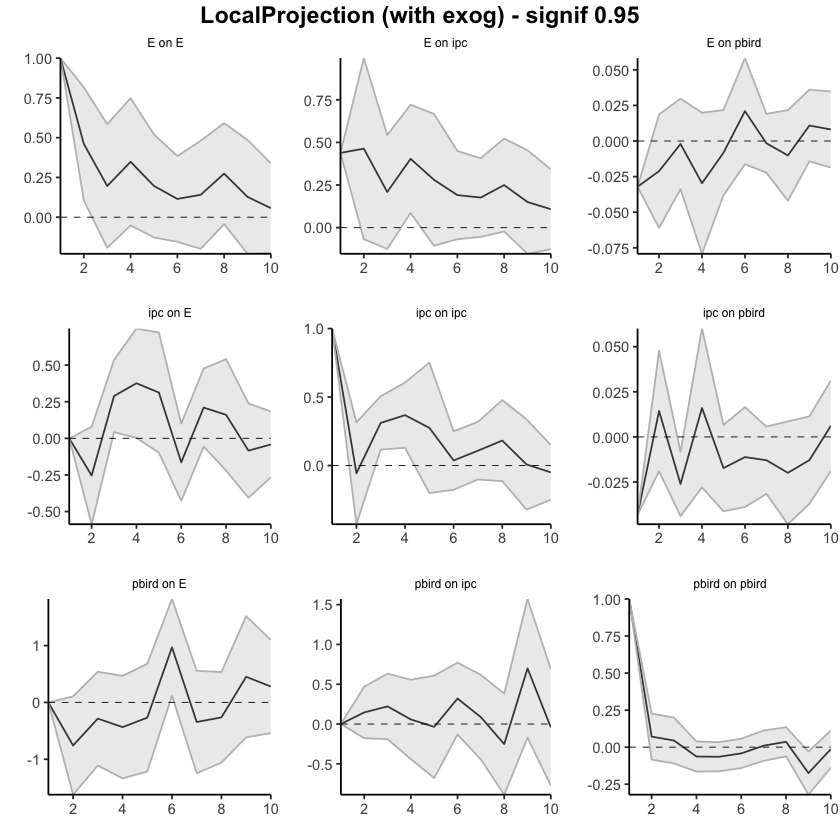

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Pmaíz_USA"), fixed_lags = 5, horizons=10, signif = 0.95)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,5,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.00000000,0.00000000,0.00000000
24,ipc,E,2,-0.25357235,-0.42333681,-0.08380789
25,ipc,E,3,0.28893494,0.16308648,0.41478340
26,ipc,E,4,0.37642318,0.18590519,0.56694118
27,ipc,E,5,0.31298028,0.10368910,0.52227146
28,ipc,E,6,-0.16345227,-0.29806282,-0.02884172
29,ipc,E,7,0.21014578,0.07401880,0.34627275
30,ipc,E,8,0.16101261,-0.03295382,0.35497905
31,ipc,E,9,-0.08383831,-0.24826338,0.08058676


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.00000000,0.00000000
46,pbird,E,2,-0.7577933,-1.19914827,-0.31643829
47,pbird,E,3,-0.2845500,-0.70550174,0.13640173
48,pbird,E,4,-0.4347630,-0.89504149,0.02551544
49,pbird,E,5,-0.2685947,-0.75244308,0.21525359
50,pbird,E,6,0.9689780,0.53481290,1.40314311
51,pbird,E,7,-0.3446374,-0.80416766,0.11489295
52,pbird,E,8,-0.2629962,-0.66955940,0.14356693
53,pbird,E,9,0.4508760,-0.09279201,0.99454394


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4383516,0.438351625,0.4383516
2,E,ipc,2,0.4633629,0.192301643,0.7344242
3,E,ipc,3,0.2089910,0.038464834,0.3795172
4,E,ipc,4,0.4036490,0.241504099,0.5657940
5,E,ipc,5,0.2805628,0.083202248,0.4779234
6,E,ipc,6,0.1908474,0.058743755,0.3229510
7,E,ipc,7,0.1762900,0.058558607,0.2940213
8,E,ipc,8,0.2498132,0.110815823,0.3888107
9,E,ipc,9,0.1502358,-0.004788652,0.3052603


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.00000000,0.0000000
57,pbird,ipc,2,0.14589518,-0.01936283,0.3111532
58,pbird,ipc,3,0.22168706,0.01199590,0.4313782
59,pbird,ipc,4,0.05750559,-0.19705959,0.3120708
60,pbird,ipc,5,-0.03535330,-0.36348880,0.2927822
61,pbird,ipc,6,0.32007835,0.08939383,0.5507629
62,pbird,ipc,7,0.08612203,-0.18485827,0.3571023
63,pbird,ipc,8,-0.25240714,-0.57635767,0.0715434
64,pbird,ipc,9,0.69943197,0.25470233,1.1441616


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.032082026,-0.032082026,-0.0320820259
13,E,pbird,2,-0.021158855,-0.041483895,-0.0008338146
14,E,pbird,3,-0.002074268,-0.018294509,0.0141459721
15,E,pbird,4,-0.029635661,-0.054912044,-0.0043592773
16,E,pbird,5,-0.008226521,-0.023508292,0.0070552506
17,E,pbird,6,0.020962122,0.001960915,0.0399633283
18,E,pbird,7,-0.001594220,-0.012135543,0.0089471027
19,E,pbird,8,-0.010102753,-0.026348712,0.0061432052
20,E,pbird,9,0.010880852,-0.001946765,0.0237084688


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.043190423,-0.043190423,-0.0431904229
35,ipc,pbird,2,0.014355056,-0.002688874,0.0313989854
36,ipc,pbird,3,-0.026087262,-0.035173452,-0.0170010712
37,ipc,pbird,4,0.016050275,-0.006402090,0.0385026393
38,ipc,pbird,5,-0.017286395,-0.029505196,-0.0050675934
39,ipc,pbird,6,-0.011188713,-0.025306139,0.0029287130
40,ipc,pbird,7,-0.012923911,-0.022435086,-0.0034127363
41,ipc,pbird,8,-0.019901746,-0.034437657,-0.0053658348
42,ipc,pbird,9,-0.012863513,-0.025243978,-0.0004830481


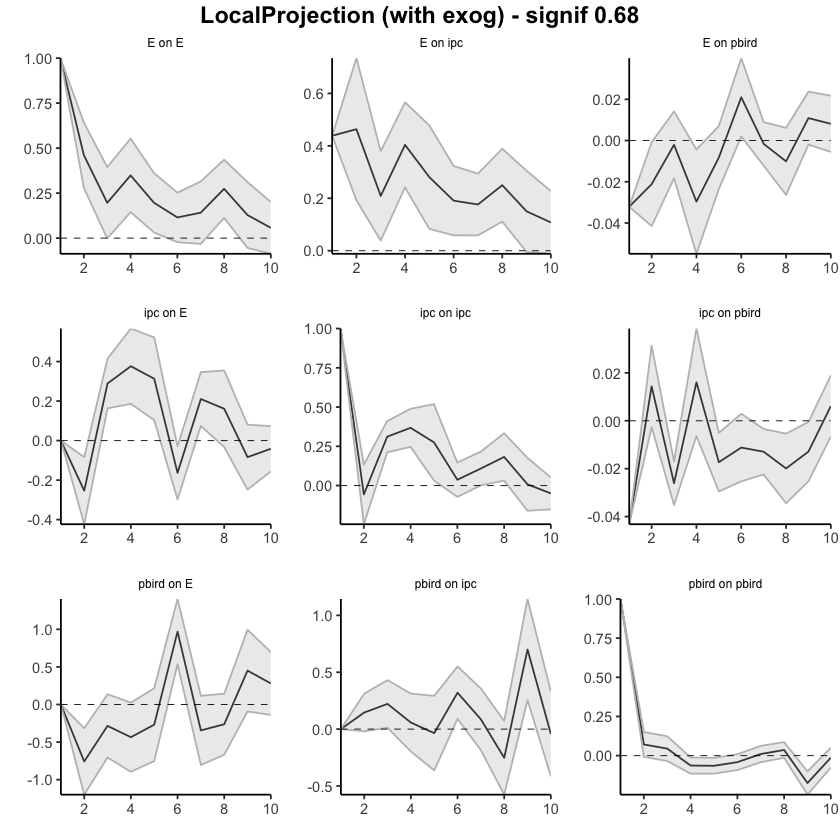

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Pmaíz_USA"), fixed_lags = 5, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,5,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.00000000,0.0000000,0.00000000
24,ipc,E,2,-0.25357235,-0.5863107,0.07916599
25,ipc,E,3,0.03536259,-0.5440387,0.61476392
26,ipc,E,4,0.41178578,-0.5410308,1.36460237
27,ipc,E,5,0.72476606,-0.6382612,2.08779336
28,ipc,E,6,0.56131379,-1.0655502,2.18817777
29,ipc,E,7,0.77145957,-1.1222133,2.66513242
30,ipc,E,8,0.93247218,-1.3413749,3.20631924
31,ipc,E,9,0.84863387,-1.7474863,3.44475407


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.0000000
46,pbird,E,2,-0.7577933,-1.622849,0.1072625
47,pbird,E,3,-1.0423433,-2.732464,0.6477779
48,pbird,E,4,-1.4771063,-4.069373,1.1151607
49,pbird,E,5,-1.7457011,-5.286311,1.7949086
50,pbird,E,6,-0.7767231,-5.168296,3.6148503
51,pbird,E,7,-1.1213604,-6.413613,4.1708923
52,pbird,E,8,-1.3843567,-7.473473,4.7047599
53,pbird,E,9,-0.9334807,-8.088186,6.2212251


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4383516,0.43835162,0.4383516
2,E,ipc,2,0.9017146,0.37043442,1.4329947
3,E,ipc,3,1.1107056,0.24519411,1.9762171
4,E,ipc,4,1.5143546,0.33103906,2.6976702
5,E,ipc,5,1.7949175,0.22477515,3.3650598
6,E,ipc,6,1.9857648,0.15669943,3.8148303
7,E,ipc,7,2.1620548,0.10223592,4.2218737
8,E,ipc,8,2.4118681,0.07961422,4.7441219
9,E,ipc,9,2.5621039,-0.07399793,5.1982057


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.0000000,0.0000000,0.0000000
57,pbird,ipc,2,0.1458952,-0.1780105,0.4698009
58,pbird,ipc,3,0.3675822,-0.3673181,1.1024826
59,pbird,ipc,4,0.4250878,-0.8087603,1.6589360
60,pbird,ipc,5,0.3897345,-1.4872592,2.2667282
61,pbird,ipc,6,0.7098129,-1.6193225,3.0389482
62,pbird,ipc,7,0.7959349,-2.0643218,3.6561916
63,pbird,ipc,8,0.5435278,-2.9516720,4.0387276
64,pbird,ipc,9,1.2429597,-3.1239101,5.6098296


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03208203,-0.03208203,-0.03208203
13,E,pbird,2,-0.05324088,-0.09307796,-0.01340380
14,E,pbird,3,-0.05531515,-0.12694390,0.01631360
15,E,pbird,4,-0.08495081,-0.20612127,0.03621965
16,E,pbird,5,-0.09317733,-0.24430006,0.05794540
17,E,pbird,6,-0.07221521,-0.26058031,0.11614989
18,E,pbird,7,-0.07380943,-0.28283552,0.13521666
19,E,pbird,8,-0.08391218,-0.32478035,0.15695599
20,E,pbird,9,-0.07303133,-0.33904163,0.19297897


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.04319042,-0.04319042,-0.043190423
35,ipc,pbird,2,-0.02883537,-0.06224147,0.004570735
36,ipc,pbird,3,-0.05492263,-0.10613766,-0.003707593
37,ipc,pbird,4,-0.03887235,-0.13409403,0.056349316
38,ipc,pbird,5,-0.05615875,-0.17532927,0.063011772
39,ipc,pbird,6,-0.06734746,-0.21418814,0.079493214
40,ipc,pbird,7,-0.08027137,-0.24575395,0.085211205
41,ipc,pbird,8,-0.10017312,-0.29414608,0.093799845
42,ipc,pbird,9,-0.11303663,-0.33127531,0.105202043


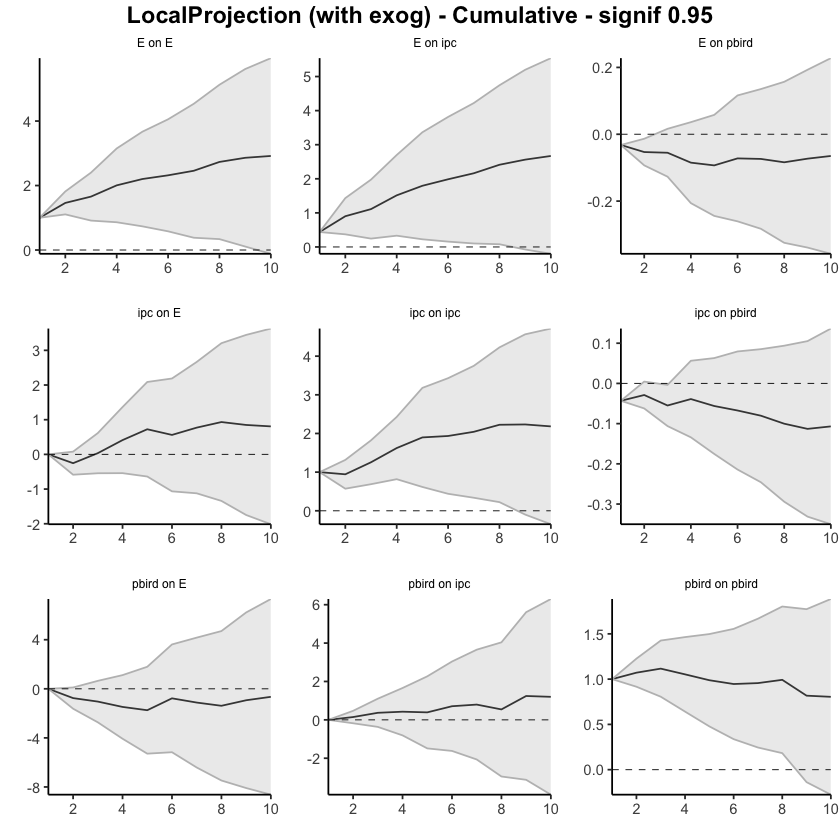

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Pmaíz_USA"), fixed_lags = 5, horizons=10, signif = 0.95, cumulative = TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,5,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.00000000,0.00000000,0.00000000
24,ipc,E,2,-0.25357235,-0.42333681,-0.08380789
25,ipc,E,3,0.03536259,-0.26025033,0.33097551
26,ipc,E,4,0.41178578,-0.07434514,0.89791669
27,ipc,E,5,0.72476606,0.02934397,1.42018815
28,ipc,E,6,0.56131379,-0.26871886,1.39134643
29,ipc,E,7,0.77145957,-0.19470005,1.73761919
30,ipc,E,8,0.93247218,-0.22765388,2.09259823
31,ipc,E,9,0.84863387,-0.47591726,2.17318499


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.00000000
46,pbird,E,2,-0.7577933,-1.199148,-0.31643829
47,pbird,E,3,-1.0423433,-1.904650,-0.18003656
48,pbird,E,4,-1.4771063,-2.799692,-0.15452112
49,pbird,E,5,-1.7457011,-3.552135,0.06073246
50,pbird,E,6,-0.7767231,-3.017322,1.46387558
51,pbird,E,7,-1.1213604,-3.821489,1.57876852
52,pbird,E,8,-1.3843567,-4.491049,1.72233545
53,pbird,E,9,-0.9334807,-4.583841,2.71687939


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4383516,0.4383516,0.4383516
2,E,ipc,2,0.9017146,0.6306533,1.1727759
3,E,ipc,3,1.1107056,0.6691181,1.5522931
4,E,ipc,4,1.5143546,0.9106222,2.1180871
5,E,ipc,5,1.7949175,0.9938244,2.5960105
6,E,ipc,6,1.9857648,1.0525682,2.9189615
7,E,ipc,7,2.1620548,1.1111268,3.2129828
8,E,ipc,8,2.4118681,1.2219426,3.6017935
9,E,ipc,9,2.5621039,1.2171540,3.9070538


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.0000000,0.000000000,0.0000000
57,pbird,ipc,2,0.1458952,-0.019362832,0.3111532
58,pbird,ipc,3,0.3675822,-0.007366934,0.7425314
59,pbird,ipc,4,0.4250878,-0.204426520,1.0546022
60,pbird,ipc,5,0.3897345,-0.567915315,1.3473844
61,pbird,ipc,6,0.7098129,-0.478521484,1.8981472
62,pbird,ipc,7,0.7959349,-0.663379758,2.2552496
63,pbird,ipc,8,0.5435278,-1.239737433,2.3267930
64,pbird,ipc,9,1.2429597,-0.985035099,3.4709546


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03208203,-0.03208203,-0.03208203
13,E,pbird,2,-0.05324088,-0.07356592,-0.03291584
14,E,pbird,3,-0.05531515,-0.09186043,-0.01876987
15,E,pbird,4,-0.08495081,-0.14677247,-0.02312915
16,E,pbird,5,-0.09317733,-0.17028077,-0.01607390
17,E,pbird,6,-0.07221521,-0.16831985,0.02388943
18,E,pbird,7,-0.07380943,-0.18045539,0.03283654
19,E,pbird,8,-0.08391218,-0.20680411,0.03897974
20,E,pbird,9,-0.07303133,-0.20875087,0.06268821


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.04319042,-0.04319042,-0.043190423
35,ipc,pbird,2,-0.02883537,-0.04587930,-0.011791437
36,ipc,pbird,3,-0.05492263,-0.08105275,-0.028792509
37,ipc,pbird,4,-0.03887235,-0.08745484,0.009710131
38,ipc,pbird,5,-0.05615875,-0.11696004,0.004642537
39,ipc,pbird,6,-0.06734746,-0.14226617,0.007571250
40,ipc,pbird,7,-0.08027137,-0.16470126,0.004158514
41,ipc,pbird,8,-0.10017312,-0.19913892,-0.001207321
42,ipc,pbird,9,-0.11303663,-0.22438289,-0.001690369


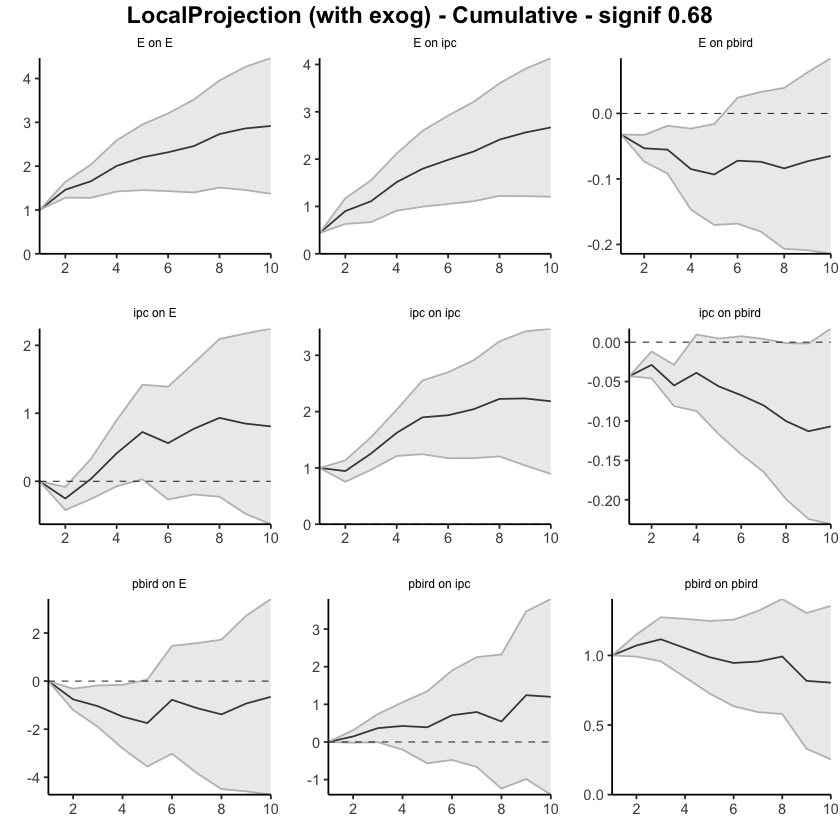

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Pmaíz_USA"), fixed_lags = 5, horizons=10, signif = 0.68, cumulative = TRUE)

### Ptrigo_USA 1950 a 2023 - 1 exógena y el resto endógenas - Selected orders: 2 y 5

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.00000000,0.00000000,0.0000000
24,ipc,E,2,-0.16615833,-0.59650871,0.2641921
25,ipc,E,3,0.26367369,-0.11642395,0.6437713
26,ipc,E,4,0.29419798,-0.28045343,0.8688494
27,ipc,E,5,0.43491930,0.06238401,0.8074546
28,ipc,E,6,-0.07875482,-0.35308808,0.1955784
29,ipc,E,7,0.18309645,-0.10513296,0.4713259
30,ipc,E,8,0.13720398,-0.29516989,0.5695779
31,ipc,E,9,-0.02130173,-0.26600887,0.2234054


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.00000000,0.00000000,0.00000000
46,pbird,E,2,-0.80509059,-1.67771502,0.06753383
47,pbird,E,3,-0.36016518,-1.17864766,0.45831730
48,pbird,E,4,-0.43162769,-1.39307729,0.52982192
49,pbird,E,5,-0.22651717,-1.07330424,0.62026990
50,pbird,E,6,0.70707909,-0.08462424,1.49878241
51,pbird,E,7,-0.35078452,-1.21302539,0.51145634
52,pbird,E,8,-0.15123523,-0.85758510,0.55511464
53,pbird,E,9,0.44662577,-0.54213856,1.43539010


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4631937,0.46319373,0.4631937
2,E,ipc,2,0.4773710,-0.22843778,1.1831798
3,E,ipc,3,0.2214035,-0.24299511,0.6858020
4,E,ipc,4,0.3847023,-0.08996115,0.8593657
5,E,ipc,5,0.2868394,-0.12828986,0.7019686
6,E,ipc,6,0.1982823,-0.09174015,0.4883048
7,E,ipc,7,0.1691576,-0.11174335,0.4500585
8,E,ipc,8,0.2263480,-0.10905046,0.5617466
9,E,ipc,9,0.1416740,-0.10824550,0.3915935


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.0000000,0.0000000
57,pbird,ipc,2,0.08492323,-0.2671219,0.4369684
58,pbird,ipc,3,0.12873311,-0.1975232,0.4549894
59,pbird,ipc,4,-0.03411420,-0.6284172,0.5601888
60,pbird,ipc,5,0.01561168,-0.5798091,0.6110325
61,pbird,ipc,6,0.20304620,-0.2633420,0.6694344
62,pbird,ipc,7,0.02837955,-0.5151045,0.5718636
63,pbird,ipc,8,-0.11284032,-0.7208315,0.4951509
64,pbird,ipc,9,0.61049617,-0.1407052,1.3616975


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.0343282408,-0.03432824,-0.03432824
13,E,pbird,2,-0.0182412551,-0.07201301,0.03553050
14,E,pbird,3,0.0022668999,-0.03505209,0.03958589
15,E,pbird,4,-0.0263967925,-0.07080007,0.01800648
16,E,pbird,5,-0.0080498880,-0.03901059,0.02291082
17,E,pbird,6,0.0216862441,-0.01258651,0.05595900
18,E,pbird,7,0.0006359569,-0.02541450,0.02668641
19,E,pbird,8,-0.0060608737,-0.03997757,0.02785583
20,E,pbird,9,0.0116970415,-0.00943755,0.03283163


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.050913416,-0.05091342,-0.050913416
35,ipc,pbird,2,0.026953584,-0.02300877,0.076915934
36,ipc,pbird,3,-0.007375174,-0.03566688,0.020916536
37,ipc,pbird,4,0.017089834,-0.01503128,0.049210945
38,ipc,pbird,5,-0.013092067,-0.03493708,0.008752943
39,ipc,pbird,6,-0.004440564,-0.02729378,0.018412648
40,ipc,pbird,7,-0.007619570,-0.02934629,0.014107153
41,ipc,pbird,8,-0.002637457,-0.03217973,0.026904818
42,ipc,pbird,9,-0.014085028,-0.02979475,0.001624691


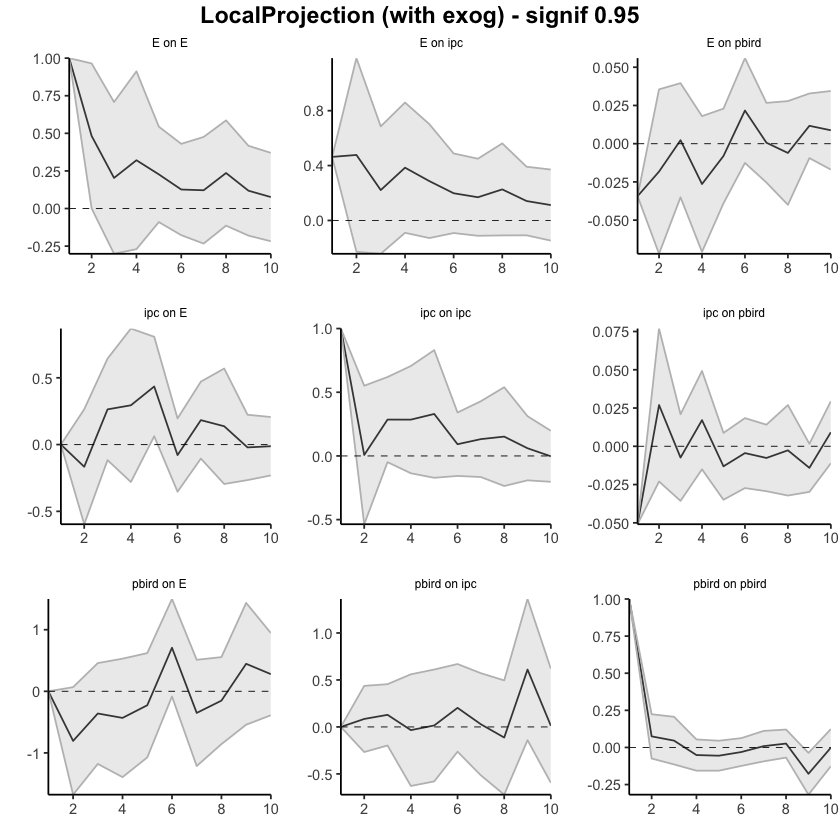

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Ptrigo_USA"), fixed_lags = 2, horizons=10, signif = 0.95)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.00000000,0.000000000,0.00000000
24,ipc,E,2,-0.16615833,-0.385724851,0.05340819
25,ipc,E,3,0.26367369,0.069746321,0.45760105
26,ipc,E,4,0.29419798,0.001008487,0.58738747
27,ipc,E,5,0.43491930,0.244850272,0.62498833
28,ipc,E,6,-0.07875482,-0.218720767,0.06121113
29,ipc,E,7,0.18309645,0.036040632,0.33015227
30,ipc,E,8,0.13720398,-0.083394936,0.35780289
31,ipc,E,9,-0.02130173,-0.146152313,0.10354885


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.00000000,0.00000000,0.00000000
46,pbird,E,2,-0.80509059,-1.25030714,-0.35987405
47,pbird,E,3,-0.36016518,-0.77775828,0.05742792
48,pbird,E,4,-0.43162769,-0.92216320,0.05890783
49,pbird,E,5,-0.22651717,-0.65855139,0.20551705
50,pbird,E,6,0.70707909,0.30314882,1.11100935
51,pbird,E,7,-0.35078452,-0.79070333,0.08913428
52,pbird,E,8,-0.15123523,-0.51161782,0.20914736
53,pbird,E,9,0.44662577,-0.05784582,0.95109737


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4631937,0.46319373,0.4631937
2,E,ipc,2,0.4773710,0.11726450,0.8374776
3,E,ipc,3,0.2214035,-0.01553458,0.4583415
4,E,ipc,4,0.3847023,0.14252706,0.6268775
5,E,ipc,5,0.2868394,0.07503874,0.4986400
6,E,ipc,6,0.1982823,0.05031168,0.3462530
7,E,ipc,7,0.1691576,0.02584079,0.3124744
8,E,ipc,8,0.2263480,0.05522636,0.3974697
9,E,ipc,9,0.1416740,0.01416405,0.2691839


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.00000000,0.0000000
57,pbird,ipc,2,0.08492323,-0.09469165,0.2645381
58,pbird,ipc,3,0.12873311,-0.03772419,0.2951904
59,pbird,ipc,4,-0.03411420,-0.33733003,0.2691016
60,pbird,ipc,5,0.01561168,-0.28817445,0.3193978
61,pbird,ipc,6,0.20304620,-0.03490697,0.4409994
62,pbird,ipc,7,0.02837955,-0.24890823,0.3056673
63,pbird,ipc,8,-0.11284032,-0.42303991,0.1973593
64,pbird,ipc,9,0.61049617,0.22723018,0.9937622


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.0343282408,-0.0343282408,-0.034328241
13,E,pbird,2,-0.0182412551,-0.0456758236,0.009193313
14,E,pbird,3,0.0022668999,-0.0167734030,0.021307203
15,E,pbird,4,-0.0263967925,-0.0490515247,-0.003742060
16,E,pbird,5,-0.0080498880,-0.0238461650,0.007746389
17,E,pbird,6,0.0216862441,0.0042001453,0.039172343
18,E,pbird,7,0.0006359569,-0.0126550923,0.013927006
19,E,pbird,8,-0.0060608737,-0.0233653120,0.011243565
20,E,pbird,9,0.0116970415,0.0009140866,0.022479996


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.050913416,-0.0509134158,-0.050913416
35,ipc,pbird,2,0.026953584,0.0014625888,0.052444579
36,ipc,pbird,3,-0.007375174,-0.0218097206,0.007059372
37,ipc,pbird,4,0.017089834,0.0007015128,0.033478156
38,ipc,pbird,5,-0.013092067,-0.0242374808,-0.001946654
39,ipc,pbird,6,-0.004440564,-0.0161003658,0.007219238
40,ipc,pbird,7,-0.007619570,-0.0187046326,0.003465493
41,ipc,pbird,8,-0.002637457,-0.0177100471,0.012435132
42,ipc,pbird,9,-0.014085028,-0.0221001905,-0.006069865


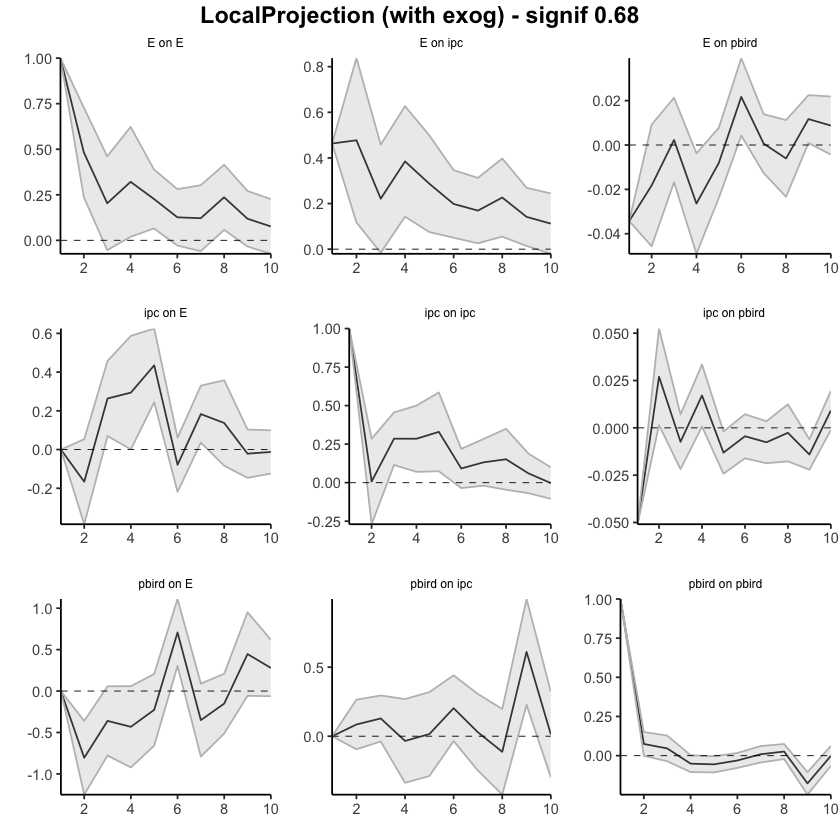

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Ptrigo_USA"), fixed_lags = 2, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.00000000,0.0000000,0.0000000
24,ipc,E,2,-0.16615833,-0.5965087,0.2641921
25,ipc,E,3,0.09751536,-0.7129327,0.9079634
26,ipc,E,4,0.39171334,-0.9933861,1.7768128
27,ipc,E,5,0.82663263,-0.9310021,2.5842674
28,ipc,E,6,0.74787782,-1.2840902,2.7798458
29,ipc,E,7,0.93097427,-1.3892231,3.2511717
30,ipc,E,8,1.06817825,-1.6843930,3.8207495
31,ipc,E,9,1.04687652,-1.9504019,4.0441549


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.00000000
46,pbird,E,2,-0.8050906,-1.677715,0.06753383
47,pbird,E,3,-1.1652558,-2.856363,0.52585113
48,pbird,E,4,-1.5968835,-4.249440,1.05567306
49,pbird,E,5,-1.8234006,-5.322744,1.67594296
50,pbird,E,6,-1.1163215,-5.407368,3.17472537
51,pbird,E,7,-1.4671061,-6.620394,3.68618171
52,pbird,E,8,-1.6183413,-7.477979,4.24129635
53,pbird,E,9,-1.1717155,-8.020118,5.67668646


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4631937,0.463193727,0.4631937
2,E,ipc,2,0.9405648,0.234755950,1.6463736
3,E,ipc,3,1.1619682,-0.008239157,2.3321756
4,E,ipc,4,1.5466705,-0.098200306,3.1915413
5,E,ipc,5,1.8335099,-0.226490170,3.8935099
6,E,ipc,6,2.0317922,-0.318230322,4.3818148
7,E,ipc,7,2.2009498,-0.429973668,4.8318733
8,E,ipc,8,2.4272979,-0.539024123,5.3936199
9,E,ipc,9,2.5689719,-0.647269624,5.7852134


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.0000000,0.0000000
57,pbird,ipc,2,0.08492323,-0.2671219,0.4369684
58,pbird,ipc,3,0.21365634,-0.4646451,0.8919578
59,pbird,ipc,4,0.17954215,-1.0930624,1.4521467
60,pbird,ipc,5,0.19515383,-1.6728715,2.0631792
61,pbird,ipc,6,0.39820003,-1.9362135,2.7326136
62,pbird,ipc,7,0.42657958,-2.4513180,3.3044772
63,pbird,ipc,8,0.31373926,-3.1721495,3.7996280
64,pbird,ipc,9,0.92423543,-3.3128547,5.1613255


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03432824,-0.03432824,-0.034328241
13,E,pbird,2,-0.05256950,-0.10634125,0.001202258
14,E,pbird,3,-0.05030260,-0.14139334,0.040788152
15,E,pbird,4,-0.07669939,-0.21219341,0.058794634
16,E,pbird,5,-0.08474928,-0.25120400,0.081705450
17,E,pbird,6,-0.06306303,-0.26379051,0.137664447
18,E,pbird,7,-0.06242708,-0.28920501,0.164350860
19,E,pbird,8,-0.06848795,-0.32918258,0.192206686
20,E,pbird,9,-0.05679091,-0.33862013,0.225038319


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.05091342,-0.05091342,-0.05091342
35,ipc,pbird,2,-0.02395983,-0.07392218,0.02600252
36,ipc,pbird,3,-0.03133501,-0.10958907,0.04691905
37,ipc,pbird,4,-0.01424517,-0.12462034,0.09613000
38,ipc,pbird,5,-0.02733724,-0.15955742,0.10488294
39,ipc,pbird,6,-0.03177780,-0.18685120,0.12329559
40,ipc,pbird,7,-0.03939737,-0.21619749,0.13740274
41,ipc,pbird,8,-0.04203483,-0.24837722,0.16430756
42,ipc,pbird,9,-0.05611986,-0.27817197,0.16593225


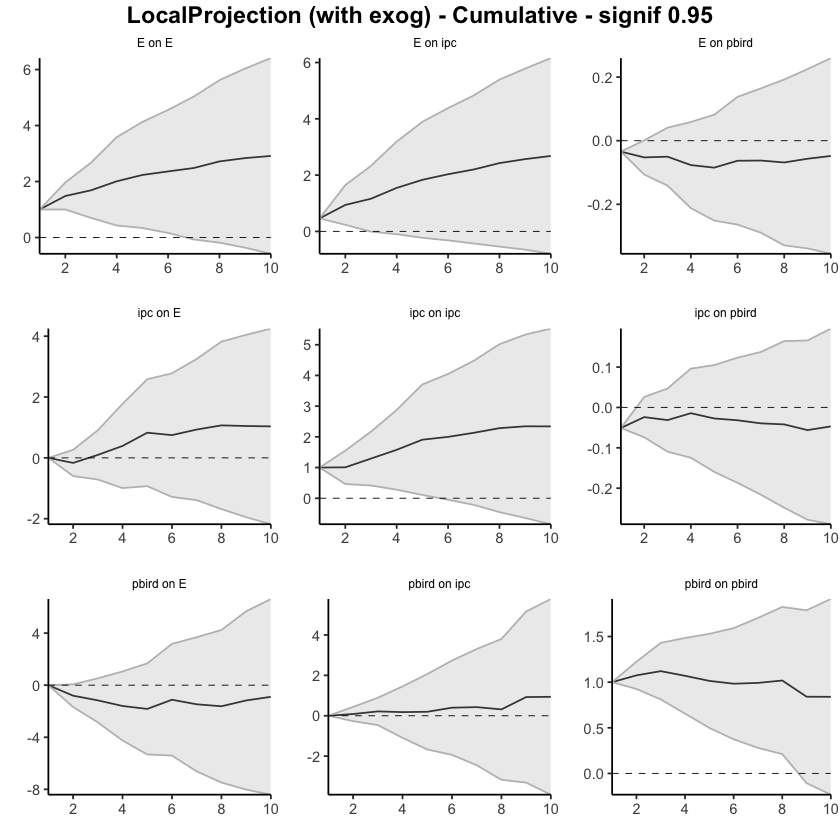

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Ptrigo_USA"), fixed_lags = 2, horizons=10, signif = 0.95, cumulative = TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
2,NA,NaN,NA,2,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.00000000,0.00000000,0.00000000
24,ipc,E,2,-0.16615833,-0.38572485,0.05340819
25,ipc,E,3,0.09751536,-0.31597853,0.51100924
26,ipc,E,4,0.39171334,-0.31497004,1.09839671
27,ipc,E,5,0.82663263,-0.07011977,1.72338504
28,ipc,E,6,0.74787782,-0.28884054,1.78459617
29,ipc,E,7,0.93097427,-0.25279991,2.11474844
30,ipc,E,8,1.06817825,-0.33619484,2.47255134
31,ipc,E,9,1.04687652,-0.48234716,2.57610019


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.00000000
46,pbird,E,2,-0.8050906,-1.250307,-0.35987405
47,pbird,E,3,-1.1652558,-2.028065,-0.30244613
48,pbird,E,4,-1.5968835,-2.950229,-0.24353830
49,pbird,E,5,-1.8234006,-3.608780,-0.03802125
50,pbird,E,6,-1.1163215,-3.305631,1.07298811
51,pbird,E,7,-1.4671061,-4.096335,1.16212239
52,pbird,E,8,-1.6183413,-4.607952,1.37126975
53,pbird,E,9,-1.1717155,-4.665798,2.32236712


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4631937,0.4631937,0.4631937
2,E,ipc,2,0.9405648,0.5804582,1.3006713
3,E,ipc,3,1.1619682,0.5649236,1.7590128
4,E,ipc,4,1.5466705,0.7074507,2.3858903
5,E,ipc,5,1.8335099,0.7824894,2.8845303
6,E,ipc,6,2.0317922,0.8328011,3.2307833
7,E,ipc,7,2.2009498,0.8586419,3.5432577
8,E,ipc,8,2.4272979,0.9138683,3.9407275
9,E,ipc,9,2.5689719,0.9280323,4.2099114


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.00000000,0.0000000
57,pbird,ipc,2,0.08492323,-0.09469165,0.2645381
58,pbird,ipc,3,0.21365634,-0.13241584,0.5597285
59,pbird,ipc,4,0.17954215,-0.46974587,0.8288302
60,pbird,ipc,5,0.19515383,-0.75792032,1.1482280
61,pbird,ipc,6,0.39820003,-0.79282729,1.5892273
62,pbird,ipc,7,0.42657958,-1.04173552,1.8948947
63,pbird,ipc,8,0.31373926,-1.46477542,2.0922539
64,pbird,ipc,9,0.92423543,-1.23754524,3.0860161


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03432824,-0.03432824,-0.0343282408
13,E,pbird,2,-0.05256950,-0.08000406,-0.0251349274
14,E,pbird,3,-0.05030260,-0.09677747,-0.0038277248
15,E,pbird,4,-0.07669939,-0.14582899,-0.0075697850
16,E,pbird,5,-0.08474928,-0.16967516,0.0001766041
17,E,pbird,6,-0.06306303,-0.16547501,0.0393489470
18,E,pbird,7,-0.06242708,-0.17813010,0.0532759530
19,E,pbird,8,-0.06848795,-0.20149542,0.0645195176
20,E,pbird,9,-0.05679091,-0.20058133,0.0869995140


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.05091342,-0.05091342,-0.050913416
35,ipc,pbird,2,-0.02395983,-0.04945083,0.001531163
36,ipc,pbird,3,-0.03133501,-0.07126055,0.008590535
37,ipc,pbird,4,-0.01424517,-0.07055903,0.042068691
38,ipc,pbird,5,-0.02733724,-0.09479652,0.040122037
39,ipc,pbird,6,-0.03177780,-0.11089688,0.047341275
40,ipc,pbird,7,-0.03939737,-0.12960151,0.050806767
41,ipc,pbird,8,-0.04203483,-0.14731156,0.063241899
42,ipc,pbird,9,-0.05611986,-0.16941175,0.057172034


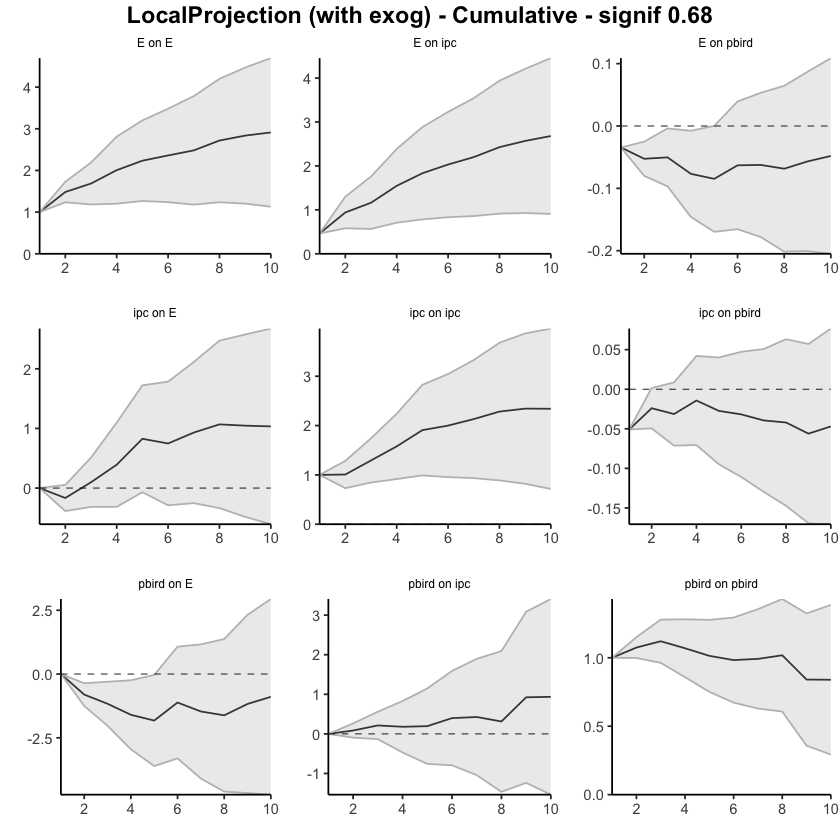

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Ptrigo_USA"), fixed_lags = 2, horizons=10, signif = 0.68, cumulative = TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,5,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.000000000,0.00000000,0.00000000
24,ipc,E,2,-0.243433883,-0.58655675,0.09968899
25,ipc,E,3,0.296093678,0.05249249,0.53969486
26,ipc,E,4,0.351731732,-0.01063157,0.71409503
27,ipc,E,5,0.341345329,-0.08811245,0.77080310
28,ipc,E,6,-0.158505009,-0.45556959,0.13855957
29,ipc,E,7,0.145319197,-0.15188546,0.44252385
30,ipc,E,8,0.099667493,-0.27871866,0.47805365
31,ipc,E,9,-0.103384020,-0.41463130,0.20786326


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.00000000,0.00000000,0.00000000
46,pbird,E,2,-0.79741724,-1.63699836,0.04216387
47,pbird,E,3,-0.23798580,-1.08170180,0.60573020
48,pbird,E,4,-0.46421800,-1.40547472,0.47703873
49,pbird,E,5,-0.16919373,-1.01122402,0.67283656
50,pbird,E,6,0.86330791,0.03127724,1.69533857
51,pbird,E,7,-0.31339281,-1.18253600,0.55575039
52,pbird,E,8,-0.17640186,-0.95705941,0.60425569
53,pbird,E,9,0.45592442,-0.60384694,1.51569577


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.44126099,0.44126099,0.4412610
2,E,ipc,2,0.47014263,-0.11169615,1.0519814
3,E,ipc,3,0.21938910,-0.10778950,0.5465677
4,E,ipc,4,0.40809522,0.05957440,0.7566160
5,E,ipc,5,0.27829618,-0.09773994,0.6543323
6,E,ipc,6,0.19370950,-0.05784197,0.4452610
7,E,ipc,7,0.16889639,-0.08744645,0.4252392
8,E,ipc,8,0.23402299,-0.05087197,0.5189179
9,E,ipc,9,0.13892575,-0.13818983,0.4160413


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.0000000,0.0000000
57,pbird,ipc,2,0.10917529,-0.2235291,0.4418797
58,pbird,ipc,3,0.24670342,-0.1327860,0.6261928
59,pbird,ipc,4,-0.02133452,-0.6289332,0.5862642
60,pbird,ipc,5,0.07043372,-0.5166659,0.6575333
61,pbird,ipc,6,0.27785663,-0.1968821,0.7525954
62,pbird,ipc,7,0.05283611,-0.4553906,0.5610628
63,pbird,ipc,8,-0.13067010,-0.7005559,0.4392157
64,pbird,ipc,9,0.65842430,-0.2621892,1.5790378


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.031327349,-0.03132735,-0.03132735
13,E,pbird,2,-0.020825887,-0.06049706,0.01884528
14,E,pbird,3,-0.002289673,-0.03247540,0.02789605
15,E,pbird,4,-0.028884867,-0.07494435,0.01717461
16,E,pbird,5,-0.008032287,-0.03962823,0.02356366
17,E,pbird,6,0.019973817,-0.01502042,0.05496806
18,E,pbird,7,-0.001360540,-0.02372013,0.02099905
19,E,pbird,8,-0.007888819,-0.03889669,0.02311905
20,E,pbird,9,0.011727325,-0.01512559,0.03858024


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.047921084,-0.04792108,-0.047921084
35,ipc,pbird,2,0.015243747,-0.01857943,0.049066926
36,ipc,pbird,3,-0.025737290,-0.04207867,-0.009395908
37,ipc,pbird,4,0.019897772,-0.02123069,0.061026231
38,ipc,pbird,5,-0.018236255,-0.04366865,0.007196135
39,ipc,pbird,6,-0.013090063,-0.03876776,0.012587630
40,ipc,pbird,7,-0.009964986,-0.03070361,0.010773643
41,ipc,pbird,8,-0.013862285,-0.04206239,0.014337821
42,ipc,pbird,9,-0.013326470,-0.03843110,0.011778162


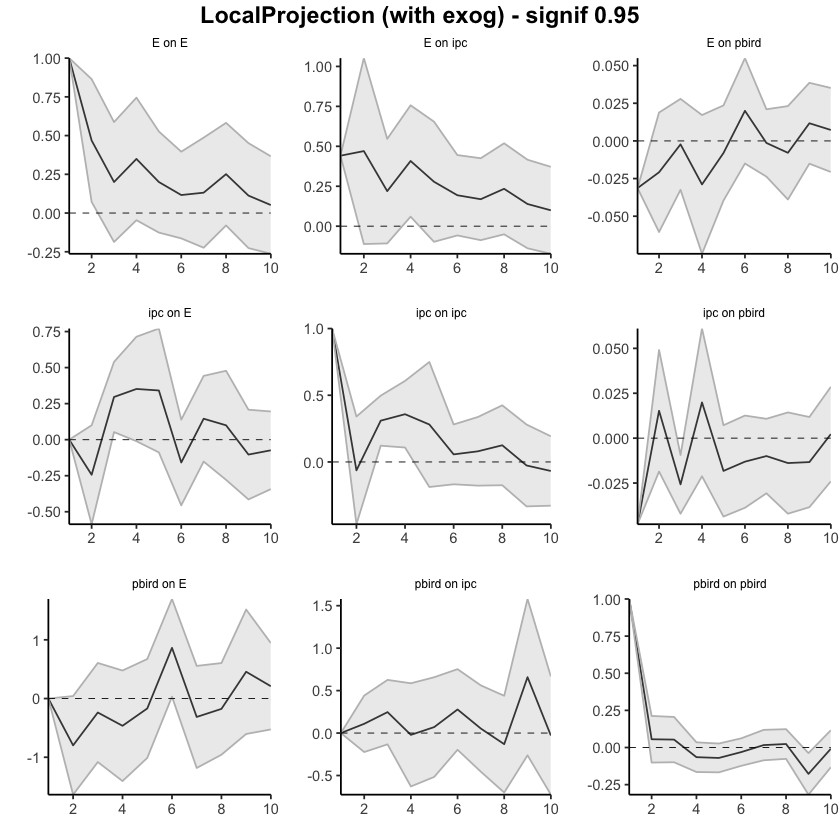

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Ptrigo_USA"), fixed_lags = 5, horizons=10, signif = 0.95)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,5,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.000000000,0.000000000,0.00000000
24,ipc,E,2,-0.243433883,-0.418496571,-0.06837119
25,ipc,E,3,0.296093678,0.171807360,0.42038000
26,ipc,E,4,0.351731732,0.166852498,0.53661097
27,ipc,E,5,0.341345329,0.122234219,0.56045644
28,ipc,E,6,-0.158505009,-0.310068569,-0.00694145
29,ipc,E,7,0.145319197,-0.006315831,0.29695422
30,ipc,E,8,0.099667493,-0.093386668,0.29272165
31,ipc,E,9,-0.103384020,-0.262183651,0.05541561


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.00000000,0.00000000,0.00000000
46,pbird,E,2,-0.79741724,-1.22577496,-0.36905953
47,pbird,E,3,-0.23798580,-0.66845315,0.19248155
48,pbird,E,4,-0.46421800,-0.94445102,0.01601503
49,pbird,E,5,-0.16919373,-0.59880102,0.26041356
50,pbird,E,6,0.86330791,0.43880247,1.28781335
51,pbird,E,7,-0.31339281,-0.75683321,0.13004760
52,pbird,E,8,-0.17640186,-0.57469653,0.22189281
53,pbird,E,9,0.45592442,-0.08477525,0.99662409


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.44126099,0.441260991,0.4412610
2,E,ipc,2,0.47014263,0.173286107,0.7669992
3,E,ipc,3,0.21938910,0.052461246,0.3863170
4,E,ipc,4,0.40809522,0.230278474,0.5859120
5,E,ipc,5,0.27829618,0.086441015,0.4701513
6,E,ipc,6,0.19370950,0.065366915,0.3220521
7,E,ipc,7,0.16889639,0.038109230,0.2996836
8,E,ipc,8,0.23402299,0.088668419,0.3793776
9,E,ipc,9,0.13892575,-0.002459751,0.2803112


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.00000000,0.00000000,0.0000000
57,pbird,ipc,2,0.10917529,-0.06057186,0.2789224
58,pbird,ipc,3,0.24670342,0.05308638,0.4403205
59,pbird,ipc,4,-0.02133452,-0.33133386,0.2886648
60,pbird,ipc,5,0.07043372,-0.22910689,0.3699743
61,pbird,ipc,6,0.27785663,0.03564299,0.5200703
62,pbird,ipc,7,0.05283611,-0.20646324,0.3121355
63,pbird,ipc,8,-0.13067010,-0.42142817,0.1600880
64,pbird,ipc,9,0.65842430,0.18872353,1.1281251


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.031327349,-0.031327349,-0.0313273490
13,E,pbird,2,-0.020825887,-0.041066279,-0.0005854938
14,E,pbird,3,-0.002289673,-0.017690553,0.0131112074
15,E,pbird,4,-0.028884867,-0.052384601,-0.0053851318
16,E,pbird,5,-0.008032287,-0.024152666,0.0080880924
17,E,pbird,6,0.019973817,0.002119612,0.0378280214
18,E,pbird,7,-0.001360540,-0.012768494,0.0100474136
19,E,pbird,8,-0.007888819,-0.023709160,0.0079315228
20,E,pbird,9,0.011727325,-0.001973142,0.0254277921


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.047921084,-0.047921084,-4.792108e-02
35,ipc,pbird,2,0.015243747,-0.002012977,3.250047e-02
36,ipc,pbird,3,-0.025737290,-0.034074729,-1.739985e-02
37,ipc,pbird,4,0.019897772,-0.001086135,4.088168e-02
38,ipc,pbird,5,-0.018236255,-0.031211965,-5.260546e-03
39,ipc,pbird,6,-0.013090063,-0.026190927,1.080064e-05
40,ipc,pbird,7,-0.009964986,-0.020545919,6.159470e-04
41,ipc,pbird,8,-0.013862285,-0.028250094,5.255241e-04
42,ipc,pbird,9,-0.013326470,-0.026134956,-5.179843e-04


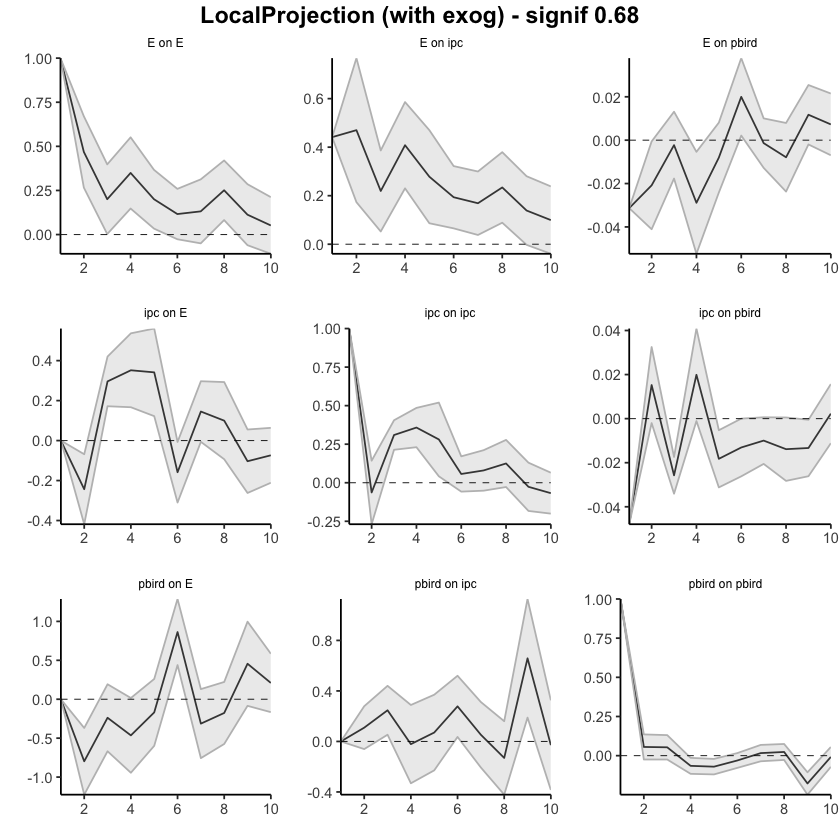

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Ptrigo_USA"), fixed_lags = 5, horizons=10, signif = 0.68)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,5,0,1,0.95,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.95

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.0000000,0.0000000,0.00000000
24,ipc,E,2,-0.2434339,-0.5865568,0.09968899
25,ipc,E,3,0.0526598,-0.5340643,0.63938385
26,ipc,E,4,0.4043915,-0.5446958,1.35347888
27,ipc,E,5,0.7457369,-0.6328083,2.12428198
28,ipc,E,6,0.5872318,-1.0883779,2.26284155
29,ipc,E,7,0.7325510,-1.2402633,2.70536540
30,ipc,E,8,0.8322185,-1.5189820,3.18341905
31,ipc,E,9,0.7288345,-1.9336133,3.39128231


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.00000000
46,pbird,E,2,-0.7974172,-1.636998,0.04216387
47,pbird,E,3,-1.0354030,-2.718700,0.64789407
48,pbird,E,4,-1.4996210,-4.124175,1.12493280
49,pbird,E,5,-1.6688148,-5.135399,1.79776936
50,pbird,E,6,-0.8055069,-5.104122,3.49310792
51,pbird,E,7,-1.1188997,-6.286658,4.04885831
52,pbird,E,8,-1.2953015,-7.243717,4.65311400
53,pbird,E,9,-0.8393771,-7.847564,6.16880977


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4412610,0.44126099,0.441261
2,E,ipc,2,0.9114036,0.32956484,1.493242
3,E,ipc,3,1.1307927,0.22177534,2.039810
4,E,ipc,4,1.5388879,0.28134974,2.796426
5,E,ipc,5,1.8171841,0.18360979,3.450758
6,E,ipc,6,2.0108936,0.12576783,3.896019
7,E,ipc,7,2.1797900,0.03832138,4.321259
8,E,ipc,8,2.4138130,-0.01255059,4.840177
9,E,ipc,9,2.5527388,-0.15074042,5.256218


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.0000000,0.0000000,0.0000000
57,pbird,ipc,2,0.1091753,-0.2235291,0.4418797
58,pbird,ipc,3,0.3558787,-0.3563151,1.0680725
59,pbird,ipc,4,0.3345442,-0.9852483,1.6543367
60,pbird,ipc,5,0.4049779,-1.5019142,2.3118701
61,pbird,ipc,6,0.6828346,-1.6987963,3.0644654
62,pbird,ipc,7,0.7356707,-2.1541869,3.6255283
63,pbird,ipc,8,0.6050006,-2.8547429,4.0647440
64,pbird,ipc,9,1.2634249,-3.1169321,5.6437818


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03132735,-0.03132735,-0.03132735
13,E,pbird,2,-0.05215324,-0.09182441,-0.01248207
14,E,pbird,3,-0.05444291,-0.12429980,0.01541399
15,E,pbird,4,-0.08332777,-0.19924415,0.03258860
16,E,pbird,5,-0.09136006,-0.23887238,0.05615226
17,E,pbird,6,-0.07138625,-0.25389280,0.11112031
18,E,pbird,7,-0.07274679,-0.27761293,0.13211936
19,E,pbird,8,-0.08063560,-0.31650962,0.15523841
20,E,pbird,9,-0.06890828,-0.33163521,0.19381865


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.04792108,-0.04792108,-0.047921084
35,ipc,pbird,2,-0.03267734,-0.06650052,0.001145842
36,ipc,pbird,3,-0.05841463,-0.10857919,-0.008250065
37,ipc,pbird,4,-0.03851685,-0.12980987,0.052776166
38,ipc,pbird,5,-0.05675311,-0.17347852,0.059972301
39,ipc,pbird,6,-0.06984317,-0.21224628,0.072559931
40,ipc,pbird,7,-0.07980816,-0.24294989,0.083333574
41,ipc,pbird,8,-0.09367044,-0.28501228,0.097671395
42,ipc,pbird,9,-0.10699691,-0.32344338,0.109449557


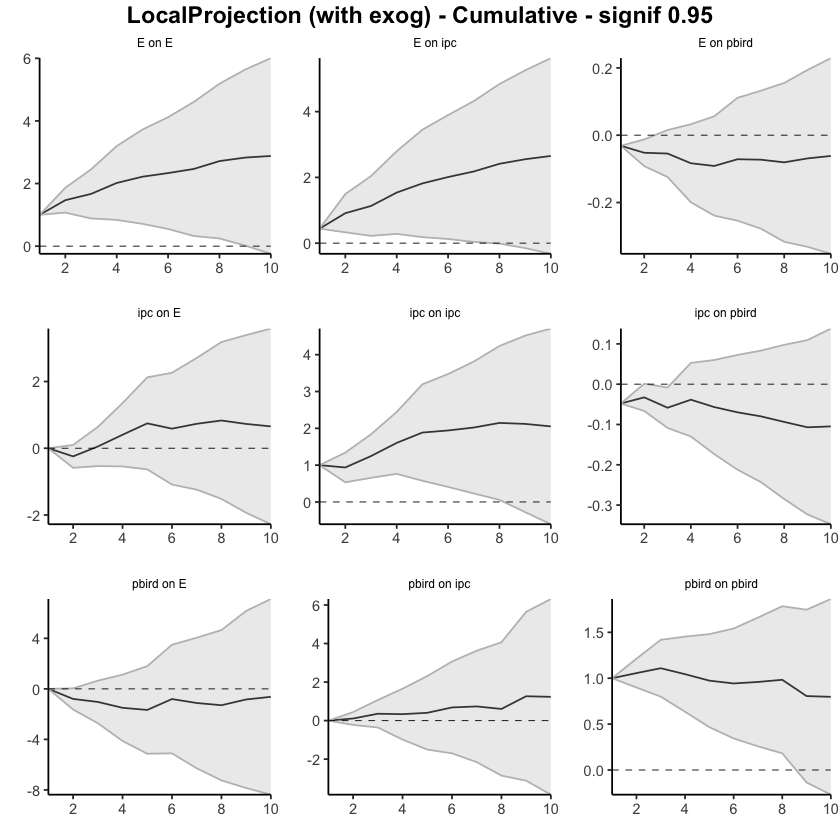

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Ptrigo_USA"), fixed_lags = 5, horizons=10, signif = 0.95, cumulative = TRUE)

Run configurations:

lags_endog_lin,lags_endog_nl,lags_criterion,max_lags,lags_exog,trend,shock_type,confint,hor,use_nw,nw_prewhite,nw_lag,adjust_se,use_twosls,model_type,starts,ends,column_names,endog
<dbl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<int>,<chr>,<int>
5,NA,NaN,NA,5,0,1,0.68,10,TRUE,TRUE,NA,FALSE,FALSE,0,1,295,"E, ipc, pbird",3


LocalProjection (with exog) - Cumulative - signif 0.68

,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
23,ipc,E,1,0.0000000,0.00000000,0.00000000
24,ipc,E,2,-0.2434339,-0.41849657,-0.06837119
25,ipc,E,3,0.0526598,-0.24668921,0.35200880
26,ipc,E,4,0.4043915,-0.07983671,0.88861977
27,ipc,E,5,0.7457369,0.04239751,1.44907621
28,ipc,E,6,0.5872318,-0.26767106,1.44213476
29,ipc,E,7,0.7325510,-0.27398689,1.73908898
30,ipc,E,8,0.8322185,-0.36737356,2.03181064
31,ipc,E,9,0.7288345,-0.62955721,2.08722625


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
45,pbird,E,1,0.0000000,0.000000,0.0000000
46,pbird,E,2,-0.7974172,-1.225775,-0.3690595
47,pbird,E,3,-1.0354030,-1.894228,-0.1765780
48,pbird,E,4,-1.4996210,-2.838679,-0.1605630
49,pbird,E,5,-1.6688148,-3.437480,0.0998506
50,pbird,E,6,-0.8055069,-2.998678,1.3876639
51,pbird,E,7,-1.1188997,-3.755511,1.5177115
52,pbird,E,8,-1.2953015,-4.330207,1.7396044
53,pbird,E,9,-0.8393771,-4.414983,2.7362284


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
1,E,ipc,1,0.4412610,0.4412610,0.441261
2,E,ipc,2,0.9114036,0.6145471,1.208260
3,E,ipc,3,1.1307927,0.6670083,1.594577
4,E,ipc,4,1.5388879,0.8972868,2.180489
5,E,ipc,5,1.8171841,0.9837278,2.650640
6,E,ipc,6,2.0108936,1.0490947,2.972693
7,E,ipc,7,2.1797900,1.0872040,3.272376
8,E,ipc,8,2.4138130,1.1758724,3.651754
9,E,ipc,9,2.5527388,1.1734126,3.932065


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
56,pbird,ipc,1,0.0000000,0.000000000,0.0000000
57,pbird,ipc,2,0.1091753,-0.060571860,0.2789224
58,pbird,ipc,3,0.3558787,-0.007485478,0.7192429
59,pbird,ipc,4,0.3345442,-0.338819336,1.0079077
60,pbird,ipc,5,0.4049779,-0.567926230,1.3778821
61,pbird,ipc,6,0.6828346,-0.532283245,1.8979524
62,pbird,ipc,7,0.7356707,-0.738746484,2.2100878
63,pbird,ipc,8,0.6050006,-1.160174652,2.3701758
64,pbird,ipc,9,1.2634249,-0.971451118,3.4983008


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
12,E,pbird,1,-0.03132735,-0.03132735,-0.03132735
13,E,pbird,2,-0.05215324,-0.07239363,-0.03191284
14,E,pbird,3,-0.05444291,-0.09008418,-0.01880164
15,E,pbird,4,-0.08332777,-0.14246878,-0.02418677
16,E,pbird,5,-0.09136006,-0.16662145,-0.01609867
17,E,pbird,6,-0.07138625,-0.16450184,0.02172935
18,E,pbird,7,-0.07274679,-0.17727033,0.03177676
19,E,pbird,8,-0.08063560,-0.20097949,0.03970828
20,E,pbird,9,-0.06890828,-0.20295263,0.06513608


,impulse,response,horizon,irf_value,lower_bound,upper_bound
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>
34,ipc,pbird,1,-0.04792108,-0.04792108,-0.047921084
35,ipc,pbird,2,-0.03267734,-0.04993406,-0.015420613
36,ipc,pbird,3,-0.05841463,-0.08400879,-0.032820463
37,ipc,pbird,4,-0.03851685,-0.08509493,0.008061217
38,ipc,pbird,5,-0.05675311,-0.11630689,0.002800672
39,ipc,pbird,6,-0.06984317,-0.14249782,0.002811472
40,ipc,pbird,7,-0.07980816,-0.16304374,0.003427419
41,ipc,pbird,8,-0.09367044,-0.19129383,0.003952943
42,ipc,pbird,9,-0.10699691,-0.21742879,0.003434959


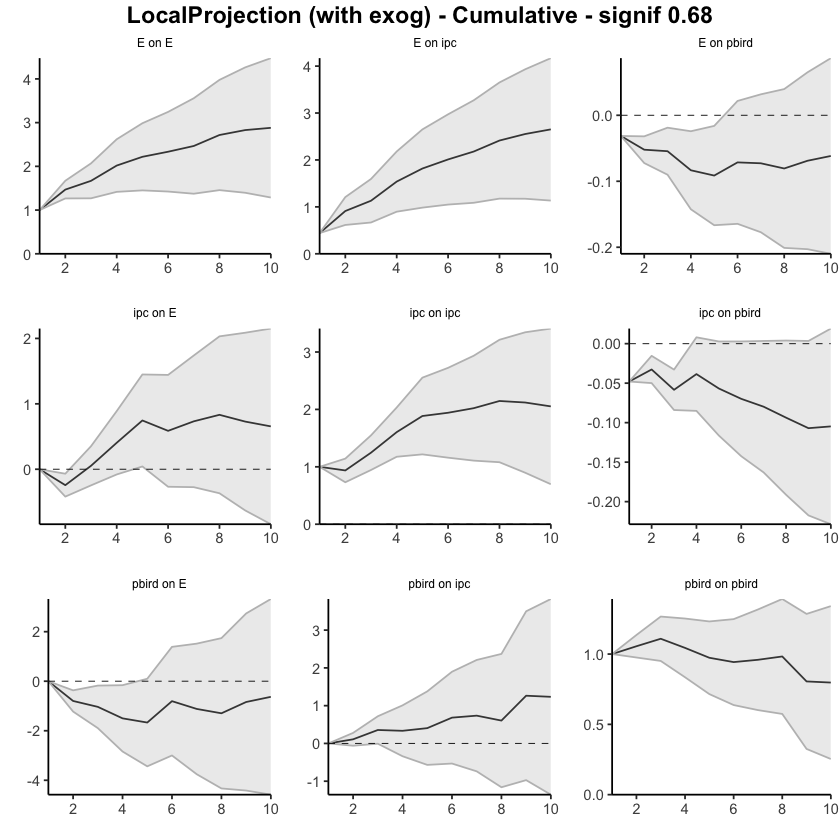

In [ ]:
res <- run_lp_model(df_ERPT_Arg, endog=c("E", "ipc", "pbird"), exog=c("Ptrigo_USA"), fixed_lags = 5, horizons=10, signif = 0.68, cumulative = TRUE)